In [2]:
import xarray as xr
import matplotlib.pyplot as plt
import os
import numpy as np
import unixFunctionsMITgcm_final as fc

In [3]:
data=fc.loadMITgcmData(filename='seaiceflux', members=[0,1])

Loading number:0


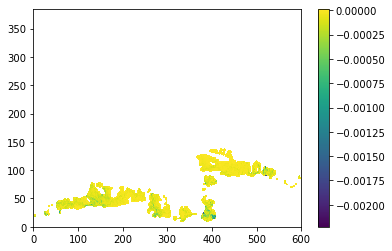

In [14]:

data1=data.where(data['SHIfwFlx']!=0)
plt.pcolor(data1['SHIfwFlx'].values[0,500,:,:])
plt.colorbar()

In [23]:
vmax=data['SHIfwFlx'].quantile(0.99).to_numpy()
vmin=data['SHIfwFlx'].quantile(0.01).to_numpy()
print(vmin)
print(vmax)

-0.00015257067600032314
0.0


In [206]:
#Reading the data.
full='/data/hpcdata/users/grejan/mitgcm/data'
total={}
units={}
longnames={}
#from unixFunctionsMITgcm_final import read_all_data
total, units, longnames=fc.read_all_data(full, total, units, longnames, kind='isotherm')
total, units, longnames=fc.read_all_data(full, total, units, longnames, kind='final')
total, units, longnames=fc.read_all_data(full, total, units, longnames, kind='ohc')
total, units, longnames=fc.read_all_data(full, total, units, longnames, kind='seaice')
total, units, longnames=fc.read_all_data(full, total, units, longnames, kind='trough')

/data/hpcdata/users/grejan/mitgcm/unixFunctionsMITgcm_final.py:431: RuntimeWarning: Converting a CFTimeIndex with dates from a non-standard calendar, 'noleap', to a pandas.DatetimeIndex, which uses dates from the standard calendar.  This may lead to subtle errors in operations that depend on the length of time between dates.
  total[var]=pd.DataFrame(data=ts.values.T, columns=names, index=ts.indexes['time'].to_datetimeindex())
/data/hpcdata/users/grejan/mitgcm/unixFunctionsMITgcm_final.py:439: RuntimeWarning: Converting a CFTimeIndex with dates from a non-standard calendar, 'noleap', to a pandas.DatetimeIndex, which uses dates from the standard calendar.  This may lead to subtle errors in operations that depend on the length of time between dates.
  total[varb]=pd.DataFrame(data=ts.values.T, columns=names, index=ts.indexes['time'].to_datetimeindex())
/data/hpcdata/users/grejan/mitgcm/unixFunctionsMITgcm_final.py:431: RuntimeWarning: Converting a CFTimeIndex with dates from a non-standa

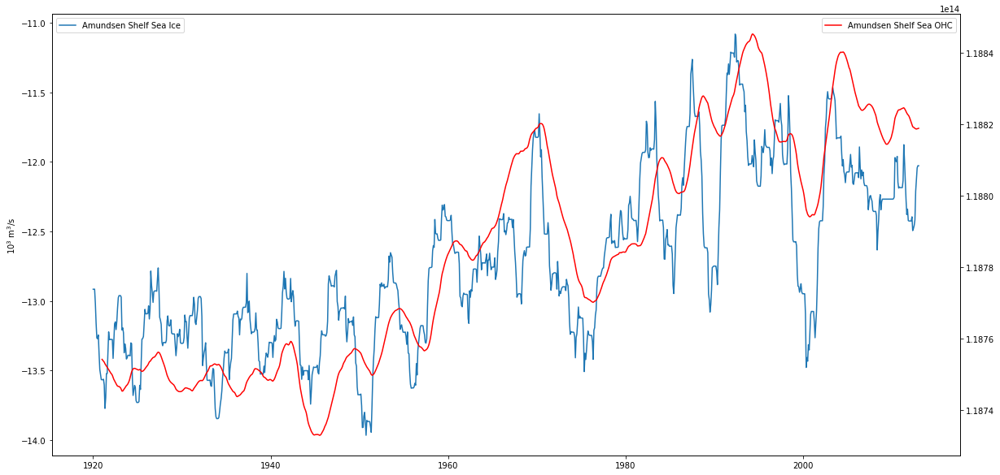

In [3]:
plt.figure(figsize=(20,10))
plt.plot(total['amundsen_shelf_seaice_freeze'].index, total['amundsen_shelf_seaice_freeze'].mean(axis=1).rolling(24, center=True).mean(), label='Amundsen Shelf Sea Ice')
plt.ylabel(units['amundsen_shelf_seaice_freeze'])
plt.legend(loc='upper left')
plt.twinx()
plt.plot(total['amundsen_shelf_ohc_below_0m']['1920':'2013'].index, total['amundsen_shelf_ohc_below_0m']['1920':'2013'].mean(axis=1).rolling(24, center=True).mean(), label='Amundsen Shelf Sea OHC', c='r')
plt.legend(loc='upper right')

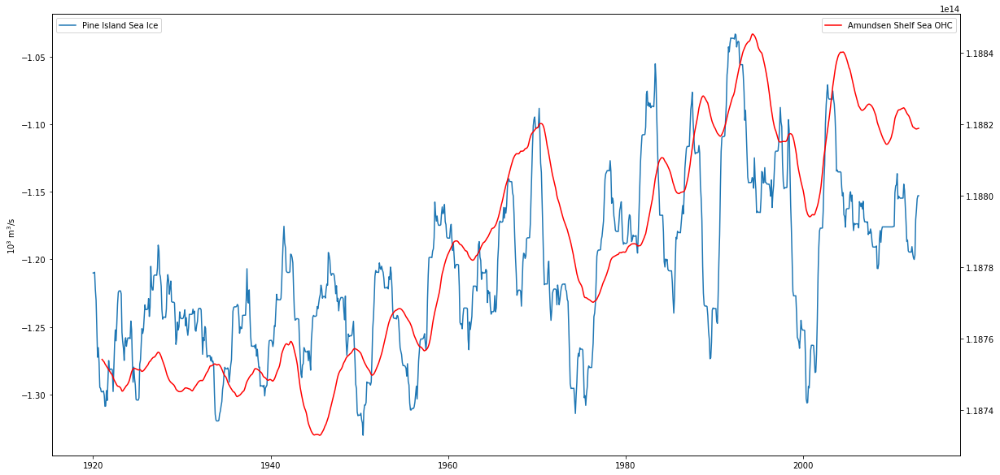

In [4]:
plt.figure(figsize=(20,10))
plt.plot(total['pine_island_bay_seaice_freeze'].index, total['pine_island_bay_seaice_freeze'].mean(axis=1).rolling(24, center=True).mean(), label='Pine Island Sea Ice')
plt.ylabel(units['pine_island_bay_seaice_freeze'])
plt.legend(loc='upper left')
plt.twinx()
plt.plot(total['amundsen_shelf_ohc_below_0m']['1920':'2013'].index, total['amundsen_shelf_ohc_below_0m']['1920':'2013'].mean(axis=1).rolling(24, center=True).mean(), label='Amundsen Shelf Sea OHC', c='r')
plt.legend(loc='upper right')

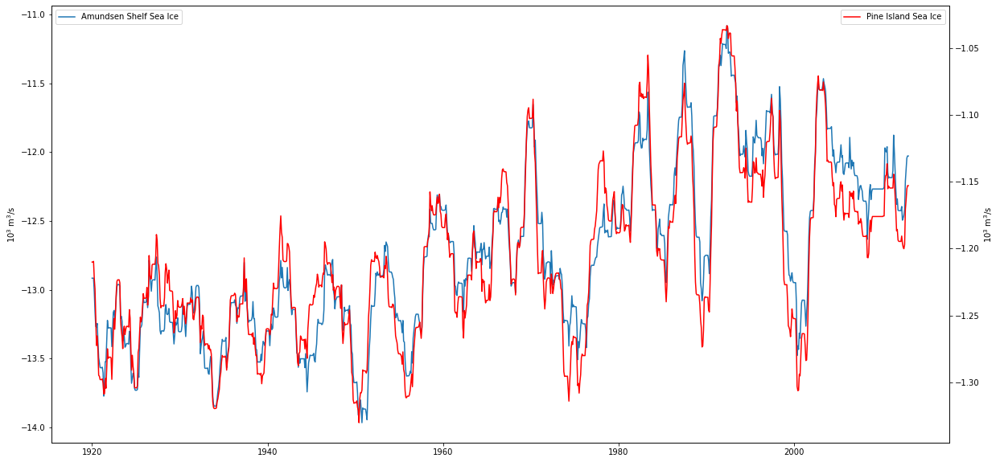

In [5]:
plt.figure(figsize=(20,10))
plt.plot(total['amundsen_shelf_seaice_freeze'].index, total['amundsen_shelf_seaice_freeze'].mean(axis=1).rolling(24, center=True).mean(), label='Amundsen Shelf Sea Ice')
plt.ylabel(units['amundsen_shelf_seaice_freeze'])
plt.legend(loc='upper left')
plt.twinx()
plt.plot(total['pine_island_bay_seaice_freeze'].index, total['pine_island_bay_seaice_freeze'].mean(axis=1).rolling(24, center=True).mean(), label='Pine Island Sea Ice', c='r')
plt.ylabel(units['pine_island_bay_seaice_freeze'])
plt.legend(loc='upper right')

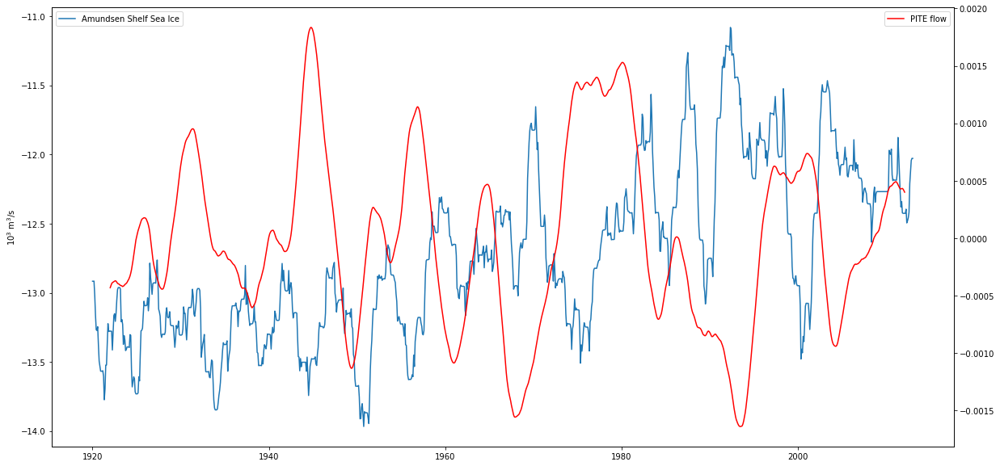

In [26]:
plt.figure(figsize=(20,10))
plt.plot(total['amundsen_shelf_seaice_freeze'].index, total['amundsen_shelf_seaice_freeze'].mean(axis=1).rolling(24, center=True).mean(), label='Amundsen Shelf Sea Ice')
plt.ylabel(units['amundsen_shelf_seaice_freeze'])
plt.legend(loc='upper left')
plt.twinx()
plt.plot(total['PITE']['1920':'2013'].index, total['PITE']['1920':'2013'].mean(axis=1).rolling(24, center=True).mean(), label='PITE flow', c='r')
plt.legend(loc='upper right')


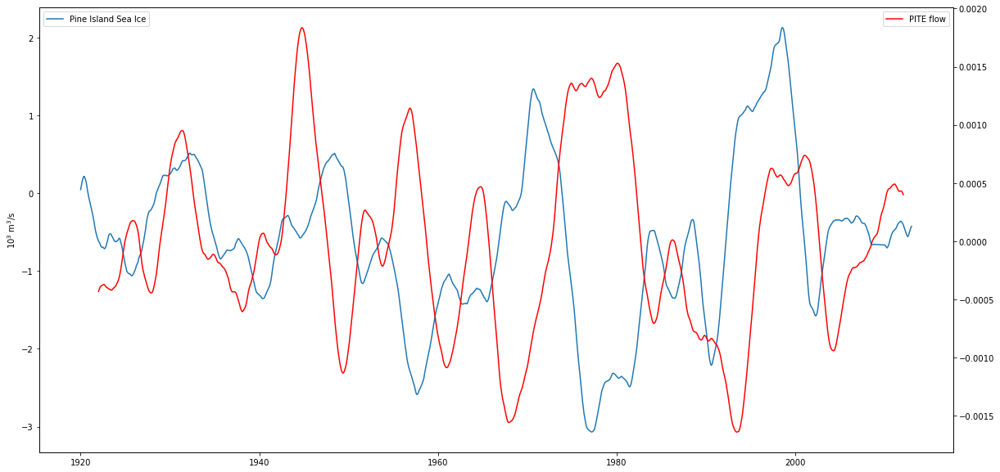

In [28]:
plt.figure(figsize=(20,10))
plt.plot(total['pine_island_bay_seaice_freeze'].index, (total['pine_island_bay_seaice_freeze'].mean(axis=1).rolling(2*12, center=True).mean()
                                                        -total['pine_island_bay_seaice_freeze'].mean(axis=1).rolling(25*12, min_periods=5*12, center=True).mean()).cumsum(), label='Cumulative Sum Pine Island Sea Ice Freeze')
plt.ylabel(units['pine_island_bay_seaice_freeze'])
plt.legend(loc='upper left')
plt.twinx()
plt.plot(total['PITE']['1920':'2013'].index, total['PITE']['1920':'2013'].mean(axis=1).rolling(2*12, center=True).mean(), label='PITE flow', c='r')
plt.legend(loc='upper right')

Text(0, 0.5, 'GJ')

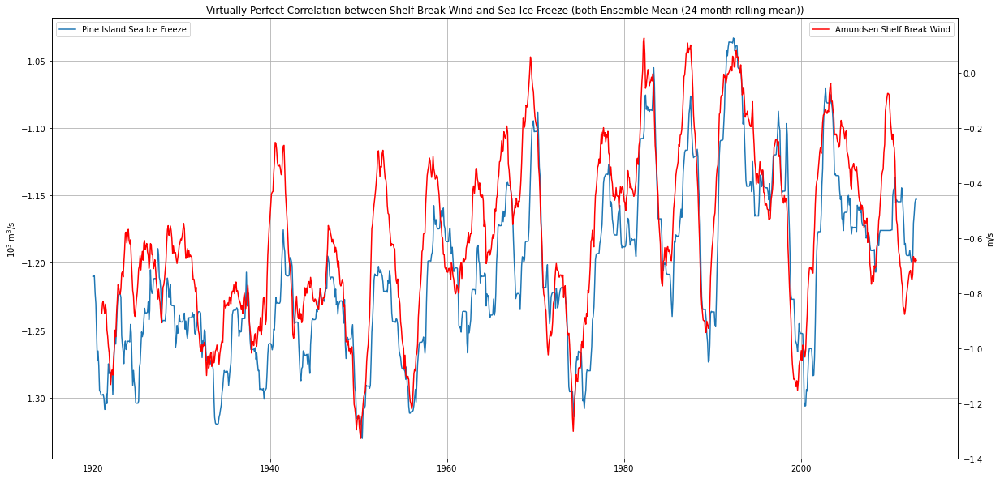

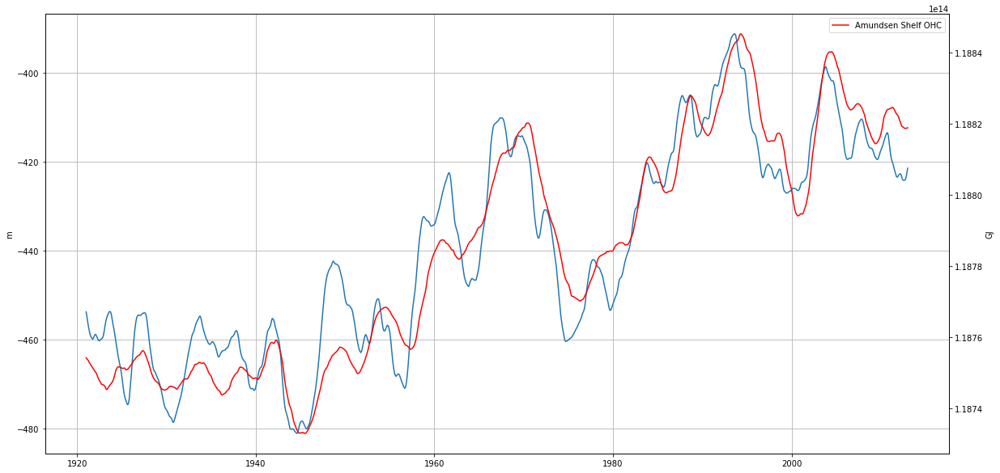

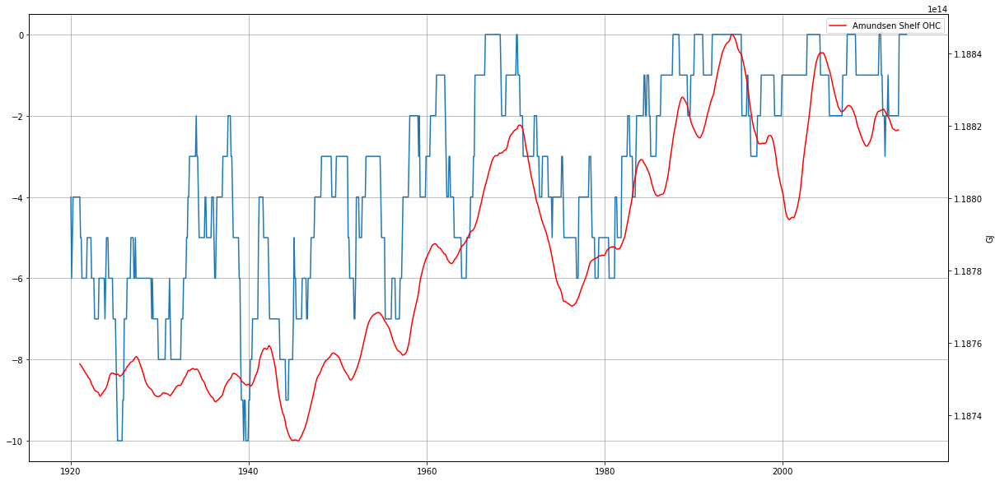

In [52]:
plt.figure(figsize=(20,10))
plt.plot(total['pine_island_bay_seaice_freeze'].index, total['pine_island_bay_seaice_freeze'].mean(axis=1).rolling(2*12, center=True).mean(), label='Pine Island Sea Ice Freeze')
plt.ylabel(units['pine_island_bay_seaice_freeze'])
plt.grid(True)
plt.legend(loc='upper left')
plt.twinx()
plt.plot(total['amundsen_shelf_break_uwind_avg']['1920':'2013'].index, total['amundsen_shelf_break_uwind_avg']['1920':'2013'].mean(axis=1).rolling(2*12, center=True).mean(), label='Amundsen Shelf Break Wind', c='r')
plt.legend(loc='upper right')
plt.ylabel(units['amundsen_shelf_break_uwind_avg'])
plt.title('Virtually Perfect Correlation between Shelf Break Wind and Sea Ice Freeze (both Ensemble Mean (24 month rolling mean))')

plt.figure(figsize=(20,10))
plt.plot(total['pine_island_bay_isotherm_0C_below_100m']['1920':'2013'].index, total['pine_island_bay_isotherm_0C_below_100m']['1920':'2013'].mean(axis=1).rolling(2*12, center=True).mean(), label='Pine Island Sea Ice Freeze')
plt.ylabel(units['pine_island_bay_isotherm_0C_below_100m'])
plt.grid(True)
plt.twinx()
plt.plot(total['amundsen_shelf_ohc_below_0m']['1920':'2013'].index, total['amundsen_shelf_ohc_below_0m']['1920':'2013'].mean(axis=1).rolling(2*12, center=True).mean(), label='Amundsen Shelf OHC', c='r')
plt.legend(loc='upper right')
plt.ylabel(units['amundsen_shelf_ohc_below_0m'])


Text(0.5, 1.0, 'Virtually Perfect Correlation between Shelf Break Wind and Sea Ice Freeze (both Ensemble Mean (24 month rolling mean))')

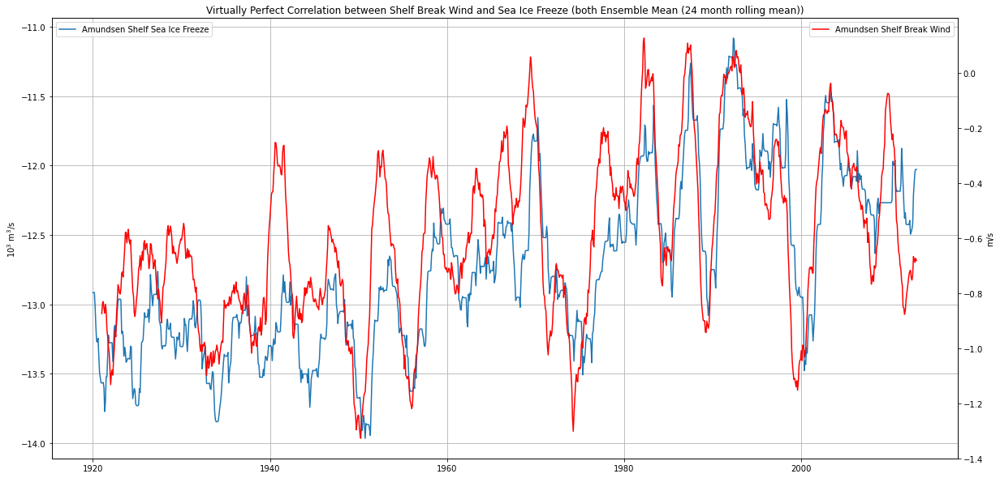

In [49]:
plt.figure(figsize=(20,10))
plt.plot(total['amundsen_shelf_seaice_freeze'].index, total['amundsen_shelf_seaice_freeze'].mean(axis=1).rolling(2*12, center=True).mean(), label='Amundsen Shelf Sea Ice Freeze')
plt.ylabel(units['amundsen_shelf_seaice_freeze'])
plt.grid(True)
plt.legend(loc='upper left')
plt.twinx()
plt.plot(total['amundsen_shelf_break_uwind_avg']['1920':'2013'].index, total['amundsen_shelf_break_uwind_avg']['1920':'2013'].mean(axis=1).rolling(2*12, center=True).mean(), label='Amundsen Shelf Break Wind', c='r')
plt.legend(loc='upper right')
plt.ylabel(units['amundsen_shelf_break_uwind_avg'])
plt.title('Virtually Perfect Correlation between Shelf Break Wind and Sea Ice Freeze (both Ensemble Mean (24 month rolling mean))')

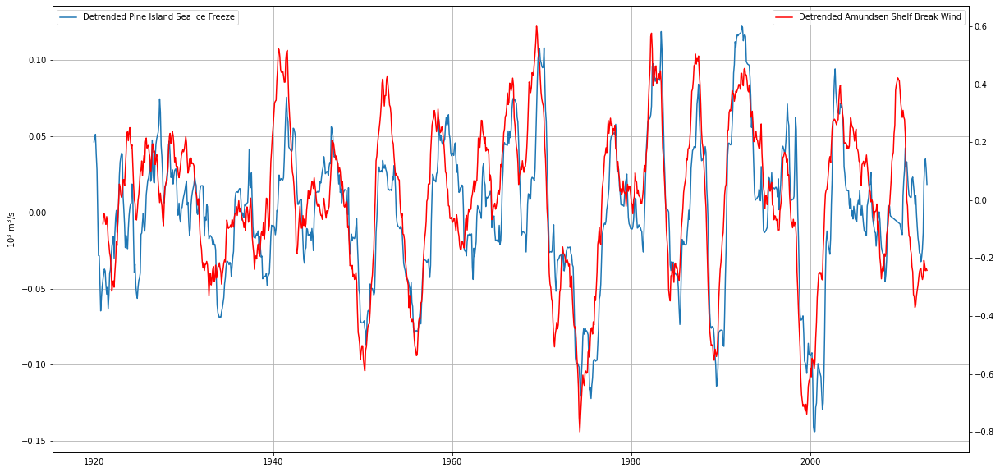

In [34]:
plt.figure(figsize=(20,10))
plt.plot(total['pine_island_bay_seaice_freeze'].index, (total['pine_island_bay_seaice_freeze'].mean(axis=1).rolling(2*12, center=True).mean()
                                                        -total['pine_island_bay_seaice_freeze'].mean(axis=1).rolling(25*12, min_periods=5*12, center=True).mean()), label='Detrended Pine Island Sea Ice Freeze')
plt.ylabel(units['pine_island_bay_seaice_freeze'])
plt.legend(loc='upper left')
plt.grid(True)
plt.twinx()
plt.plot(total['amundsen_shelf_break_uwind_avg']['1920':'2013'].index, (total['amundsen_shelf_break_uwind_avg']['1920':'2013'].mean(axis=1).rolling(2*12, center=True).mean()
                                                                        -total['amundsen_shelf_break_uwind_avg']['1920':'2013'].mean(axis=1).rolling(25*12, min_periods=5*12, center=True).mean()), label='Detrended Amundsen Shelf Break Wind', c='r')
plt.legend(loc='upper right')

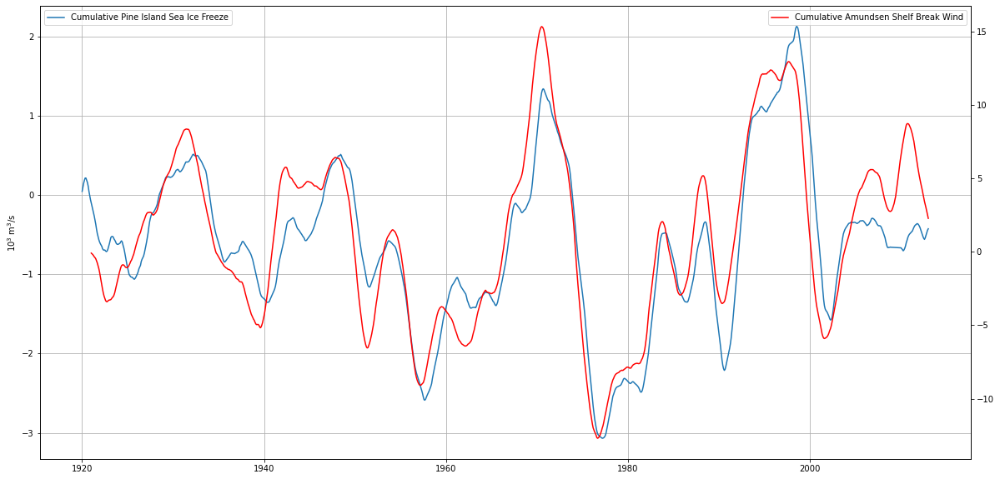

In [33]:
plt.figure(figsize=(20,10))
plt.plot(total['pine_island_bay_seaice_freeze'].index, (total['pine_island_bay_seaice_freeze'].mean(axis=1).rolling(2*12, center=True).mean()
                                                        -total['pine_island_bay_seaice_freeze'].mean(axis=1).rolling(25*12, min_periods=5*12, center=True).mean()).cumsum(), label='Cumulative Pine Island Sea Ice Freeze')
plt.ylabel(units['pine_island_bay_seaice_freeze'])
plt.legend(loc='upper left')
plt.grid(True)
plt.twinx()
plt.plot(total['amundsen_shelf_break_uwind_avg']['1920':'2013'].index, (total['amundsen_shelf_break_uwind_avg']['1920':'2013'].mean(axis=1).rolling(2*12, center=True).mean()
                                                                        -total['amundsen_shelf_break_uwind_avg']['1920':'2013'].mean(axis=1).rolling(25*12, min_periods=5*12, center=True).mean()).cumsum(), label='Cumulative Amundsen Shelf Break Wind', c='r')
plt.legend(loc='upper right')

Text(0, 0.5, '[m/s]')

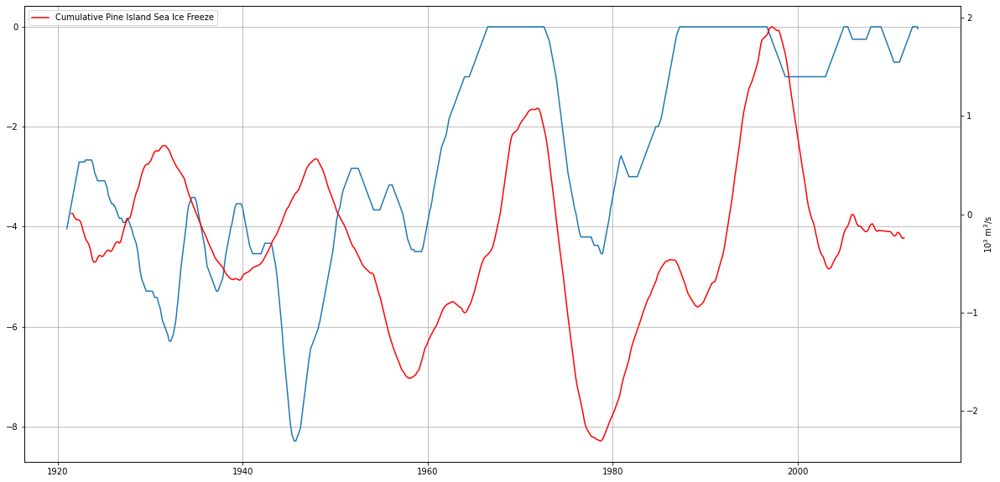

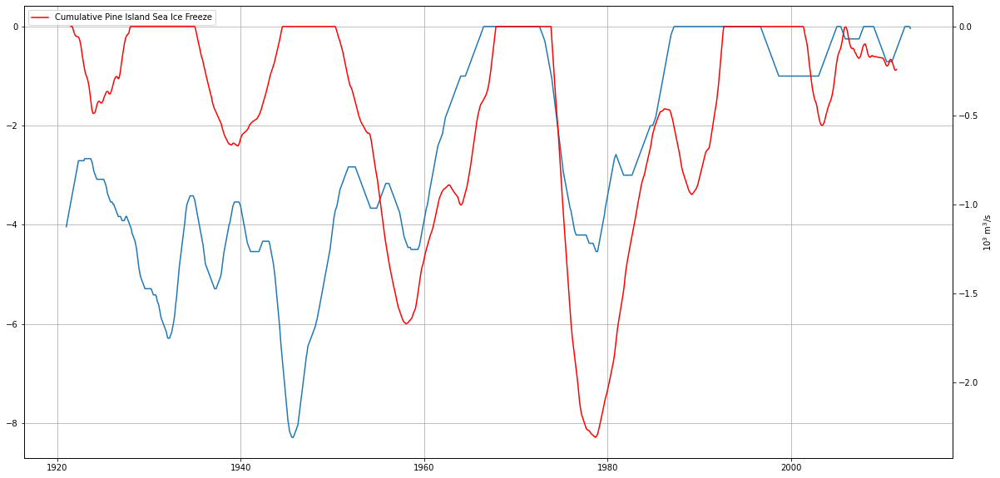

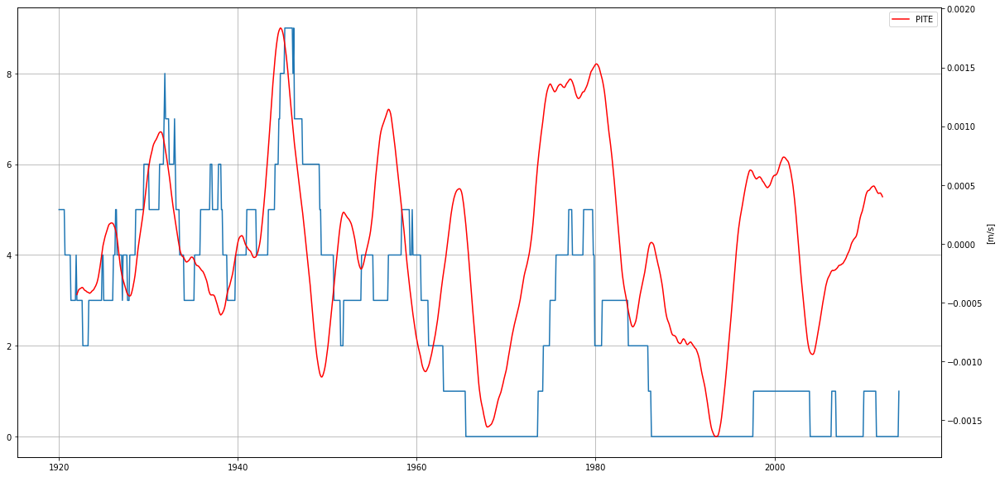

In [ ]:
choose='only'

if choose=='full':
    title='Selecting lines based on omitting all lines with convection between 1940-1945'
    convection=(total['amundsen_shelf_isotherm_0.5C_below_100m'].rolling(24, center=True).mean()<-440) & (total['pine_island_bay_isotherm_0C_below_100m'].rolling(24, center=True).mean()<-470) & (total['dotson_bay_isotherm_-1C_below_100m'].rolling(24, center=True).mean()<-430)
elif choose=='only':
    title='Selecting lines based on PIB convection (1939-1942)'
    convection=(
                    total[ 'amundsen_shelf_isotherm_0.5C_below_100m'].rolling(24).mean()<-430 #| 
                    #total['pine_island_bay_isotherm_0C_below_100m'].rolling(24, center=True).mean()<-470#/600 
                    #total['dotson_bay_isotherm_-1C_below_100m'].rolling(24, center=True).mean()<-430
                    )
if choose=='two':
    title='Selecting lines based on omitting all lines with convection between 1940-1945'
    convection=(total['amundsen_shelf_isotherm_0.5C_below_100m'].rolling(24, center=True).mean()<-440) & (total['pine_island_bay_isotherm_0C_below_100m'].rolling(24, center=True).mean()<-470)# & (total['dotson_bay_isotherm_-1C_below_100m'].rolling(24, center=True).mean()<-430)


    
# plt.figure(figsize=(20,10))   
# plt.plot(convection['1920':'2013'].index, (-1*convection['1920':'2013'].sum(axis=1)))
# plt.grid(True)
# plt.twinx()
# plt.plot(total['amundsen_shelf_ohc_below_0m']['1920':'2013'].index, total['amundsen_shelf_ohc_below_0m']['1920':'2013'].mean(axis=1).rolling(2*12, center=True).mean(), label='Amundsen Shelf OHC', c='r')
# plt.legend(loc='upper right')
# plt.ylabel(units['amundsen_shelf_ohc_below_0m'])


# plt.figure(figsize=(20,10))   
# plt.plot(convection['1920':'2013'].index, (-1*convection['1920':'2013'].sum(axis=1).rolling(24, center=True).mean()))
# plt.grid(True)
# plt.twinx()
# plt.plot(total['pine_island_bay_seaice_freeze']['1920':'2013'].index, total['pine_island_bay_seaice_freeze']['1920':'2013'].mean(axis=1).rolling(5*12, center=True).mean(), label='Pine Island Sea Ice Freeze', c='r')
# plt.legend(loc='upper right')
# plt.ylabel(units['pine_island_bay_seaice_freeze'])

# plt.figure(figsize=(20,10))   
# plt.plot(convection['1920':'2013'].index, (-1*convection['1920':'2013'].sum(axis=1).rolling(24, center=True).mean()))
# plt.grid(True)
# plt.twinx()
# plt.plot(total['pine_island_bay_seaice_freeze']['1920':'2013'].index, np.minimum(total['pine_island_bay_seaice_freeze']['1920':'2013'].mean(axis=1).rolling(5*12, center=True).mean(), -1.2), label='Pine Island Sea Ice Freeze', c='r')
# plt.legend(loc='upper right')
# plt.ylabel(units['pine_island_bay_seaice_freeze'])


plt.figure(figsize=(20,10))   
plt.plot(convection['1920':'2013'].index, (-1*convection['1920':'2013'].sum(axis=1).rolling(24, center=True).mean()))
plt.grid(True)
plt.twinx()
plt.plot(total['pine_island_bay_seaice_freeze'].index, (total['pine_island_bay_seaice_freeze'].mean(axis=1).rolling(5*12, center=True).mean()
                                                        -total['pine_island_bay_seaice_freeze'].mean(axis=1).rolling(25*12, min_periods=5*12, center=True).mean()).cumsum(), label='Cumulative Pine Island Sea Ice Freeze', c='r')
plt.ylabel(units['pine_island_bay_seaice_freeze'])
plt.legend(loc='upper left')

plt.figure(figsize=(20,10))   
plt.plot(convection['1920':'2013'].index, (-1*convection['1920':'2013'].sum(axis=1).rolling(24, center=True).mean()))
plt.grid(True)
plt.twinx()
plt.plot(total['pine_island_bay_seaice_freeze'].index, np.minimum((total['pine_island_bay_seaice_freeze'].mean(axis=1).rolling(5*12, center=True).mean()
                                                        -total['pine_island_bay_seaice_freeze'].mean(axis=1).rolling(25*12, min_periods=5*12, center=True).mean()).cumsum(), 0), label='Cumulative Pine Island Sea Ice Freeze', c='r')
plt.ylabel(units['pine_island_bay_seaice_freeze'])
plt.legend(loc='upper left')












plt.figure(figsize=(20,10))   
plt.plot(convection['1920':'2013'].index, (convection['1920':'2013'].sum(axis=1)))#.rolling(24, center=True).mean()))
plt.grid(True)
plt.twinx()
plt.plot(total['PITE']['1920':'2013'].index, total['PITE']['1920':'2013'].mean(axis=1).rolling(2*12, center=True).mean(), label='PITE', c='r')
plt.legend(loc='upper right')
plt.ylabel(units['PITE'])

plt.figure(figsize=(20,10))   
plt.plot(convection['1920':'2013'].index, (convection['1920':'2013'].sum(axis=1).rolling(24, center=True).mean()))
plt.grid(True)
plt.twinx()
plt.plot(total['PITE']['1920':'2013'].index, total['PITE']['1920':'2013'].mean(axis=1).rolling(2*12, center=True).mean(), label='PITE', c='r')
plt.legend(loc='upper right')
plt.ylabel(units['PITE'])

In [39]:
#Load Data that we already have
data={}
data_dt={}

window=24

members='all'

var_list=['EXFuwind']
filenames={'EXFuwind':'zonal_winds', 
           'THETA':'new2_amundsen_shelf_temp_200to700', 
           'UVEL':'depth_averaged_UVEL', 
           'VVEL':'depth_averaged_VVEL',
           'curlTAU':'curl_tau', 
           'THETAW106':'theta_W106', 
           'THETAW120':'theta_W120',
           'THETAW103-5':'theta_W103-5',
           'THETAW100':'theta_W100',
           'THETAS72-5':'theta_S72-5',
           'UVELB':'bottom100m_averaged_UVEL', 
           'VVELB':'bottom100m_averaged_VVEL'}

for var in var_list: 
    print('Starting with: '+var)
    data[var]=fc.loadMITgcmData(filename=filenames[var], members=members)
    if 'VELB' in var:
        if 'U' in var:
            data[var]=data[var]-data['UVEL']
            data_dt[var]=fc.detrend_and_average_MITgcmData(data[var], 'UVEL', window=window)
        elif 'VVEL' in var:
            data[var]=data[var]-data['VVEL']
            data_dt[var]=fc.detrend_and_average_MITgcmData(data[var], 'VVEL', window=window)
    elif 'THETA' in var:
        data_dt[var]=fc.detrend_and_average_MITgcmData(data[var], 'THETA', window=window)
    else:
        data_dt[var]=fc.detrend_and_average_MITgcmData(data[var], var, window=window)

Starting with: EXFuwind
Loading number:0
Loading number:1
Loading number:2
Loading number:3
Loading number:4
Loading number:5
Loading number:6
Loading number:7
Loading number:8
Loading number:9
Loading number:10
Loading number:11
Loading number:12
Loading number:13
Loading number:14
Loading number:15
Loading number:16
Loading number:17
Loading number:18
Loading number:19


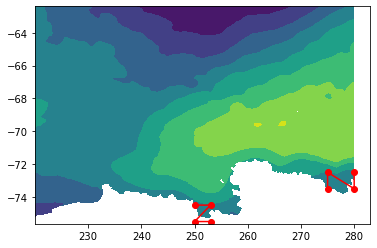

In [120]:
#data_dt['EXFuwind']=data_dt['EXFuwind'].where(data_dt['EXFuwind'] != 0)  
plt.contourf(data_dt['EXFuwind'].XC, data_dt['EXFuwind'].YC, data_dt['EXFuwind'].sel(time='194001').mean(dim='time').mean(dim='ens'))
x=[360-85, 360-85, 360-80, 360-80]
y=[-73.5, -72.5, -73.5, -72.5]
plt.plot(x,y, 'o-r')

oost=data_dt['EXFuwind'].sel(XC=slice(360-85, 360-80)).sel(YC=slice(-73.5, -72.5)).mean(dim='XC').mean(dim='YC')

x=[250, 253, 250, 253]
y=[-74.5, -74.5, -75.5, -75.5]
plt.plot(x,y, 'o-r')

west=data_dt['EXFuwind'].sel(XC=slice(250, 253)).sel(YC=slice(-75.5, -74.5)).mean(dim='XC').mean(dim='YC')

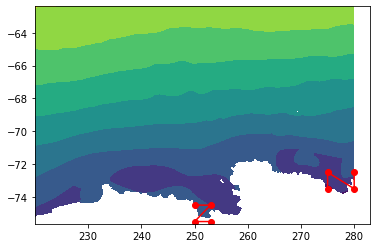

In [137]:
data['EXFuwind']=data['EXFuwind'].where(data['EXFuwind'] != 0)  
plt.contourf(data['EXFuwind'].XC, data['EXFuwind'].YC, data['EXFuwind']['EXFuwind'].sel(time='194001').mean(dim='time').mean(dim='ens'))
x=[360-85, 360-85, 360-80, 360-80]
y=[-73.5, -72.5, -73.5, -72.5]
plt.plot(x,y, 'o-r')

oostfull=data['EXFuwind']['EXFuwind'].sel(XC=slice(360-85, 360-80)).sel(YC=slice(-73.5, -72.5)).mean(dim='XC').mean(dim='YC')

x=[250, 253, 250, 253]
y=[-74.5, -74.5, -75.5, -75.5]
plt.plot(x,y, 'o-r')

westfull=data['EXFuwind']['EXFuwind'].sel(XC=slice(250, 253)).sel(YC=slice(-75.5, -74.5)).mean(dim='XC').mean(dim='YC')

/tmp/ipykernel_7595/425266205.py:2: RuntimeWarning: Converting a CFTimeIndex with dates from a non-standard calendar, 'noleap', to a pandas.DatetimeIndex, which uses dates from the standard calendar.  This may lead to subtle errors in operations that depend on the length of time between dates.
  plt.plot(oost.indexes['time'].to_datetimeindex(), oost.mean(dim='ens').values)
/tmp/ipykernel_7595/425266205.py:11: RuntimeWarning: Converting a CFTimeIndex with dates from a non-standard calendar, 'noleap', to a pandas.DatetimeIndex, which uses dates from the standard calendar.  This may lead to subtle errors in operations that depend on the length of time between dates.
  plt.plot(oost.indexes['time'].to_datetimeindex(), oost.mean(dim='ens').values)


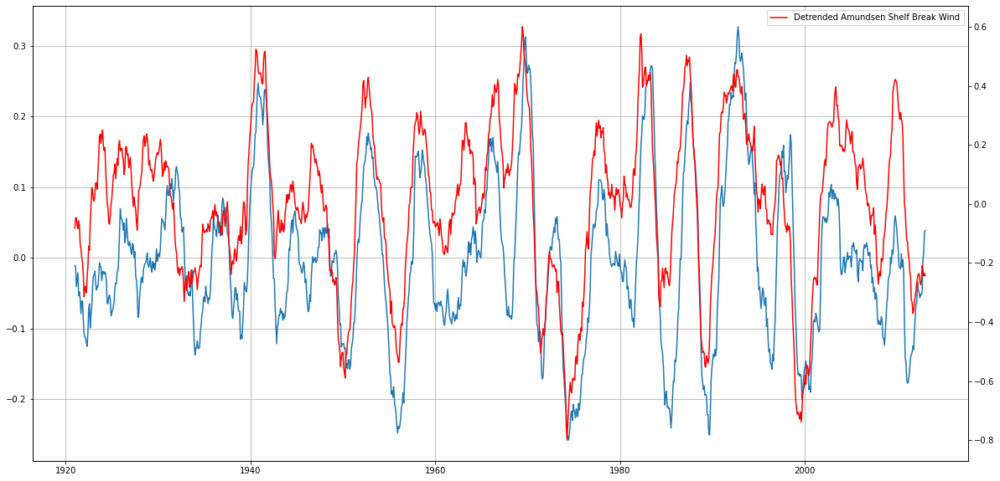

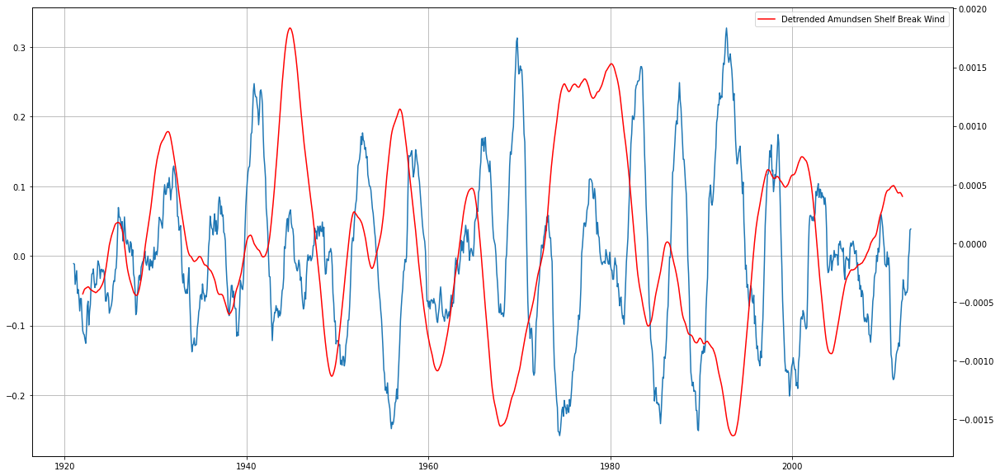

In [119]:
plt.figure(figsize=(20,10))
plt.plot(oost.indexes['time'].to_datetimeindex(), oost.mean(dim='ens').values)
plt.grid(True)
plt.twinx()
plt.plot(total['amundsen_shelf_break_uwind_avg']['1920':'2013'].index, (total['amundsen_shelf_break_uwind_avg']['1920':'2013'].mean(axis=1).rolling(2*12, center=True).mean()
                                                                        -total['amundsen_shelf_break_uwind_avg']['1920':'2013'].mean(axis=1).rolling(25*12, min_periods=5*12, center=True).mean()), label='Detrended Amundsen Shelf Break Wind', c='r')
plt.legend(loc='upper right')


plt.figure(figsize=(20,10))
plt.plot(oost.indexes['time'].to_datetimeindex(), oost.mean(dim='ens').values)
plt.grid(True)
plt.twinx()
plt.plot(total['PITE']['1920':'2013'].index, total['PITE']['1920':'2013'].mean(axis=1).rolling(2*12, center=True).mean(), label='Detrended Amundsen Shelf Break Wind', c='r')
plt.legend(loc='upper right')

/tmp/ipykernel_7595/2975398957.py:51: RuntimeWarning: Converting a CFTimeIndex with dates from a non-standard calendar, 'noleap', to a pandas.DatetimeIndex, which uses dates from the standard calendar.  This may lead to subtle errors in operations that depend on the length of time between dates.
  plt.plot(west.indexes['time'].to_datetimeindex(), (west.mean(dim='ens').values-oost.mean(dim='ens')).cumsum())
/tmp/ipykernel_7595/2975398957.py:59: RuntimeWarning: Converting a CFTimeIndex with dates from a non-standard calendar, 'noleap', to a pandas.DatetimeIndex, which uses dates from the standard calendar.  This may lead to subtle errors in operations that depend on the length of time between dates.
  plt.plot(west.indexes['time'].to_datetimeindex(), (west.mean(dim='ens').values-oost.mean(dim='ens')).cumsum())
/tmp/ipykernel_7595/2975398957.py:66: RuntimeWarning: Converting a CFTimeIndex with dates from a non-standard calendar, 'noleap', to a pandas.DatetimeIndex, which uses dates from t

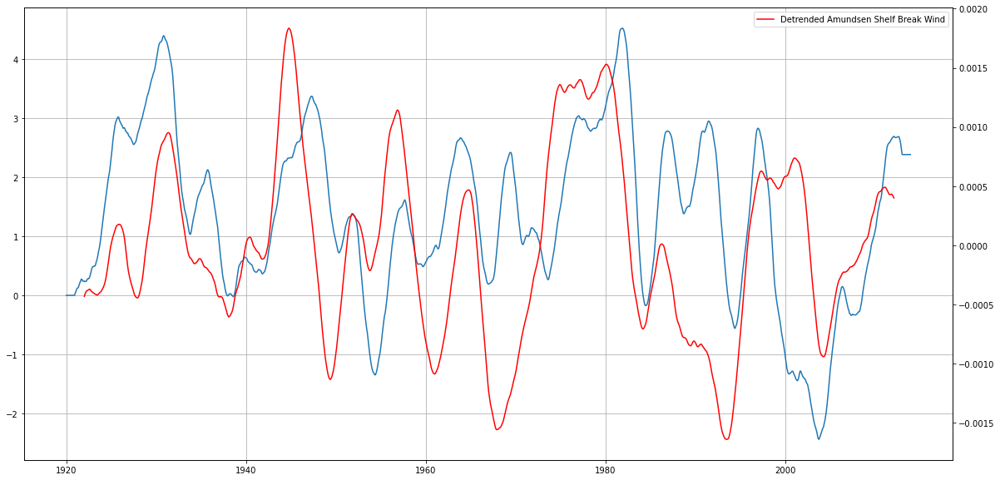

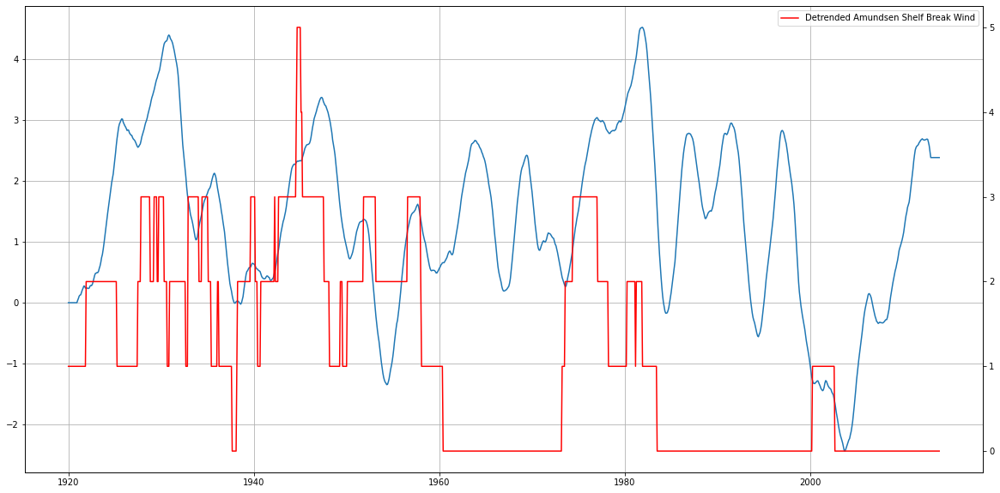

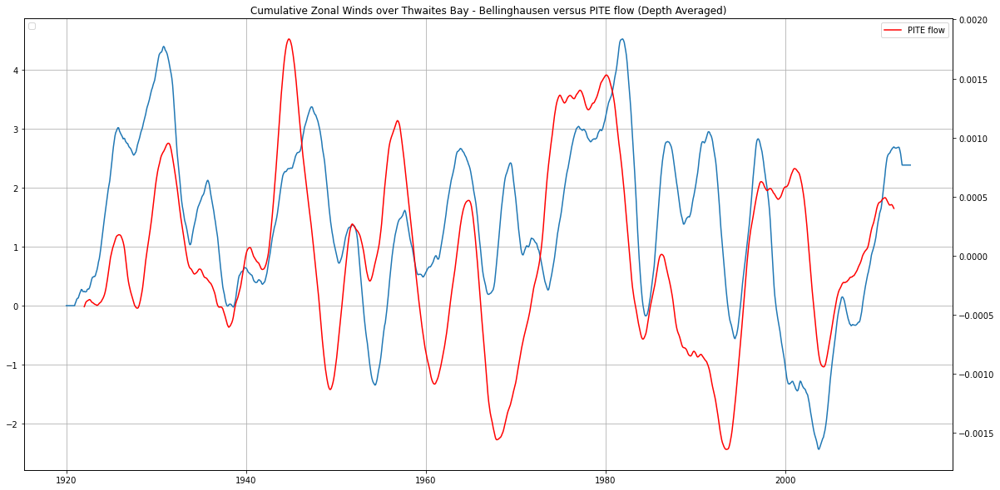

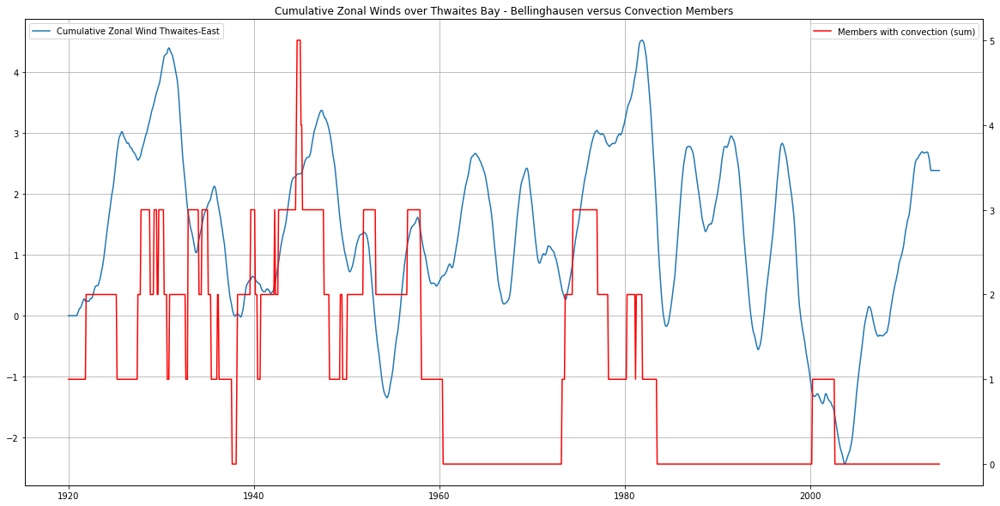

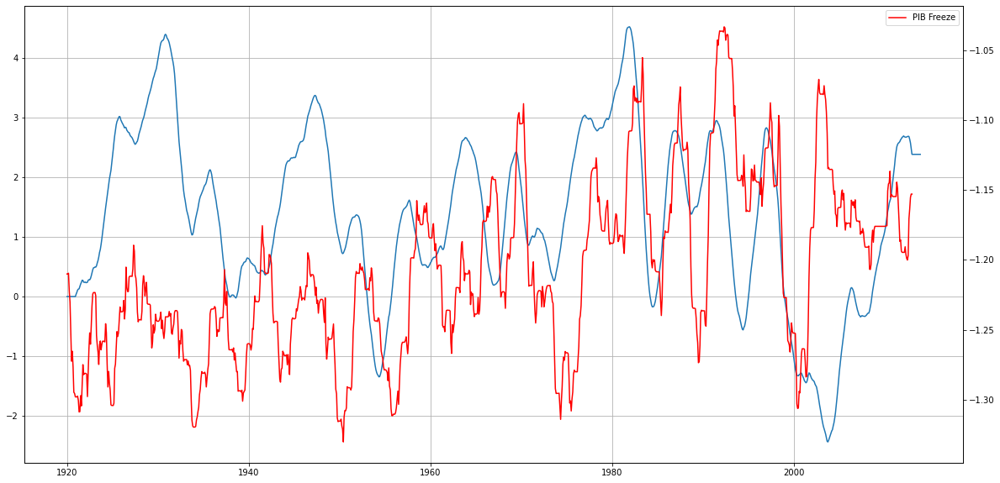

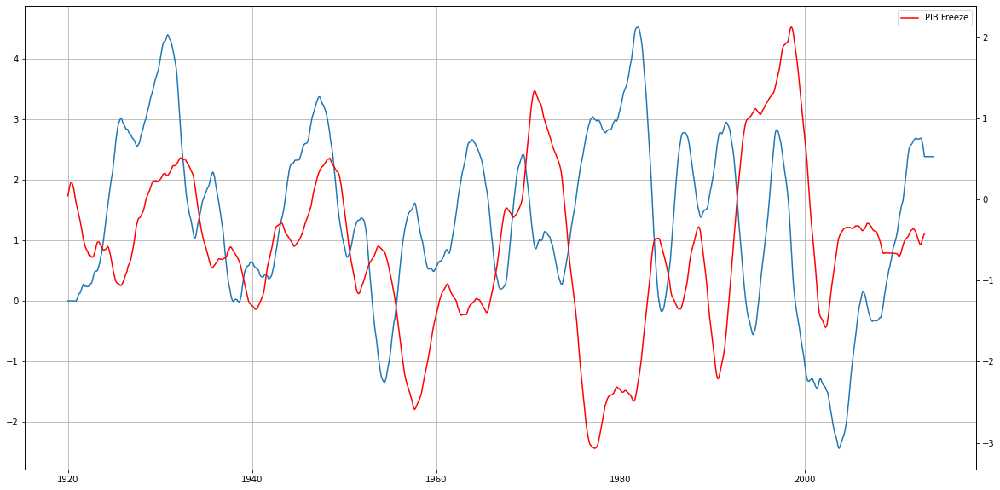

In [193]:
# plt.figure(figsize=(20,10))
# plt.plot(west.indexes['time'].to_datetimeindex(), west.mean(dim='ens').values)
# plt.grid(True)
# plt.twinx()
# plt.plot(total['amundsen_shelf_break_uwind_avg']['1920':'2013'].index, (total['amundsen_shelf_break_uwind_avg']['1920':'2013'].mean(axis=1).rolling(2*12, center=True).mean()
#                                                                         -total['amundsen_shelf_break_uwind_avg']['1920':'2013'].mean(axis=1).rolling(25*12, min_periods=5*12, center=True).mean()), label='Detrended Amundsen Shelf Break Wind', c='r')
# plt.legend(loc='upper right')


# plt.figure(figsize=(20,10))
# plt.plot(west.indexes['time'].to_datetimeindex(), west.mean(dim='ens').values)
# plt.grid(True)
# plt.twinx()
# plt.plot(total['PITE']['1920':'2013'].index, total['PITE']['1920':'2013'].mean(axis=1).rolling(2*12, center=True).mean(), label='Detrended Amundsen Shelf Break Wind', c='r')
# plt.legend(loc='upper right')


# plt.figure(figsize=(20,10))
# plt.plot(west.indexes['time'].to_datetimeindex(), west.mean(dim='ens').cumsum())
# plt.plot(west.indexes['time'].to_datetimeindex(), oost.mean(dim='ens').cumsum())
# plt.grid(True)
# plt.twinx()
# plt.plot(total['PITE']['1920':'2013'].index, total['PITE']['1920':'2013'].mean(axis=1).rolling(2*12, center=True).mean(), label='Detrended Amundsen Shelf Break Wind', c='r')
# plt.legend(loc='upper right')
# plt.title('DEZE!')




# plt.figure(figsize=(20,10))
# plt.plot(west.indexes['time'].to_datetimeindex(), west.mean(dim='ens').values-(total['amundsen_shelf_break_uwind_avg']['1920':'2013'].mean(axis=1).rolling(2*12, center=True).mean()
#                                                                         -total['amundsen_shelf_break_uwind_avg']['1920':'2013'].mean(axis=1).rolling(25*12, min_periods=5*12, center=True).mean()).cumsum())
# plt.grid(True)
# plt.twinx()
# plt.plot(total['PITE']['1920':'2013'].index, total['PITE']['1920':'2013'].mean(axis=1).rolling(2*12, center=True).mean(), label='Detrended Amundsen Shelf Break Wind', c='r')
# plt.legend(loc='upper right')





# plt.figure(figsize=(20,10))
# plt.plot(west.indexes['time'].to_datetimeindex(), west.mean(dim='ens').values)
# plt.grid(True)
# plt.twinx()
# plt.plot(oost.indexes['time'].to_datetimeindex(), oost.mean(dim='ens').values, c='r')
# plt.legend(loc='upper right')


plt.figure(figsize=(20,10))
plt.plot(west.indexes['time'].to_datetimeindex(), (west.mean(dim='ens').values-oost.mean(dim='ens')).cumsum())
plt.grid(True)
plt.twinx()
plt.plot(total['PITE']['1920':'2013'].index, total['PITE']['1920':'2013'].mean(axis=1).rolling(2*12, center=True).mean(), label='Detrended Amundsen Shelf Break Wind', c='r')
plt.legend(loc='upper right')


plt.figure(figsize=(20,10))
plt.plot(west.indexes['time'].to_datetimeindex(), (west.mean(dim='ens').values-oost.mean(dim='ens')).cumsum())
plt.grid(True)
plt.twinx()
plt.plot(convection['1920':'2013'].index, convection['1920':'2013'].sum(axis=1), label='Detrended Amundsen Shelf Break Wind', c='r')
plt.legend(loc='upper right')

plt.figure(figsize=(20,10))
plt.plot(west.indexes['time'].to_datetimeindex(), (west.mean(dim='ens').cumsum()-oost.mean(dim='ens').cumsum()))
plt.grid(True)
plt.legend(loc='upper left')
plt.twinx()
plt.plot(total['PITE']['1920':'2013'].index, total['PITE']['1920':'2013'].mean(axis=1).rolling(2*12, center=True).mean(), label='PITE flow', c='r')
plt.legend(loc='upper right')
plt.title('Cumulative Zonal Winds over Thwaites Bay - Bellinghausen versus PITE flow (Depth Averaged)')


plt.figure(figsize=(20,10))
plt.plot(west.indexes['time'].to_datetimeindex(), (west.mean(dim='ens').cumsum()-oost.mean(dim='ens').cumsum()), label='Cumulative Zonal Wind Thwaites-East')
plt.grid(True)
plt.legend(loc='upper left')
plt.twinx()
plt.plot(convection['1920':'2013'].index, convection['1920':'2013'].sum(axis=1), label='Members with convection (sum)', c='r')
plt.legend(loc='upper right')
plt.title('Cumulative Zonal Winds over Thwaites Bay - Bellinghausen versus Convection Members')



plt.figure(figsize=(20,10))
plt.plot(west.indexes['time'].to_datetimeindex(), (west.mean(dim='ens').cumsum()-oost.mean(dim='ens').cumsum()), label='Cumulative Zonal Wind Thwaites-East')
plt.grid(True)
plt.twinx()
plt.plot(total['pine_island_bay_seaice_freeze']['1920':'2013'].index, total['pine_island_bay_seaice_freeze']['1920':'2013'].mean(axis=1).rolling(2*12, center=True).mean(), label='PIB Freeze', c='r')
plt.legend(loc='upper right')


plt.figure(figsize=(20,10))
plt.plot(west.indexes['time'].to_datetimeindex(), (west.mean(dim='ens').cumsum()-oost.mean(dim='ens').cumsum()), label='Cumulative Zonal Wind Thwaites-East')
plt.grid(True)
plt.twinx()
plt.plot(total['pine_island_bay_seaice_freeze']['1920':'2013'].index, (total['pine_island_bay_seaice_freeze']['1920':'2013'].mean(axis=1).rolling(2*12, center=True).mean()
                                                                       -total['pine_island_bay_seaice_freeze']['1920':'2013'].mean(axis=1).rolling(25*12, min_periods=5*12, center=True).mean()).cumsum(), label='PIB Freeze', c='r')
plt.legend(loc='upper right')


#plt.twinx()
#plt.plot(total['amundsen_shelf_break_uwind_avg']['1920':'2013'].index, , label='Detrended Amundsen Shelf Break Wind', c='r')
#plt.legend(loc='upper right')

/tmp/ipykernel_7595/1880278900.py:2: RuntimeWarning: Converting a CFTimeIndex with dates from a non-standard calendar, 'noleap', to a pandas.DatetimeIndex, which uses dates from the standard calendar.  This may lead to subtle errors in operations that depend on the length of time between dates.
  plt.plot(westfull.indexes['time'].to_datetimeindex(), westfull.mean(dim='ens').rolling(time=2*12, center=True).mean(dim='time'))
/tmp/ipykernel_7595/1880278900.py:2: DeprecationWarning: Reductions are applied along the rolling dimension(s) '['time']'. Passing the 'dim' kwarg to reduction operations has no effect.
  plt.plot(westfull.indexes['time'].to_datetimeindex(), westfull.mean(dim='ens').rolling(time=2*12, center=True).mean(dim='time'))
/tmp/ipykernel_7595/1880278900.py:10: RuntimeWarning: Converting a CFTimeIndex with dates from a non-standard calendar, 'noleap', to a pandas.DatetimeIndex, which uses dates from the standard calendar.  This may lead to subtle errors in operations that dep

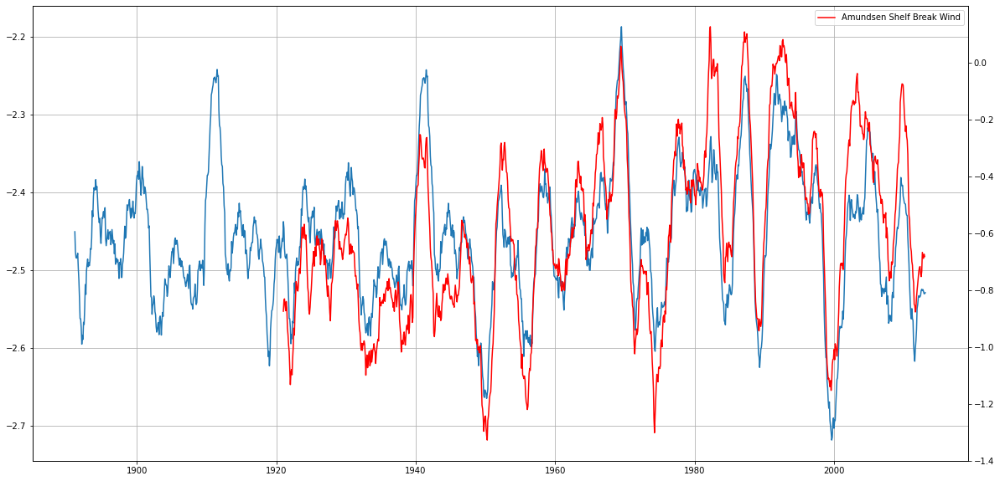

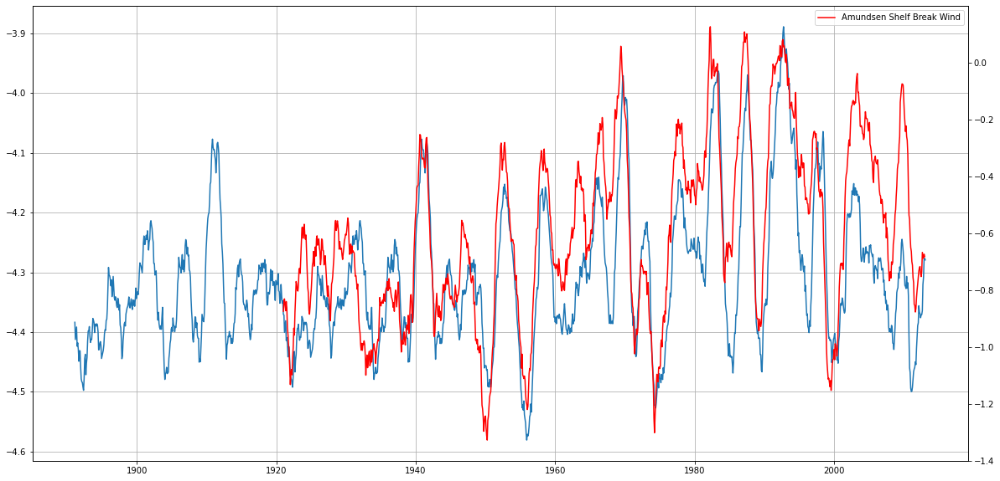

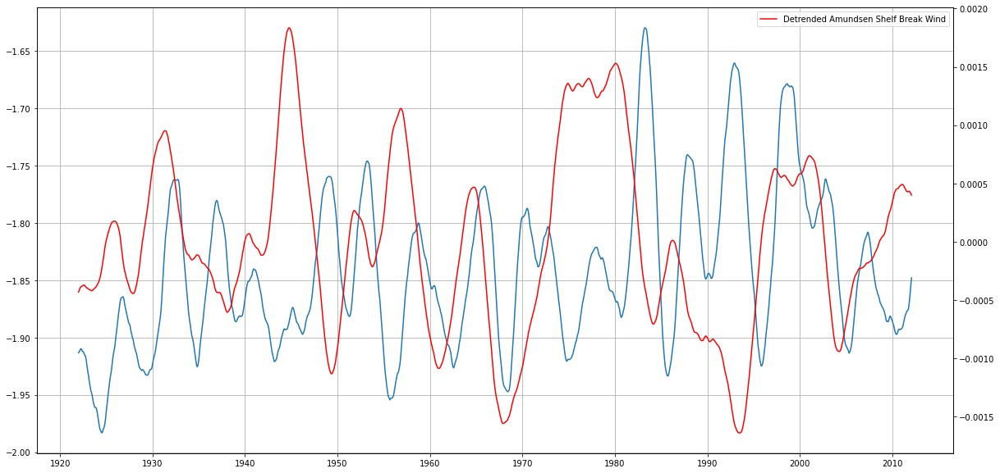

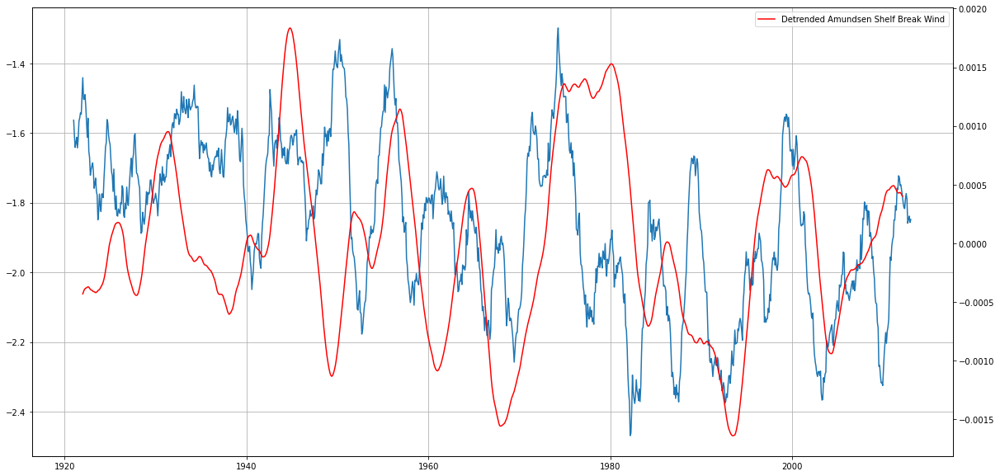

In [151]:
plt.figure(figsize=(20,10))
plt.plot(westfull.indexes['time'].to_datetimeindex(), westfull.mean(dim='ens').rolling(time=2*12, center=True).mean(dim='time'))
plt.grid(True)
plt.twinx()
plt.plot(total['amundsen_shelf_break_uwind_avg']['1920':'2013'].index, total['amundsen_shelf_break_uwind_avg']['1920':'2013'].mean(axis=1).rolling(2*12, center=True).mean(), label='Amundsen Shelf Break Wind', c='r')
plt.legend(loc='upper right')


plt.figure(figsize=(20,10))
plt.plot(oostfull.indexes['time'].to_datetimeindex(), oostfull.mean(dim='ens').rolling(time=2*12, center=True).mean(dim='time'))
plt.grid(True)
plt.twinx()
plt.plot(total['amundsen_shelf_break_uwind_avg']['1920':'2013'].index, total['amundsen_shelf_break_uwind_avg']['1920':'2013'].mean(axis=1).rolling(2*12, center=True).mean(), label='Amundsen Shelf Break Wind', c='r')
plt.legend(loc='upper right')



plt.figure(figsize=(20,10))
plt.plot(oostfull.sel(time=slice('1920', '2013')).indexes['time'].to_datetimeindex(), (oostfull.sel(time=slice('1920', '2013')).mean(dim='ens').rolling(time=2*12, center=True).mean(dim='time')
                                                                                       -westfull.sel(time=slice('1920', '2013')).mean(dim='ens').rolling(time=2*12, center=True).mean(dim='time')).rolling(time=2*12, center=True).mean(dim='time'))
plt.grid(True)
plt.twinx()
plt.plot(total['PITE']['1920':'2013'].index, total['PITE']['1920':'2013'].mean(axis=1).rolling(2*12, center=True).mean(), label='Detrended Amundsen Shelf Break Wind', c='r')
plt.legend(loc='upper right')

plt.figure(figsize=(20,10))
plt.plot(oostfull.sel(time=slice('1920', '2013')).indexes['time'].to_datetimeindex(), (westfull.sel(time=slice('1920', '2013')).mean(dim='ens').rolling(time=2*12, center=True).mean(dim='time').values
                                                                                       -total['amundsen_shelf_break_uwind_avg']['1920':'2013'].mean(axis=1).rolling(2*12, center=True).mean()))
plt.grid(True)
plt.twinx()
plt.plot(total['PITE']['1920':'2013'].index, total['PITE']['1920':'2013'].mean(axis=1).rolling(2*12, center=True).mean(), label='Detrended Amundsen Shelf Break Wind', c='r')
plt.legend(loc='upper right')





#plt.plot(total['amundsen_shelf_break_uwind_avg']['1920':'2013'].index, total['amundsen_shelf_break_uwind_avg']['1920':'2013'].mean(axis=1).rolling(2*12, center=True).mean(), label='Amundsen Shelf Break Wind', c='r')
#plt.legend(loc='upper right')


# plt.figure(figsize=(20,10))
# plt.plot(west.indexes['time'].to_datetimeindex(), west.mean(dim='ens').values)
# plt.grid(True)
# plt.twinx()
# plt.plot(total['PITE']['1920':'2013'].index, total['PITE']['1920':'2013'].mean(axis=1).rolling(2*12, center=True).mean(), label='Detrended Amundsen Shelf Break Wind', c='r')
# plt.legend(loc='upper right')


# plt.figure(figsize=(20,10))
# plt.plot(west.indexes['time'].to_datetimeindex(), west.mean(dim='ens').cumsum())
# plt.plot(west.indexes['time'].to_datetimeindex(), oost.mean(dim='ens').cumsum())
# plt.grid(True)
# plt.twinx()
# plt.plot(total['PITE']['1920':'2013'].index, total['PITE']['1920':'2013'].mean(axis=1).rolling(2*12, center=True).mean(), label='Detrended Amundsen Shelf Break Wind', c='r')
# plt.legend(loc='upper right')
# plt.title('DEZE!')


(22560, 10)
(1105, 20)
(1105, 20)
(1105, 20)
(1105, 20)
(1105, 20)


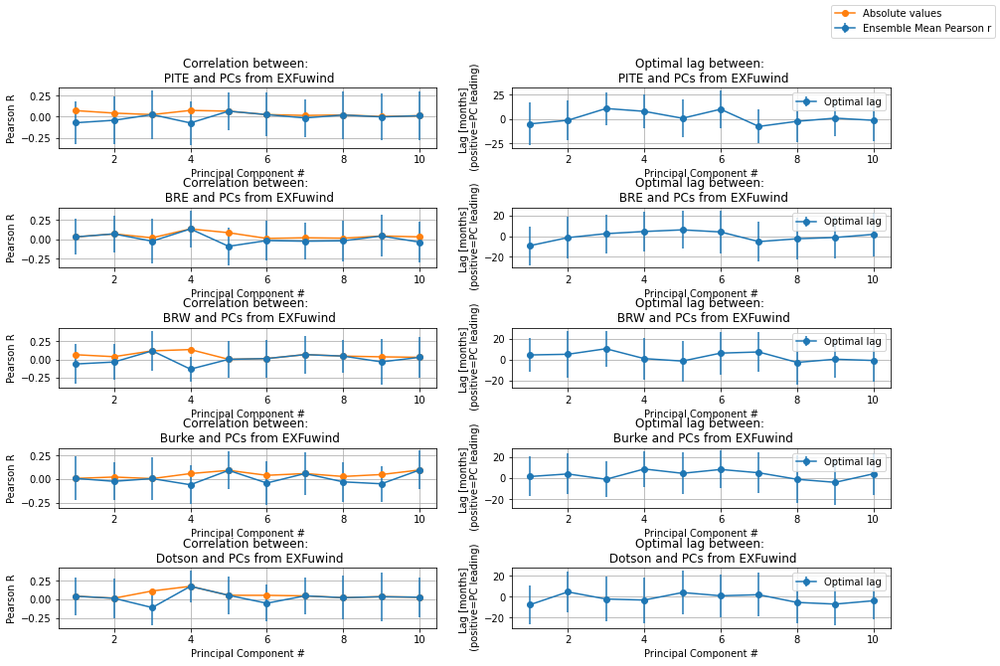

In [233]:
import unixFunctionsMITgcm_final as fc

def plotPCACorrs(PCs, total, real_var, data_dt, 
                 var_list=['amundsen_shelf_break_uwind_avg', 'amundsen_shelf_temp_btw_200_700m', 'amundsen_shelf_ohc_below_0m', 'dotson_to_cosgrove_massloss'], interest=10, 
                 filename='', filepath='./figures/', method='all'):
    #from scipy import signal
    #print(cors)
    #plt.figure(figsize=(15,10))
    fig, ax=plt.subplots(len(var_list), 2, figsize=(15,10))
    
    for i, var in enumerate(var_list):
        total[var] = total[var].reindex(sorted(total[var].columns), axis=1)
        ts=total[var]['1920':'2013']
        if var not in ['PITE','BRE', 'BRW', 'Burke', 'Dotson']:
            print('Hoi')
            ts=ts.rolling(24,center=True).mean()-ts.rolling(25*12, min_periods=5*12, center=True).mean()
        ts=ts.iloc[12:-11]
        #mean=ts.to_numpy().T.flatten()
        print(np.shape(ts))
        #print(ts.head(30))
        
        if method=='ens_mean':
            ts=ts.mean(axis=1)
            cors=np.zeros(interest)
            optlag=np.zeros(interest)
        else:
            #print(len(mean))
            cors=np.zeros((len(list(ts)), interest))
            optlag=np.zeros((len(list(ts)), interest))
        laglim=np.arange(-25, 26)
        for j in range(0,interest):
            PCnor=PCs[:,j]/max(abs(PCs[:,j]))
            
            if method=='ens_mean':
                lagcoef=np.zeros(len(laglim))
                for k, l in enumerate(laglim):
                    l=int(l)
                    if l<0: #ts is leading
                        lagcoef[k]=np.corrcoef(ts.iloc[:-abs(l)], PCnor[abs(l):])[0,1]
                    elif l>0: #PCnor is leading
                        lagcoef[k]=np.corrcoef(ts.iloc[abs(l):], PCnor[:-abs(l)])[0,1]
                    elif l==0: #ts is leading
                        lagcoef[k]=np.corrcoef(ts.iloc[:], PCnor[:])[0,1]
                optlag[j]=laglim[np.argmax(abs(lagcoef))]
                l=int(optlag[j])
                if l<0: #ts is leading
                    cors[j]=np.corrcoef(ts.iloc[:-abs(l)], PCnor[abs(l):])[0,1]
                elif l>0: #PCnor is leading
                    cors[j]=np.corrcoef(ts.iloc[abs(l):], PCnor[:-abs(l)])[0,1]
                elif l==0: #ts is leading
                    cors[j]=np.corrcoef(ts.iloc[:], PCnor[:])[0,1]
            elif method=='all':
                PCnor=PCnor.reshape(len(list(ts)), int(len(PCnor)/len(list(ts))))
                for ens in range(len(list(ts))):
                    lagcoef=np.zeros(len(laglim))
                    for k, l in enumerate(laglim):
                        l=int(l)
                        if l<0: #ts is leading
                            lagcoef[k]=np.corrcoef(ts.iloc[:-abs(l),ens], PCnor[ens,abs(l):])[0,1]
                        elif l>0: #PCnor is leading
                            lagcoef[k]=np.corrcoef(ts.iloc[abs(l):,ens], PCnor[ens,:-abs(l)])[0,1]
                        elif l==0: #ts is leading
                            lagcoef[k]=np.corrcoef(ts.iloc[:,ens], PCnor[ens,:])[0,1]
                    optlag[ens, j]=laglim[np.argmax(abs(lagcoef))]
                    l=int(optlag[ens, j])
                    if l<0: #ts is leading
                        cors[ens, j]=np.corrcoef(ts.iloc[:-abs(l),ens], PCnor[ens,abs(l):])[0,1]
                    elif l>0: #PCnor is leading
                        cors[ens, j]=np.corrcoef(ts.iloc[abs(l):,ens], PCnor[ens,:-abs(l)])[0,1]
                    elif l==0: #ts is leading
                        cors[ens, j]=np.corrcoef(ts.iloc[:,ens], PCnor[ens,:])[0,1]
                
                #cors[ens, j]=np.corrcoef(ts.iloc[:,ens].shift(int(optlag[ens, j])), PCnor[ens,:])[0,1]
                #print(cors[ens, j])
            
#             correlation = signal.correlate(mean, PCnor, mode="full")
            
#             for l in laglim:
#                 cors[j]=np.corrcoef(mean, PCnor)[0,1]
            
#             optlag[j] = lags[np.argmax(correlation)]
#             cors[j]=np.corrcoef(mean, PCnor)[0,1]
            
            
        if method=='all':
        #plt.subplot(len(var_list),1,i+1)
            ax[i,0].errorbar(range(1,interest+1), np.mean(cors, axis=0), yerr=np.std(cors, axis=0), 
                                 fmt='o-',  label='Ensemble Mean Pearson r')
            ax[i,0].plot(range(1,interest+1), abs(np.mean(cors, axis=0)), 'o-', label='Absolute values')
        else:
            ax[i,0].plot(range(1,interest+1), cors, 
                             'o-',  label='Ensemble Mean Pearson r')
            ax[i,0].plot(range(1,interest+1), abs(cors), 'o-', label='Absolute values')
        #ax[i,0].plot(range(1,interest+1), )
        
        
        #plt.yticks([-1,0,1])
        ax[i,0].grid(True)
        if i==0:
            fig.legend()
        ax[i,0].set_ylabel('Pearson R')
        ax[i,0].set_xlabel('Principal Component #')
        ax[i,0].set_title('Correlation between: \n '+var+' and PCs from '+real_var)
        if method=='all':
            ax[i,1].errorbar(range(1,interest+1), np.mean(optlag, axis=0), yerr=np.std(optlag, axis=0), 
                                 fmt='o-',  label='Optimal lag')
        else:
            ax[i,1].plot(range(1,interest+1), optlag, 
                                 'o-',  label='Optimal lag')
        ax[i,1].grid(True)
        ax[i,1].legend()
        ax[i,1].set_ylabel('Lag [months] \n (positive=PC leading)')
        ax[i,1].set_xlabel('Principal Component #')
        ax[i,1].set_title('Optimal lag between: \n '+var+' and PCs from '+real_var)
        
        
        
    from datetime import date
    today = date.today()
    today=today.strftime("%Y%m%d")
    
    plt.subplots_adjust(hspace=1)
    plt.savefig(filepath+today+"_PCAcorrs_"+real_var+'_'+filename+".png", bbox_inches='tight')
    
    return


PCs=np.load('./data/20220321_EXFuwind_PCA_componentall_full_ensemble_cumsum.npy')
print(np.shape(PCs))
PCs=PCs.reshape(1128, 20, 10)
PCs=PCs[12:-11,:]
PCs=PCs.reshape(1105*20, 10)

var='EXFuwind'
plotPCACorrs(PCs=PCs, total=total, real_var=var, var_list=['PITE', 'BRE', 'BRW', 'Burke', 'Dotson'], filename='troughflow_fullens', method='all', data_dt='does this even matter?')

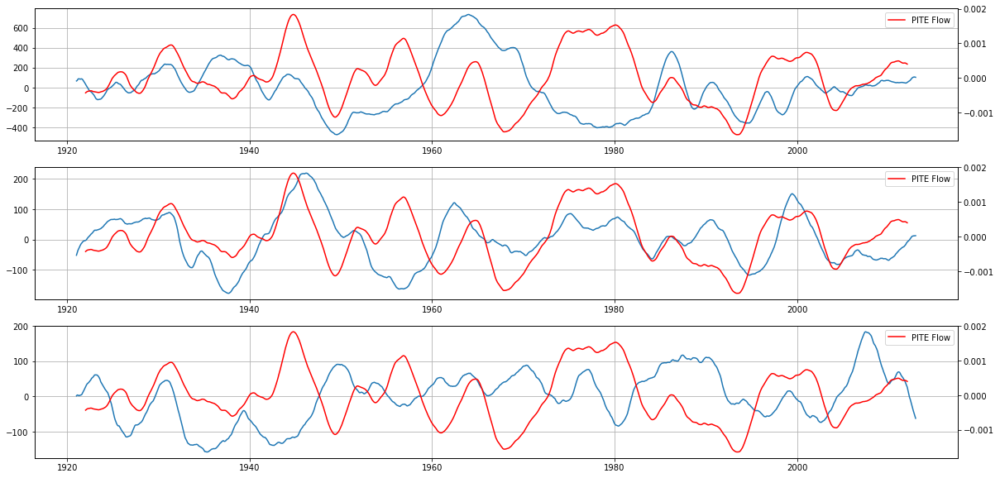

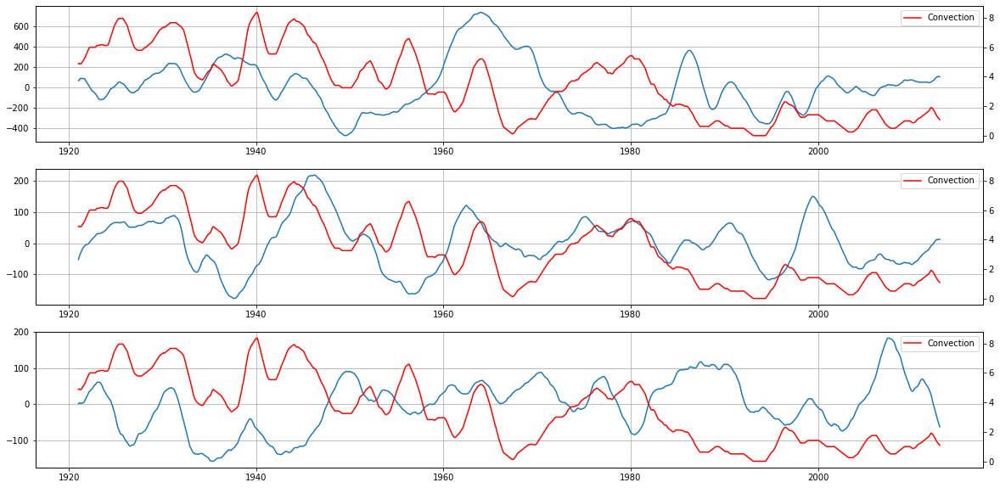

In [216]:
plt.figure(figsize=(20,10))
plt.subplot(3,1,1)
plt.plot(total['PITE'].index[12:-11], PCs[:,3])
plt.grid(True)
plt.twinx()
plt.plot(total['PITE']['1920':'2013'].index, total['PITE']['1920':'2013'].mean(axis=1).rolling(2*12, center=True).mean(), label='PITE Flow', c='r')
plt.legend(loc='upper right')
plt.subplot(3,1,2)
plt.plot(total['PITE'].index[12:-11], PCs[:,7])
plt.grid(True)
plt.twinx()
plt.plot(total['PITE']['1920':'2013'].index, total['PITE']['1920':'2013'].mean(axis=1).rolling(2*12, center=True).mean(), label='PITE Flow', c='r')
plt.legend(loc='upper right')
plt.subplot(3,1,3)
plt.plot(total['PITE'].index[12:-11], PCs[:,9])
plt.grid(True)
plt.twinx()
plt.plot(total['PITE']['1920':'2013'].index, total['PITE']['1920':'2013'].mean(axis=1).rolling(2*12, center=True).mean(), label='PITE Flow', c='r')
plt.legend(loc='upper right')


choose='only'

if choose=='full':
    title='Selecting lines based on omitting all lines with convection between 1940-1945'
    convection=(total['amundsen_shelf_isotherm_0.5C_below_100m'].rolling(24, center=True).mean()<-440) & (total['pine_island_bay_isotherm_0C_below_100m'].rolling(24, center=True).mean()<-470) & (total['dotson_bay_isotherm_-1C_below_100m'].rolling(24, center=True).mean()<-430)
elif choose=='only':
    title='Selecting lines based on PIB convection (1939-1942)'
    convection=(
                    #total[ 'amundsen_shelf_isotherm_0.5C_below_100m'].rolling(24).mean()<-430 #| 
                    total['pine_island_bay_isotherm_0C_below_100m'].rolling(24, center=True).mean()<-470#/600 
                    #total['dotson_bay_isotherm_-1C_below_100m'].rolling(24, center=True).mean()<-430
                    )
if choose=='two':
    title='Selecting lines based on omitting all lines with convection between 1940-1945'
    convection=(total['amundsen_shelf_isotherm_0.5C_below_100m'].rolling(24, center=True).mean()<-440) & (total['pine_island_bay_isotherm_0C_below_100m'].rolling(24, center=True).mean()<-470)# & (total['dotson_bay_isotherm_-1C_below_100m'].rolling(24, center=True).mean()<-430)


plt.figure(figsize=(20,10))
plt.subplot(3,1,1)
plt.plot(total['PITE'].index[12:-11], PCs[:,3])
plt.grid(True)
plt.twinx()
plt.plot(convection['1920':'2013'].index, convection['1920':'2013'].sum(axis=1).rolling(24,center=True).mean(), label='Convection', c='r')
plt.legend(loc='upper right')
plt.subplot(3,1,2)
plt.plot(total['PITE'].index[12:-11], PCs[:,7])
plt.grid(True)
plt.twinx()
plt.plot(convection['1920':'2013'].index, convection['1920':'2013'].sum(axis=1).rolling(24,center=True).mean(), label='Convection', c='r')
plt.legend(loc='upper right')
plt.subplot(3,1,3)
plt.plot(total['PITE'].index[12:-11], PCs[:,9])
plt.grid(True)
plt.twinx()
plt.plot(convection['1920':'2013'].index, convection['1920':'2013'].sum(axis=1).rolling(24,center=True).mean(), label='Convection', c='r')
plt.legend(loc='upper right')



/tmp/ipykernel_7595/2769991839.py:20: RuntimeWarning: Converting a CFTimeIndex with dates from a non-standard calendar, 'noleap', to a pandas.DatetimeIndex, which uses dates from the standard calendar.  This may lead to subtle errors in operations that depend on the length of time between dates.
  ax[2,0].plot(west.indexes['time'].to_datetimeindex(), (west.sel(ens=11).cumsum()-oost.sel(ens=11).cumsum()))


(-14610.0, -7305.0)

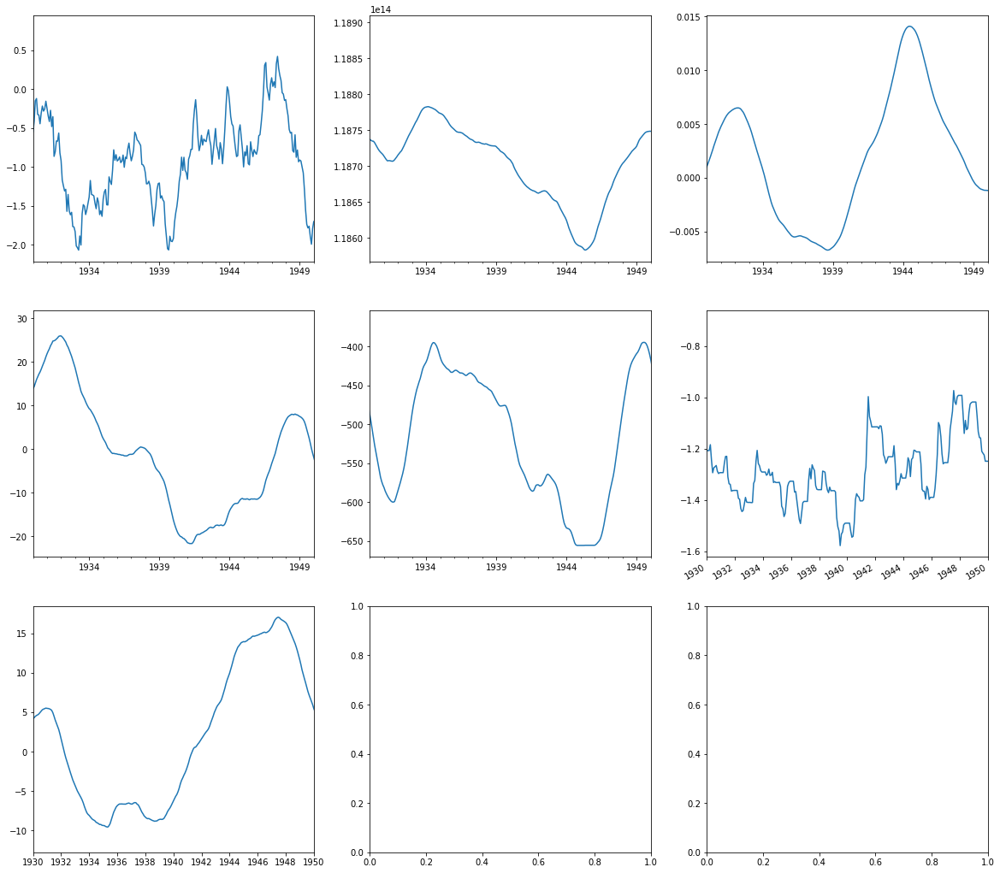

In [220]:
#STUDY A CONVECTION EVENT
import pandas as pd
fig, ax=plt.subplots(3,3, figsize=(20,20))
ens='ens12'
total['amundsen_shelf_break_uwind_avg'][ens].rolling(24, center=True).mean().plot(ax=ax[0,0])
ax[0,0].set_xlim([pd.to_datetime('1930'), pd.to_datetime('1950')])

total['amundsen_shelf_ohc_below_0m'][ens].rolling(24, center=True).mean().plot(ax=ax[0,1])
ax[0,1].set_xlim([pd.to_datetime('1930'), pd.to_datetime('1950')])

total['PITE']["ens<xarray.DataArray 'ens' ()>\narray(11)"].rolling(24, center=True).mean().plot(ax=ax[0,2])
ax[0,2].set_xlim([pd.to_datetime('1930'), pd.to_datetime('1950')])

(total['amundsen_shelf_break_uwind_avg'][ens].rolling(24, center=True).mean()
 -total['amundsen_shelf_break_uwind_avg'][ens].rolling(25*12, min_periods=5*12, center=True).mean()).cumsum().plot(ax=ax[1,0])
ax[1,0].set_xlim([pd.to_datetime('1930'), pd.to_datetime('1950')])



ax[2,0].plot(west.indexes['time'].to_datetimeindex(), (west.sel(ens=11).cumsum()-oost.sel(ens=11).cumsum()))
ax[2,0].set_xlim([pd.to_datetime('1930'), pd.to_datetime('1950')])

total['pine_island_bay_isotherm_0C_below_100m'][ens].rolling(24, center=True).mean().plot(ax=ax[1,1])
ax[1,1].set_xlim([pd.to_datetime('1930'), pd.to_datetime('1950')])


total['pine_island_bay_seaice_freeze'][ens].rolling(24, center=True).mean().plot(ax=ax[1,2])
ax[1,2].set_xlim([pd.to_datetime('1930'), pd.to_datetime('1950')])




/tmp/ipykernel_7595/3978154516.py:26: RuntimeWarning: Converting a CFTimeIndex with dates from a non-standard calendar, 'noleap', to a pandas.DatetimeIndex, which uses dates from the standard calendar.  This may lead to subtle errors in operations that depend on the length of time between dates.
  ax.plot(west.indexes['time'].to_datetimeindex(), (west.sel(ens=ens).cumsum()-oost.sel(ens=ens).cumsum()), label='Cumulative Zonal Wind Diff between (detrended) Thwaites and Bellinghausen')
/tmp/ipykernel_7595/3978154516.py:30: RuntimeWarning: Converting a CFTimeIndex with dates from a non-standard calendar, 'noleap', to a pandas.DatetimeIndex, which uses dates from the standard calendar.  This may lead to subtle errors in operations that depend on the length of time between dates.
  ax.plot(west.indexes['time'].to_datetimeindex(), (west.sel(ens=ens).cumsum()-oost.sel(ens=ens).cumsum()))
/tmp/ipykernel_7595/3978154516.py:30: RuntimeWarning: Converting a CFTimeIndex with dates from a non-standa

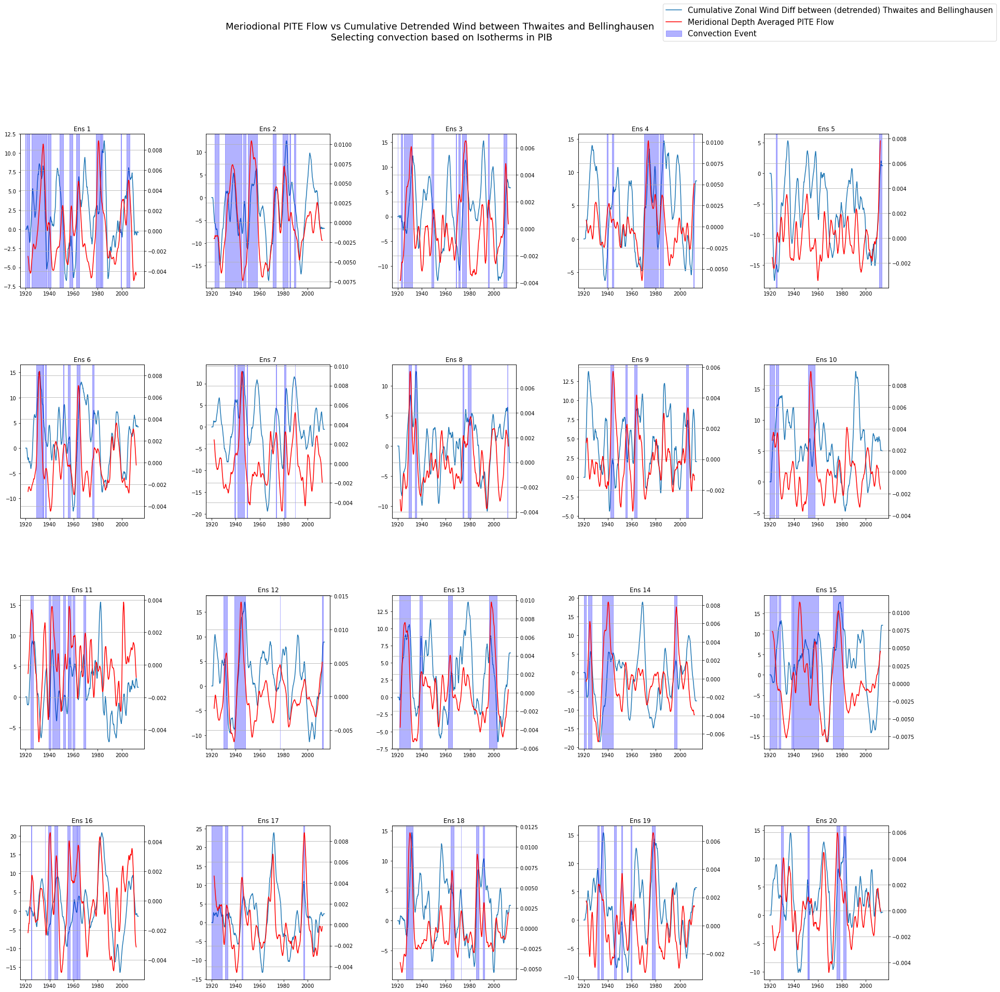

In [271]:
choose='only'

if choose=='full':
    title='\n Selecting convection based on Definition Naughten'
    convection=(total['amundsen_shelf_isotherm_0.5C_below_100m'].rolling(24, center=True).mean()<-440) & (total['pine_island_bay_isotherm_0C_below_100m'].rolling(24, center=True).mean()<-470) & (total['dotson_bay_isotherm_-1C_below_100m'].rolling(24, center=True).mean()<-430)
elif choose=='only':
    title='\n Selecting convection based on Isotherms in PIB'
    convection=(
                    #total[ 'amundsen_shelf_isotherm_0.5C_below_100m'].rolling(24).mean()<-430 #| 
                    total['pine_island_bay_isotherm_0C_below_100m'].rolling(24, center=True).mean()<-470#/600 
                    #total['dotson_bay_isotherm_-1C_below_100m'].rolling(24, center=True).mean()<-430
                    )
if choose=='two':
    title='\n Selecting convection based on Isotherms in PIB and Amundsen Shelf'
    convection=(total['amundsen_shelf_isotherm_0.5C_below_100m'].rolling(24, center=True).mean()<-440) & (total['pine_island_bay_isotherm_0C_below_100m'].rolling(24, center=True).mean()<-470)# & (total['dotson_bay_isotherm_-1C_below_100m'].rolling(24, center=True).mean()<-430)

convection=convection['1920':'2013']
    

fig=plt.figure(figsize=(30,30))
k=0
for i in range(1, 21):
    ens=i-1
    ax=plt.subplot(4,5,i)
    if i==1:
        ax.plot(west.indexes['time'].to_datetimeindex(), (west.sel(ens=ens).cumsum()-oost.sel(ens=ens).cumsum()), label='Cumulative Zonal Wind Diff between (detrended) Thwaites and Bellinghausen')
        ax1=ax.twinx()
        plt.plot(total['PITE'].index, total['PITE']["ens<xarray.DataArray 'ens' ()>\narray("+str(ens)+")"].rolling(24, center=True).mean(), c='r', label='Meridional Depth Averaged PITE Flow')
    else:
        ax.plot(west.indexes['time'].to_datetimeindex(), (west.sel(ens=ens).cumsum()-oost.sel(ens=ens).cumsum()))
        ax1=ax.twinx()
        plt.plot(total['PITE'].index, total['PITE']["ens<xarray.DataArray 'ens' ()>\narray("+str(ens)+")"].rolling(24, center=True).mean(), c='r')
    plt.grid()
    plt.title('Ens '+str(i))
    
    sel=convection['ens'+str(i).zfill(2)]
    for j in range(len(sel)):
            if (sel.iloc[j]==True) & (sel.iloc[j-1]==False):
                c=0
                while sel.iloc[j+c]==True:
                    c+=1
                if k==0:
                    plt.axvspan(sel.index[j], sel.index[j+c-1], color='blue', alpha=0.3, label='Convection Event')
                    k+=1
                else:
                    plt.axvspan(sel.index[j], sel.index[j+c-1], color='blue', alpha=0.3)
plt.subplots_adjust(hspace=0.5, wspace=0.5)
fig.legend(fontsize=15)
fig.suptitle('Meriodional PITE Flow vs Cumulative Detrended Wind between Thwaites and Bellinghausen'+title, fontsize=18)
fig.savefig('./figures/dipolewinds_versus_PITE_PIB_convection.png')

#ax.set_xlim([pd.to_datetime('1930'), pd.to_datetime('1950')])

/tmp/ipykernel_7595/718042394.py:31: RuntimeWarning: Converting a CFTimeIndex with dates from a non-standard calendar, 'noleap', to a pandas.DatetimeIndex, which uses dates from the standard calendar.  This may lead to subtle errors in operations that depend on the length of time between dates.
  ax.plot(west.indexes['time'].to_datetimeindex(), vari, label='Amundsen Shelf Sea Ice Freeze')
/tmp/ipykernel_7595/718042394.py:35: RuntimeWarning: Converting a CFTimeIndex with dates from a non-standard calendar, 'noleap', to a pandas.DatetimeIndex, which uses dates from the standard calendar.  This may lead to subtle errors in operations that depend on the length of time between dates.
  ax.plot(west.indexes['time'].to_datetimeindex(), vari)
/tmp/ipykernel_7595/718042394.py:35: RuntimeWarning: Converting a CFTimeIndex with dates from a non-standard calendar, 'noleap', to a pandas.DatetimeIndex, which uses dates from the standard calendar.  This may lead to subtle errors in operations that dep

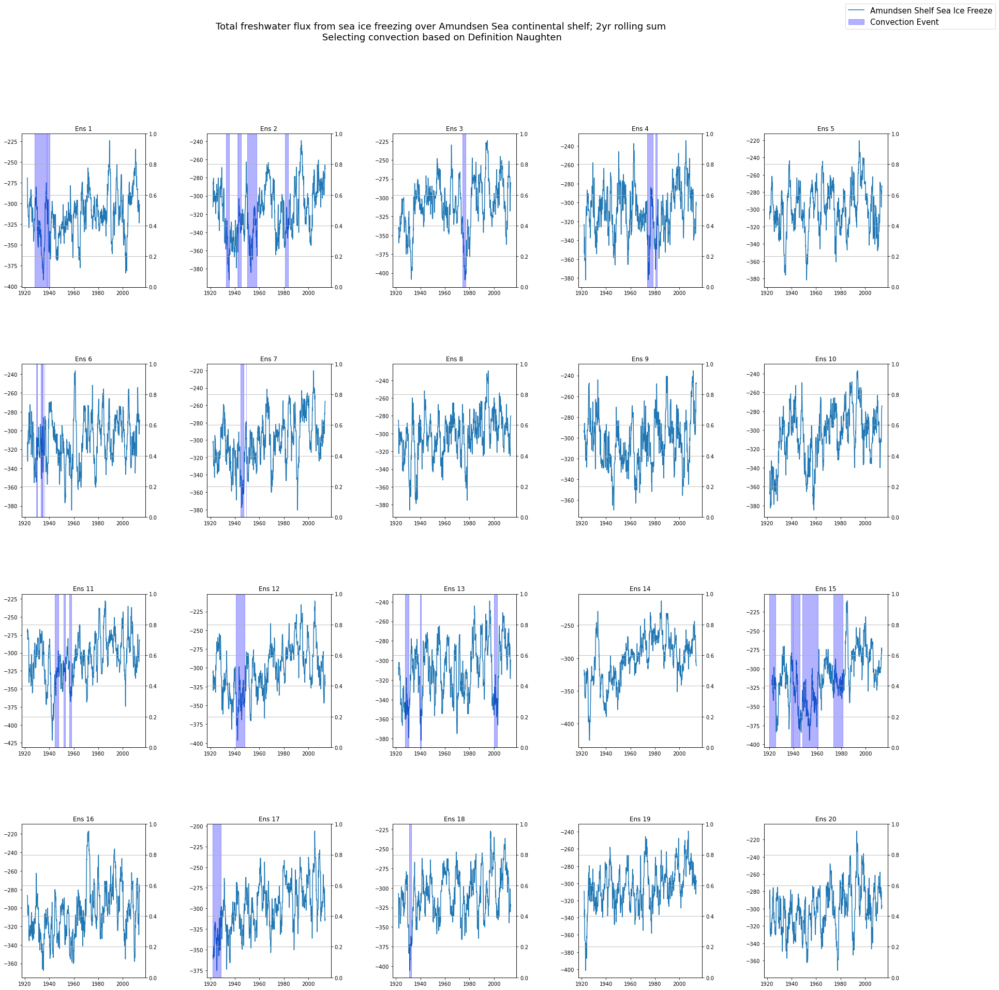

In [340]:
choose='full'

if choose=='full':
    title='\n Selecting convection based on Definition Naughten'
    convection=(total['amundsen_shelf_isotherm_0.5C_below_100m'].rolling(24, center=True).mean()<-440) & (total['pine_island_bay_isotherm_0C_below_100m'].rolling(24, center=True).mean()<-470) & (total['dotson_bay_isotherm_-1C_below_100m'].rolling(24, center=True).mean()<-430)
elif choose=='only':
    title='\n Selecting convection based on Isotherms in PIB'
    convection=(
                    #total[ 'amundsen_shelf_isotherm_0.5C_below_100m'].rolling(24).mean()<-430 #| 
                    total['pine_island_bay_isotherm_0C_below_100m'].rolling(24, center=True).mean()<-470#/600 
                    #total['dotson_bay_isotherm_-1C_below_100m'].rolling(24, center=True).mean()<-430
                    )
if choose=='two':
    title='\n Selecting convection based on Isotherms in PIB and Amundsen Shelf'
    convection=(total['amundsen_shelf_isotherm_0.5C_below_100m'].rolling(24, center=True).mean()<-440) & (total['pine_island_bay_isotherm_0C_below_100m'].rolling(24, center=True).mean()<-470)# & (total['dotson_bay_isotherm_-1C_below_100m'].rolling(24, center=True).mean()<-430)

convection=convection['1920':'2013']
    

fig=plt.figure(figsize=(30,30))
k=0
for i in range(1, 21):
    ens=i-1
    ax=plt.subplot(4,5,i)
    vari=total['amundsen_shelf_seaice_freeze']['ens'+str(i).zfill(2)]['1920':'2013'].rolling(12*2).sum()#-total['amundsen_shelf_seaice_freeze']['ens'+str(i).zfill(2)]['1920':'2013'].rolling(25*12, min_periods=5*12, center=True).mean()
    #vari=west.sel(ens=ens)-oost.sel(ens=ens)
    #total['amundsen_shelf_break_uwind_avg']['ens'+str(i).zfill(2)]['1920':'2013'].rolling(24, center=True).mean()-total['amundsen_shelf_break_uwind_avg']['ens'+str(i).zfill(2)]['1920':'2013'].rolling(25*12, min_periods=5*12, center=True).mean()#west.sel(ens=ens)#(westfull.sel(time=slice('1920', '2013')).sel(ens=ens)-oostfull.sel(time=slice('1920', '2013')).sel(ens=ens)).rolling(time=12*1, center=True).mean(dim='time')-(westfull.sel(time=slice('1920', '2013')).sel(ens=ens)-oostfull.sel(time=slice('1920', '2013')).sel(ens=ens)).rolling(time=25*12, min_periods=5*12, center=True).mean(dim='time')
    #vari=vari.cumsum()#.diff(dim='time').cumsum()
    
    if i==1:
        ax.plot(west.indexes['time'].to_datetimeindex(), vari, label='Amundsen Shelf Sea Ice Freeze')
        ax1=ax.twinx()
        #plt.plot(total['BRE'].index, total['BRE']["ens<xarray.DataArray 'ens' ()>\narray("+str(ens)+")"].rolling(24, center=True).mean(), c='r', label='Meridional Depth Averaged BRE Flow')
    else:
        ax.plot(west.indexes['time'].to_datetimeindex(), vari)
        ax1=ax.twinx()
        #plt.plot(total['BRE'].index, total['BRE']["ens<xarray.DataArray 'ens' ()>\narray("+str(ens)+")"].rolling(24, center=True).mean(), c='r')
    plt.grid()
    plt.title('Ens '+str(i))
    
    sel=convection['ens'+str(i).zfill(2)]
    for j in range(len(sel)):
            if (sel.iloc[j]==True) & (sel.iloc[j-1]==False):
                c=0
                while (sel.iloc[j+c]==True) & ((j+c+1)<len(sel)):
                    c+=1
                if k==0:
                    plt.axvspan(sel.index[j], sel.index[j+c-1], color='blue', alpha=0.3, label='Convection Event')
                    k+=1
                else:
                    plt.axvspan(sel.index[j], sel.index[j+c-1], color='blue', alpha=0.3)
plt.subplots_adjust(hspace=0.5, wspace=0.5)
fig.legend(fontsize=15)
fig.suptitle(longnames['amundsen_shelf_seaice_freeze']+'; 2yr rolling sum'+title, fontsize=18)
fig.savefig('./figures/full_convection_vs_2yr_ice_rolling_sum.png')

#ax.set_xlim([pd.to_datetime('1930'), pd.to_datetime('1950')])

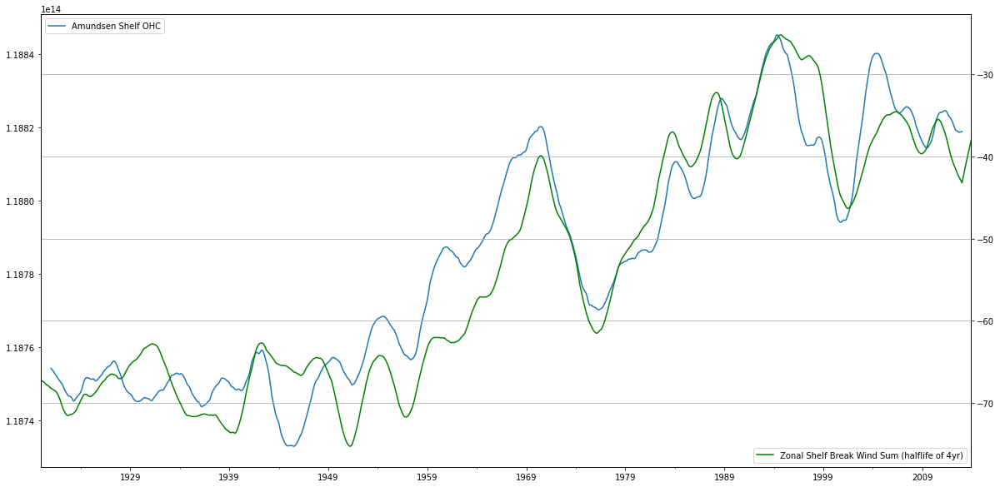

In [402]:
plt.figure(figsize=(20,10))
total['amundsen_shelf_ohc_below_0m']['1920':'2013'].mean(axis=1).rolling(24, center=True).mean().plot(label='Amundsen Shelf OHC')
plt.legend(loc='upper left')
plt.twinx()
#total['amundsen_shelf_break_uwind_avg'].mean(axis=1).ewm(halflife=4*12).mean()['1920':'2013'].plot(c='r')
total['amundsen_shelf_break_uwind_avg'].mean(axis=1).rolling(24, center=True).mean().ewm(halflife=12*5).sum()['1920':'2013'].plot(c='g', label='Zonal Shelf Break Wind Sum (halflife of 4yr)')
plt.grid(True)
plt.legend(loc='lower right')

In [166]:
total['PITE'].head(30)

,ens<xarray.DataArray 'ens' ()>\narray(0),ens<xarray.DataArray 'ens' ()>\narray(1),ens<xarray.DataArray 'ens' ()>\narray(10),ens<xarray.DataArray 'ens' ()>\narray(11),ens<xarray.DataArray 'ens' ()>\narray(12),ens<xarray.DataArray 'ens' ()>\narray(13),ens<xarray.DataArray 'ens' ()>\narray(14),ens<xarray.DataArray 'ens' ()>\narray(15),ens<xarray.DataArray 'ens' ()>\narray(16),ens<xarray.DataArray 'ens' ()>\narray(17),ens<xarray.DataArray 'ens' ()>\narray(18),ens<xarray.DataArray 'ens' ()>\narray(19),ens<xarray.DataArray 'ens' ()>\narray(2),ens<xarray.DataArray 'ens' ()>\narray(3),ens<xarray.DataArray 'ens' ()>\narray(4),ens<xarray.DataArray 'ens' ()>\narray(5),ens<xarray.DataArray 'ens' ()>\narray(6),ens<xarray.DataArray 'ens' ()>\narray(7),ens<xarray.DataArray 'ens' ()>\narray(8),ens<xarray.DataArray 'ens' ()>\narray(9)
1920-01-01,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1920-02-01,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1920-03-01,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1920-04-01,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1920-05-01,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1920-06-01,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1920-07-01,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1920-08-01,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1920-09-01,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1920-10-01,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [3]:
from mitgcm_python_master.plot_slices import read_plot_slice

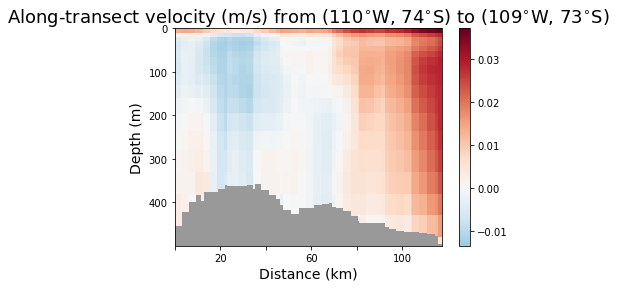

In [16]:
read_plot_slice (var='valong', file_path='/data/oceans_output/shelf/kaight/mitgcm/PAS_PACE12/output/194201/MITgcm/output.nc',
                 grid=None, lon0=None, lat0=None, point0=(-110, -74), point1=(-109, -73), time_index=None, t_start=None, t_end=None, time_average=True, hmin=None, hmax=None, zmin=None, zmax=None, vmin=None, vmax=None, contours=None, date_string=None, fig_name=None, second_file_path=None, eosType='MDJWF', rhoConst=None, Tref=None, Sref=None, tAlpha=None, sBeta=None, ref_depth=0)

In [ ]:
read_plot_slice (var='tadv_along', file_path='/data/oceans_output/shelf/kaight/mitgcm/PAS_PACE12/output/194201/MITgcm/output.nc',
                 grid=None, lon0=None, lat0=None, point0=(-110, -74), point1=(-109, -73), time_index=None, t_start=None, t_end=None, time_average=True, hmin=None, hmax=None, zmin=None, zmax=None, vmin=None, vmax=None, contours=None, date_string=None, fig_name=None, second_file_path=None, eosType='MDJWF', rhoConst=None, Tref=None, Sref=None, tAlpha=None, sBeta=None, ref_depth=0)

In [5]:
#Load Data that we already have
data={}
data_dt={}

window=24

members='all'

var_list=['UVEL', 'VVEL','UVELB', 'VVELB']
filenames={'EXFuwind':'zonal_winds', 
           'THETA':'new2_amundsen_shelf_temp_200to700', 
           'UVEL':'depth_averaged_UVEL', 
           'VVEL':'depth_averaged_VVEL',
           'curlTAU':'curl_tau', 
           'THETAW106':'theta_W106', 
           'THETAW120':'theta_W120',
           'THETAW103-5':'theta_W103-5',
           'THETAW100':'theta_W100',
           'THETAS72-5':'theta_S72-5',
           'UVELB':'bottom100m_averaged_UVEL', 
           'VVELB':'bottom100m_averaged_VVEL'}

for var in var_list: 
    print('Starting with: '+var)
    data[var]=fc.loadMITgcmData(filename=filenames[var], members=members)
    if 'VELB' in var:
        if 'U' in var:
            data[var]=data[var]-data['UVEL']
            data_dt[var]=fc.detrend_and_average_MITgcmData(data[var], 'UVEL', window=window)
        elif 'VVEL' in var:
            data[var]=data[var]-data['VVEL']
            data_dt[var]=fc.detrend_and_average_MITgcmData(data[var], 'VVEL', window=window)
    elif 'THETA' in var:
        data_dt[var]=fc.detrend_and_average_MITgcmData(data[var], 'THETA', window=window)
    else:
        data_dt[var]=fc.detrend_and_average_MITgcmData(data[var], var, window=window)
    
    
    

Starting with: UVEL
Loading number:0
Loading number:1
Loading number:2
Loading number:3
Loading number:4
Loading number:5
Loading number:6
Loading number:7
Loading number:8
Loading number:9
Loading number:10
Loading number:11
Loading number:12
Loading number:13
Loading number:14
Loading number:15
Loading number:16
Loading number:17
Loading number:18
Loading number:19
Starting with: VVEL
Loading number:0
Loading number:1
Loading number:2
Loading number:3
Loading number:4
Loading number:5
Loading number:6
Loading number:7
Loading number:8
Loading number:9
Loading number:10
Loading number:11
Loading number:12
Loading number:13
Loading number:14
Loading number:15
Loading number:16
Loading number:17
Loading number:18
Loading number:19
Starting with: UVELB
Loading number:0
Loading number:1
Loading number:2
Loading number:3
Loading number:4
Loading number:5
Loading number:6
Loading number:7
Loading number:8
Loading number:9
Loading number:10
Loading number:11
Loading number:12
Loading number:

Text(0.5, 1.0, 'Depth Averaged Ocean Velocity')

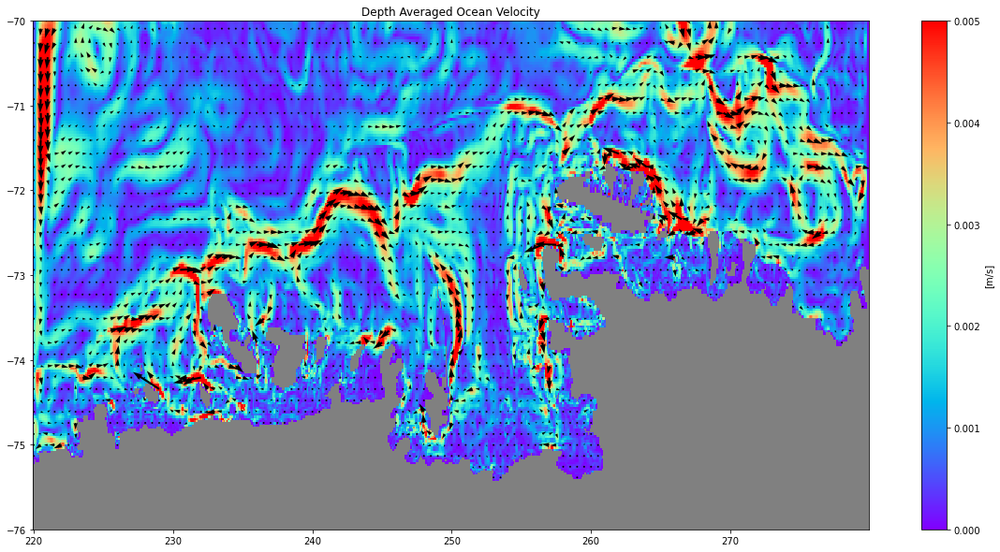

In [34]:
year='1941'
plt.figure(figsize=(20,10))
ax=plt.subplot(1,1,1)

var='UVEL'
var1='UVEL'
var2='VVEL'
vfield=np.sqrt(data_dt[var1].sel(time=year).mean(dim='time').mean(dim='ens').values**2
               +data_dt[var2].sel(time=year).mean(dim='time').mean(dim='ens').values**2)

xcor=[m for m in data_dt[var1].coords if 'X' in m][0]
ycor=[m for m in data_dt[var1].coords if 'Y' in m][0]

img=ax.pcolor(data_dt[var][xcor], data_dt[var][ycor], vfield, cmap='rainbow', vmax=0.005)
plt.colorbar(img, label='[m/s]', ax=ax)
ax.set_facecolor('grey')
step=5
ax.quiver(data_dt[var][xcor][::step], data_dt[var][ycor][::step], 
               data_dt['UVEL'].sel(time=year).mean(dim='time').mean(dim='ens').values[::step, ::step], 
               data_dt['VVEL'].sel(time=year).mean(dim='time').mean(dim='ens').values[::step, ::step], 
               color='black')
#bath=ax.contour(data_dt[var][xcor], data_dt[var][ycor], grid.bathy, levels=[-1000], colors=['white'])
#plt.clabel(bath, [-1000])
ax.set_ylim([-76, -70])
ax.set_title('Depth Averaged Ocean Velocity')

Text(0.5, 1.0, 'Bottom 100m Ocean Velocity - Depth Averaged')

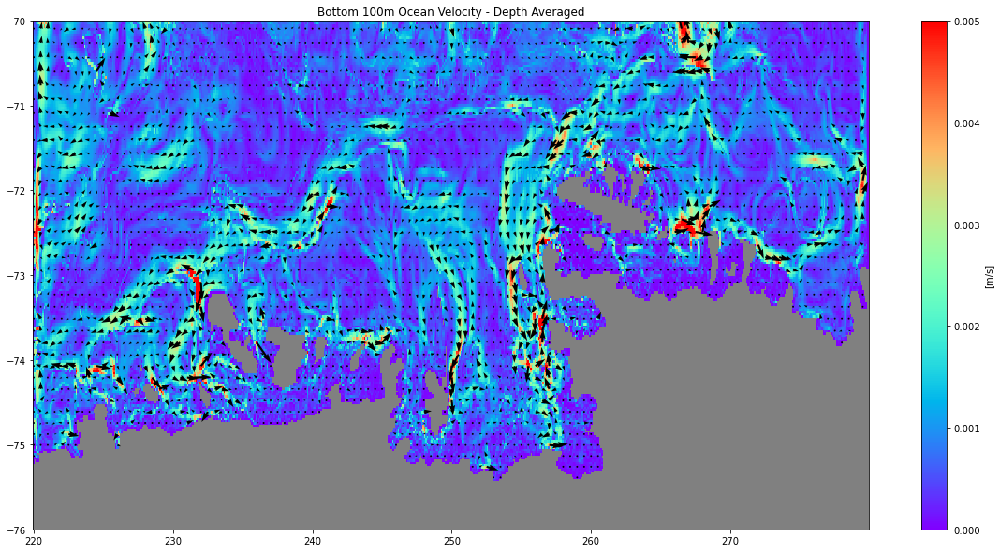

In [42]:
year='1941'
plt.figure(figsize=(20,10))
ax=plt.subplot(1,1,1)

var1='UVELB'
var2='VVELB'
vfield=np.sqrt(data_dt[var1].sel(time=year).mean(dim='time').mean(dim='ens').values**2
               +data_dt[var2].sel(time=year).mean(dim='time').mean(dim='ens').values**2)

img=ax.pcolor(data_dt[var][xcor], data_dt[var][ycor], vfield, cmap='rainbow', vmax=0.005)
plt.colorbar(img, label='[m/s]', ax=ax)
ax.set_facecolor('grey')
step=5
ax.quiver(data_dt[var][xcor][::step], data_dt[var][ycor][::step], 
               data_dt['UVELB'].sel(time=year).mean(dim='time').mean(dim='ens').values[::step, ::step], 
               data_dt['VVELB'].sel(time=year).mean(dim='time').mean(dim='ens').values[::step, ::step], 
               color='black')
#bath=ax.contour(data_dt[var][xcor], data_dt[var][ycor], grid.bathy, levels=[-1000], colors=['white'])
#plt.clabel(bath, [-1000])
ax.set_ylim([-76, -70])
ax.set_title('Bottom 100m Ocean Velocity - Depth Averaged')

Text(0.5, 1.0, 'Depth Averaged Ocean Velocity')

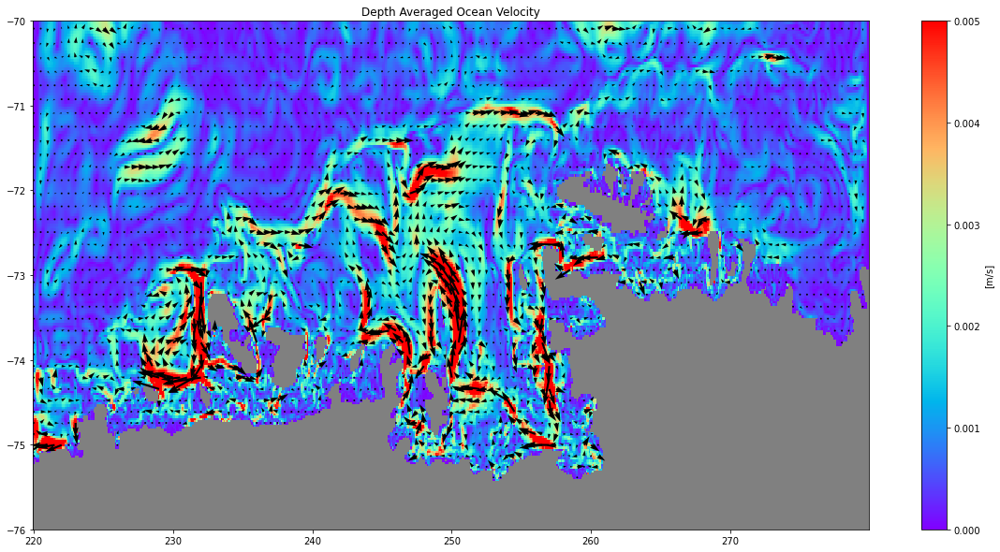

In [32]:
year='1968'

plt.figure(figsize=(20,10))
ax=plt.subplot(1,1,1)

var1='UVEL'
var2='VVEL'
vfield=np.sqrt(data_dt[var1].sel(time=year).mean(dim='time').mean(dim='ens').values**2
               +data_dt[var2].sel(time=year).mean(dim='time').mean(dim='ens').values**2)

img=ax.pcolor(data_dt[var][xcor], data_dt[var][ycor], vfield, cmap='rainbow', vmax=0.005)
plt.colorbar(img, label='[m/s]', ax=ax)
ax.set_facecolor('grey')
step=5
ax.quiver(data_dt[var][xcor][::step], data_dt[var][ycor][::step], 
               data_dt['UVEL'].sel(time=year).mean(dim='time').mean(dim='ens').values[::step, ::step], 
               data_dt['VVEL'].sel(time=year).mean(dim='time').mean(dim='ens').values[::step, ::step], 
               color='black')
#bath=ax.contour(data_dt[var][xcor], data_dt[var][ycor], grid.bathy, levels=[-1000], colors=['white'])
#plt.clabel(bath, [-1000])
ax.set_ylim([-76, -70])
ax.set_title('Depth Averaged Ocean Velocity')

Text(0.5, 1.0, 'Bottom 100m Ocean Velocity - Depth Averaged')

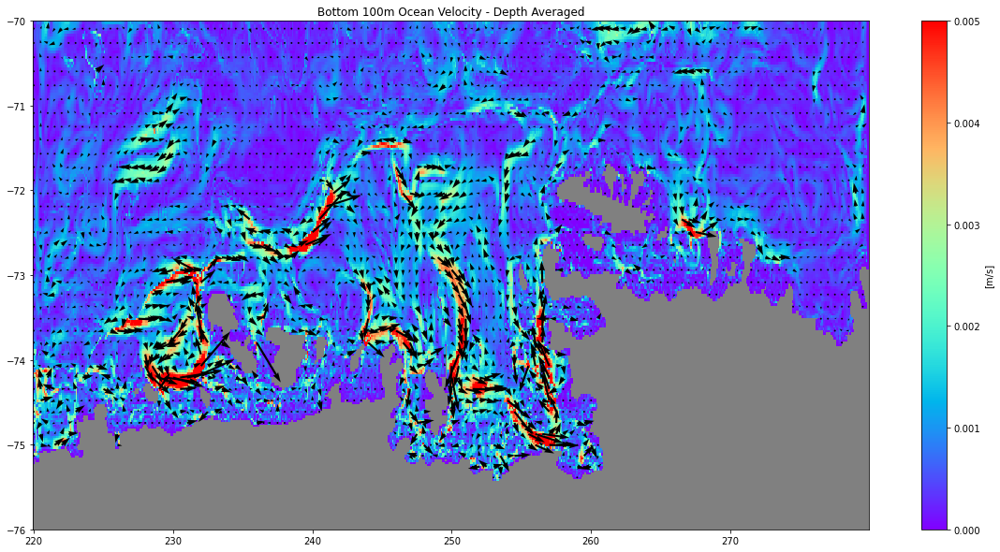

In [33]:
year='1968'

plt.figure(figsize=(20,10))

ax=plt.subplot(1,1,1)

var1='UVELB'
var2='VVELB'
vfield=np.sqrt(data_dt[var1].sel(time=year).mean(dim='time').mean(dim='ens').values**2
               +data_dt[var2].sel(time=year).mean(dim='time').mean(dim='ens').values**2)

img=ax.pcolor(data_dt[var][xcor], data_dt[var][ycor], vfield, cmap='rainbow', vmax=0.005)
plt.colorbar(img, label='[m/s]', ax=ax)
ax.set_facecolor('grey')
step=5
ax.quiver(data_dt[var][xcor][::step], data_dt[var][ycor][::step], 
               data_dt['UVELB'].sel(time=year).mean(dim='time').mean(dim='ens').values[::step, ::step], 
               data_dt['VVELB'].sel(time=year).mean(dim='time').mean(dim='ens').values[::step, ::step], 
               color='black')
#bath=ax.contour(data_dt[var][xcor], data_dt[var][ycor], grid.bathy, levels=[-1000], colors=['white'])
#plt.clabel(bath, [-1000])
ax.set_ylim([-76, -70])
ax.set_title('Bottom 100m Ocean Velocity - Depth Averaged')

Text(0.5, 1.0, 'Depth Averaged Ocean Velocity')

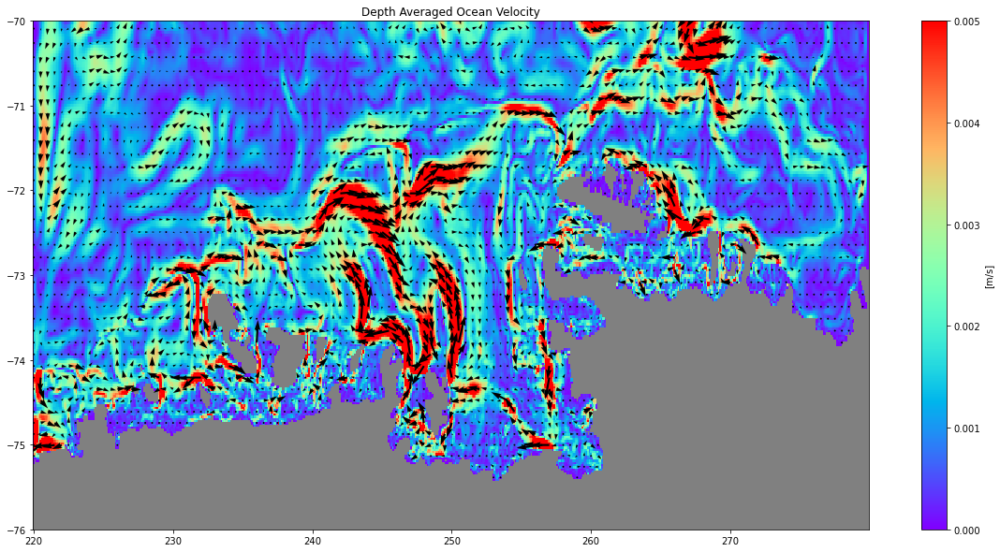

In [39]:
year='1994'

plt.figure(figsize=(20,10))
ax=plt.subplot(1,1,1)

var1='UVEL'
var2='VVEL'
vfield=np.sqrt(data_dt[var1].sel(time=year).mean(dim='time').mean(dim='ens').values**2
               +data_dt[var2].sel(time=year).mean(dim='time').mean(dim='ens').values**2)

img=ax.pcolor(data_dt[var][xcor], data_dt[var][ycor], vfield, cmap='rainbow', vmax=0.005)
plt.colorbar(img, label='[m/s]', ax=ax)
ax.set_facecolor('grey')
step=5
ax.quiver(data_dt[var][xcor][::step], data_dt[var][ycor][::step], 
               data_dt['UVEL'].sel(time=year).mean(dim='time').mean(dim='ens').values[::step, ::step], 
               data_dt['VVEL'].sel(time=year).mean(dim='time').mean(dim='ens').values[::step, ::step], 
               color='black')
#bath=ax.contour(data_dt[var][xcor], data_dt[var][ycor], grid.bathy, levels=[-1000], colors=['white'])
#plt.clabel(bath, [-1000])
ax.set_ylim([-76, -70])
ax.set_title('Depth Averaged Ocean Velocity')

Text(0.5, 1.0, 'Bottom 100m Ocean Velocity - Depth Averaged')

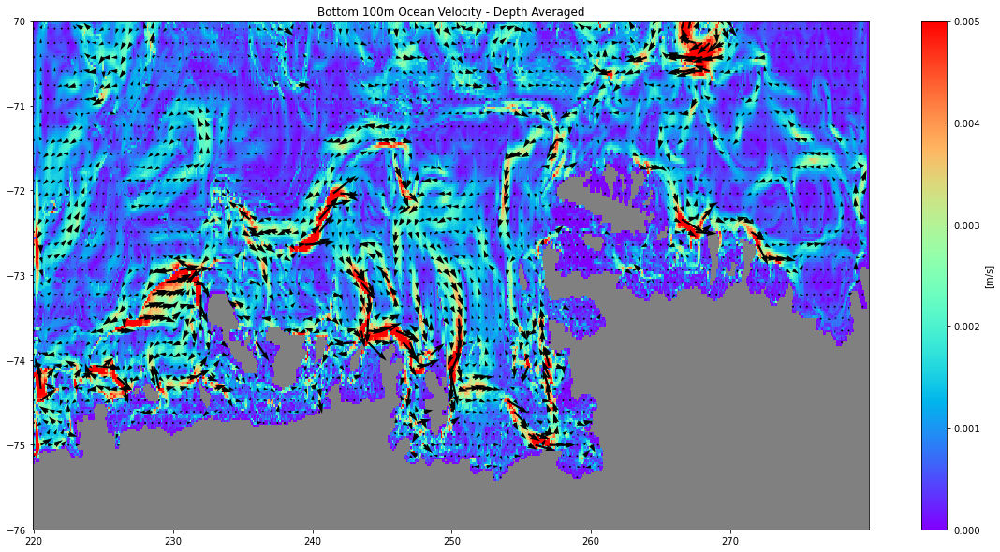

In [40]:
year='1994'

plt.figure(figsize=(20,10))

ax=plt.subplot(1,1,1)

var1='UVELB'
var2='VVELB'
vfield=np.sqrt(data_dt[var1].sel(time=year).mean(dim='time').mean(dim='ens').values**2
               +data_dt[var2].sel(time=year).mean(dim='time').mean(dim='ens').values**2)

img=ax.pcolor(data_dt[var][xcor], data_dt[var][ycor], vfield, cmap='rainbow', vmax=0.005)
plt.colorbar(img, label='[m/s]', ax=ax)
ax.set_facecolor('grey')
step=5
ax.quiver(data_dt[var][xcor][::step], data_dt[var][ycor][::step], 
               data_dt['UVELB'].sel(time=year).mean(dim='time').mean(dim='ens').values[::step, ::step], 
               data_dt['VVELB'].sel(time=year).mean(dim='time').mean(dim='ens').values[::step, ::step], 
               color='black')
#bath=ax.contour(data_dt[var][xcor], data_dt[var][ycor], grid.bathy, levels=[-1000], colors=['white'])
#plt.clabel(bath, [-1000])
ax.set_ylim([-76, -70])
ax.set_title('Bottom 100m Ocean Velocity - Depth Averaged')

In [64]:
from mitgcm_python_master.utils import mask_2d_to_3d, apply_mask, select_bottom

from mitgcm_python_master.calculus import vertical_average

#mask = np.ones([grid.ny, grid.nx]).astype(bool)
#mask = mask_2d_to_3d(mask, grid, zmin=z0[0], zmax=z0[1])

In [21]:
data_xr=xr.open_dataset('/data/oceans_output/shelf/kaight/mitgcm/PAS_PACE01/output/194001/MITgcm/output.nc')

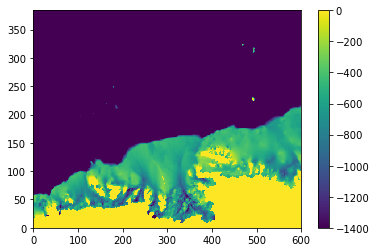

In [93]:
plt.figure()
img=plt.pcolor(grid.bathy, vmin=-1400)
plt.colorbar(img)
# plt.figure()
# img=plt.pcolor(grid.lon_2d, grid.lat_2d, grid.bathy+200-grid.bathy, )
# plt.colorbar(img)

In [90]:
a=data_xr.Z.to_numpy()
a

b = np.stack([a]*np.shape(grid.bathy)[0], axis=1)
b = np.stack([b]*np.shape(grid.bathy)[1], axis=2)

print(np.shape(data_xr.THETA))
print(np.shape(b))

#np.shape(select_bottom(data_xr['THETA'].to_numpy()[0,:,:], grid=grid, masked=False, return_masked=True))
bottom100=(data_xr['THETA'].to_numpy()[0,:,:,:]==select_bottom(data_xr['THETA'].to_numpy()[0,:,:,:], grid=grid, masked=False)) | (b<=(grid.bathy+100)) & (data_xr['THETA'].to_numpy()[0,:,:]!=0)
numdat=data_xr['THETA'].to_numpy()
numdat = apply_mask(numdat, np.invert(bottom100), time_dependent=True)
np.shape(numdat)
print(numdat[2,:,100,300])
print(grid.bathy[100,300])
print(a)

(12, 50, 384, 600)
(50, 384, 600)
[-- -- -- -- -- -- -- -- -- -- -- -- -- -- -1.5100518465042114
 -1.2163029909133911 -1.0976505279541016 -- -- -- -- -- -- -- -- -- -- --
 -- -- -- -- -- -- -- -- -- -- -- -- -- -- -- -- -- -- -- -- -- --]
-440.0000001490116
[-5.0000e+00 -1.5000e+01 -2.5000e+01 -3.5000e+01 -4.6000e+01 -5.9250e+01
 -7.5250e+01 -9.4500e+01 -1.1750e+02 -1.4500e+02 -1.7750e+02 -2.1500e+02
 -2.5750e+02 -3.0500e+02 -3.5500e+02 -4.0500e+02 -4.5500e+02 -5.0500e+02
 -5.5500e+02 -6.0500e+02 -6.5500e+02 -7.0500e+02 -7.5500e+02 -8.0500e+02
 -8.5500e+02 -9.0500e+02 -9.5500e+02 -1.0050e+03 -1.0550e+03 -1.1100e+03
 -1.1750e+03 -1.2500e+03 -1.3350e+03 -1.4325e+03 -1.5475e+03 -1.6850e+03
 -1.8475e+03 -2.0350e+03 -2.2475e+03 -2.4850e+03 -2.7600e+03 -3.0600e+03
 -3.3600e+03 -3.6600e+03 -3.9600e+03 -4.2600e+03 -4.5600e+03 -4.8600e+03
 -5.1600e+03 -5.4600e+03]


In [87]:
(data_xr['THETA'].to_numpy()[0,:,:,:]==select_bottom(data_xr['THETA'].to_numpy()[0,:,:,:], grid=grid, masked=False))[:,150, 150]

array([False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False,  True, False, False,
       False, False, False, False, False])

In [13]:
members=[5,6]
#Ocean
window=24
data_dt={}
var='THETA'
temp=fc.loadMITgcmData(filename='new2_amundsen_shelf_temp_200to700', members=members)
data_dt[var]=fc.detrend_and_average_MITgcmData(temp, var, window=window)

Loading number:5


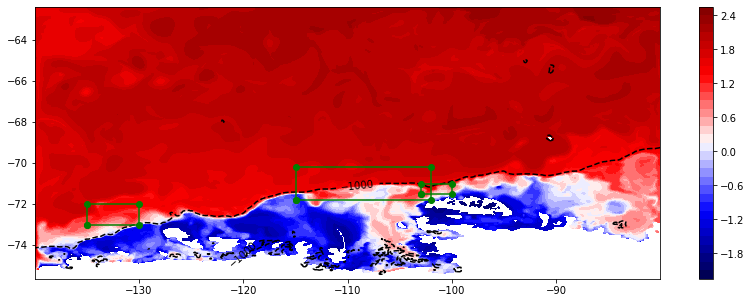

In [81]:
bounds={'west_shelf_break':[-135, -130, -73, -72], 'thurston':[-103, -100, -71.5, -71]} 


from mitgcm_python_master.plot_latlon import latlon_plot
from mitgcm_python_master.grid import ERA5Grid, PACEGrid, Grid, dA_from_latlon, pierre_obs_grid
from mitgcm_python_master.utils import real_dir, daily_to_monthly, fix_lon_range, split_longitude, mask_land_ice, moving_average, index_year_start, index_year_end, index_period, mask_2d_to_3d, days_per_month, add_time_dim, z_to_xyz, select_bottom, convert_ismr, mask_except_ice, xy_to_xyz, apply_mask, var_min_max, mask_3d, average_12_months, depth_of_isoline, mask_land, axis_edges
from mitgcm_python_master.plot_utils.latlon import shade_mask, overlay_vectors
gp='/data/oceans_output/shelf/kaight/mitgcm/PAS_grid/'
region='amundsen_sea'

grid = Grid(gp)
mask = grid.get_region_mask(region)
mask=mask.astype(bool)
    
#Plot the Map
fig, ax=plt.subplots(figsize=(14,5))

img=ax.contourf(grid.lon_2d, grid.lat_2d, temp['THETA'].values[0,400,:,:], cmap='seismic', levels=30)
plt.colorbar(img)

bath=ax.contour(grid.lon_2d, grid.lat_2d, grid.bathy, levels=[-1000], colors=['black'])
plt.clabel(bath, [-1000])

x=[-115, -102, -102, -115, -115]
y=[-71.8, -71.8, -70.2,  -70.2, -71.8] 
ax.plot(x, y, c='g', marker='o')

for area in bounds:
    x=[bounds[area][0], bounds[area][1], bounds[area][1], bounds[area][0], bounds[area][0]]
    y=[bounds[area][2], bounds[area][2], bounds[area][3], bounds[area][3], bounds[area][2]]
    ax.plot(x, y, c='g', marker='o')


In [82]:
data=data_dt[var]

In [83]:
ts={}
for area in bounds:
    ts[area]=data.sel(XC=slice(360+bounds[area][0], 360+bounds[area][1]), YC=slice(bounds[area][2], bounds[area][3])).mean(dim='XC').mean(dim='YC')
    ts[area]['time']=ts[area].indexes['time'].to_datetimeindex()

/tmp/ipykernel_42081/3152944765.py:4: RuntimeWarning: Converting a CFTimeIndex with dates from a non-standard calendar, 'noleap', to a pandas.DatetimeIndex, which uses dates from the standard calendar.  This may lead to subtle errors in operations that depend on the length of time between dates.
  ts[area]['time']=ts[area].indexes['time'].to_datetimeindex()
/tmp/ipykernel_42081/3152944765.py:4: RuntimeWarning: Converting a CFTimeIndex with dates from a non-standard calendar, 'noleap', to a pandas.DatetimeIndex, which uses dates from the standard calendar.  This may lead to subtle errors in operations that depend on the length of time between dates.
  ts[area]['time']=ts[area].indexes['time'].to_datetimeindex()


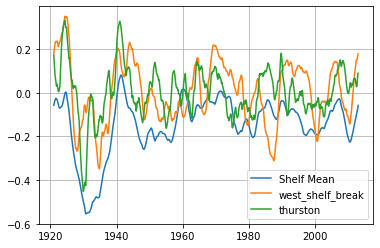

In [86]:
plt.figure()
plt.plot(total['amundsen_shelf_temp_btw_200_700m']['1920':'2013'].index, total['amundsen_shelf_temp_btw_200_700m']['ens06']['1920':'2013'].rolling(24, center=True).mean(), label='Shelf Mean')
for area in bounds:
    plt.plot(ts[area].time, ts[area].mean(dim='ens').values, label=area)

plt.grid(True)
plt.legend()

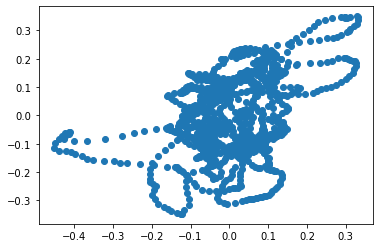

In [88]:
plt.scatter(ts['thurston'], ts['west_shelf_break'])

/tmp/ipykernel_42081/1204828033.py:4: DeprecationWarning: Reductions are applied along the rolling dimension(s) '['time']'. Passing the 'dim' kwarg to reduction operations has no effect.
  plt.plot(ts[area].time, ts[area].mean(dim='ens').rolling(time=5*12, center=True, min_periods=2*12).mean(dim='time').values, label=area)
/tmp/ipykernel_42081/1204828033.py:7: DeprecationWarning: Reductions are applied along the rolling dimension(s) '['time']'. Passing the 'dim' kwarg to reduction operations has no effect.
  plt.plot(ts[area].time, ts[area].mean(dim='ens').values-ts[area].mean(dim='ens').rolling(time=5*12, center=True, min_periods=2*12).mean(dim='time').values, label=area)
/tmp/ipykernel_42081/1204828033.py:9: DeprecationWarning: Reductions are applied along the rolling dimension(s) '['time']'. Passing the 'dim' kwarg to reduction operations has no effect.
  plt.plot(ts[area].time, ts[area].mean(dim='ens').values-ts[area].mean(dim='ens').rolling(time=5*12, center=True, min_periods=2*12

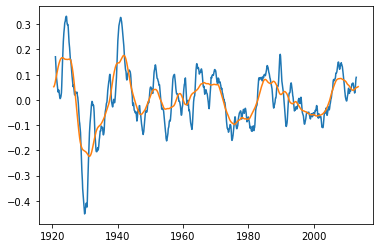

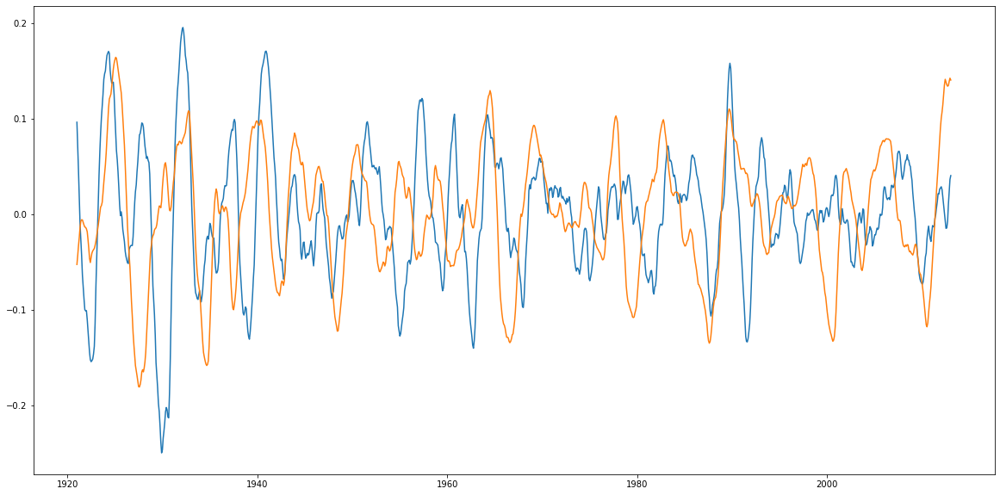

In [95]:
area='thurston'
plt.figure()
plt.plot(ts[area].time, ts[area].mean(dim='ens').values, label=area)
plt.plot(ts[area].time, ts[area].mean(dim='ens').rolling(time=5*12, center=True, min_periods=2*12).mean(dim='time').values, label=area)

plt.figure(figsize=(20,10))
plt.plot(ts[area].time, ts[area].mean(dim='ens').values-ts[area].mean(dim='ens').rolling(time=5*12, center=True, min_periods=2*12).mean(dim='time').values, label=area)
area='west_shelf_break'
plt.plot(ts[area].time, ts[area].mean(dim='ens').values-ts[area].mean(dim='ens').rolling(time=5*12, center=True, min_periods=2*12).mean(dim='time').values, label=area)

array([[[nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        ...,
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan]],

       [[nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        ...,
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan]],

       [[nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        ...,
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan]],

       ...,

       [[nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan

(288, 384, 600)


/tmp/ipykernel_42081/3492389387.py:5: RuntimeWarning: Converting a CFTimeIndex with dates from a non-standard calendar, 'noleap', to a pandas.DatetimeIndex, which uses dates from the standard calendar.  This may lead to subtle errors in operations that depend on the length of time between dates.
  tc=data_dt['THETA'].indexes['time'].to_datetimeindex()[12:-12]
posx and posy should be finite values


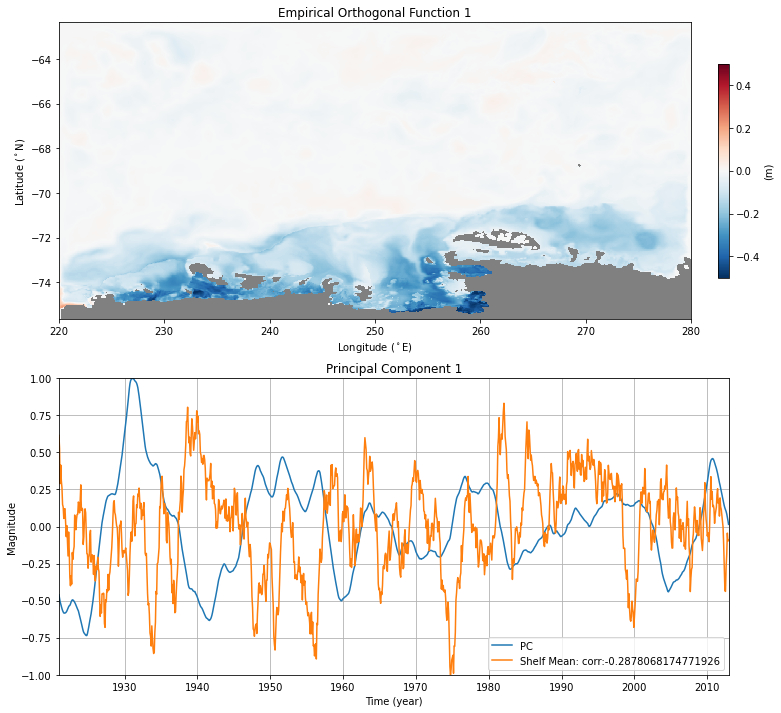

posx and posy should be finite values


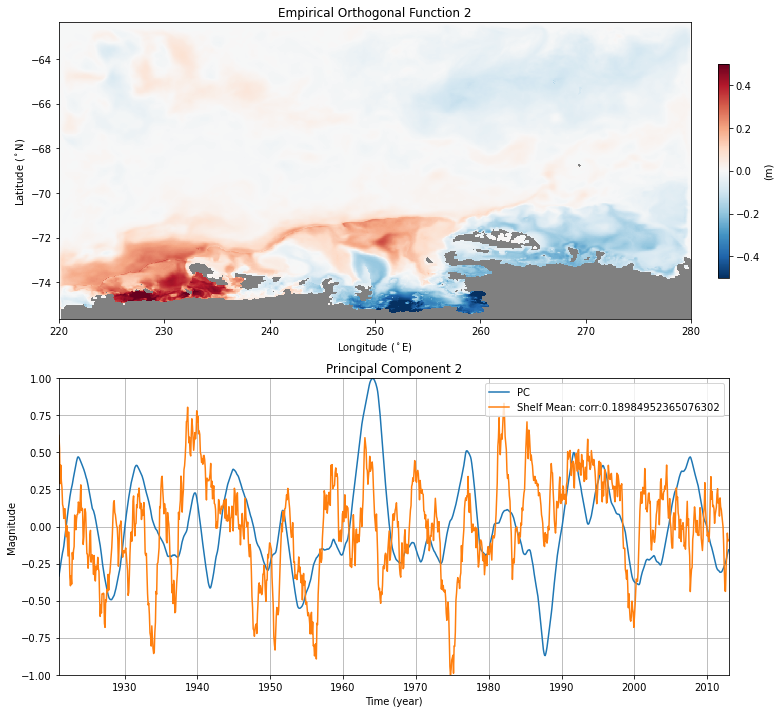

posx and posy should be finite values


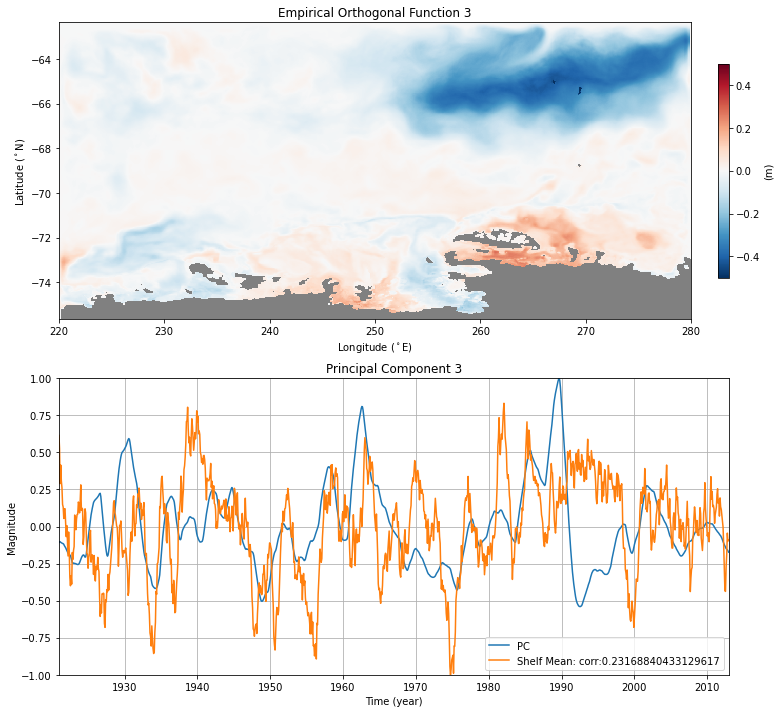

posx and posy should be finite values


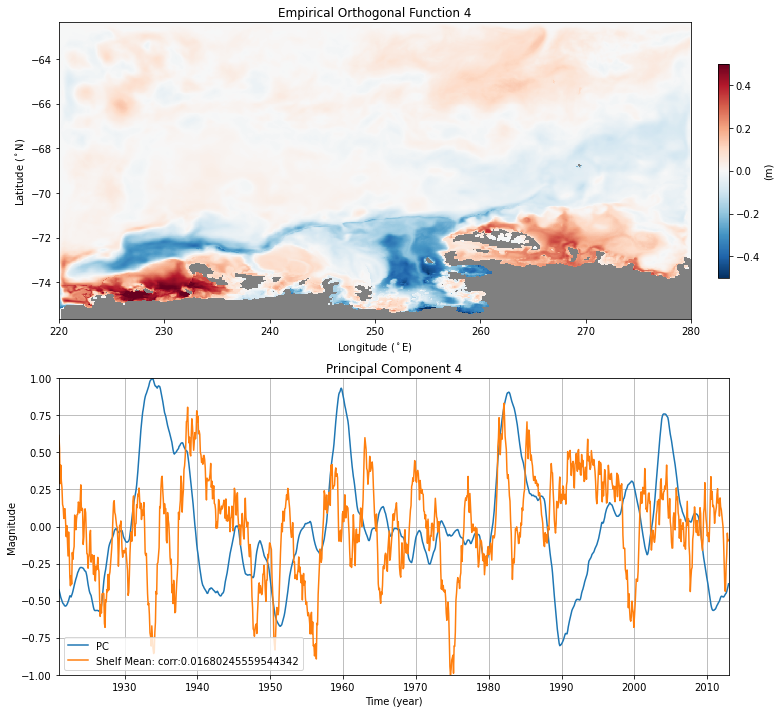

posx and posy should be finite values


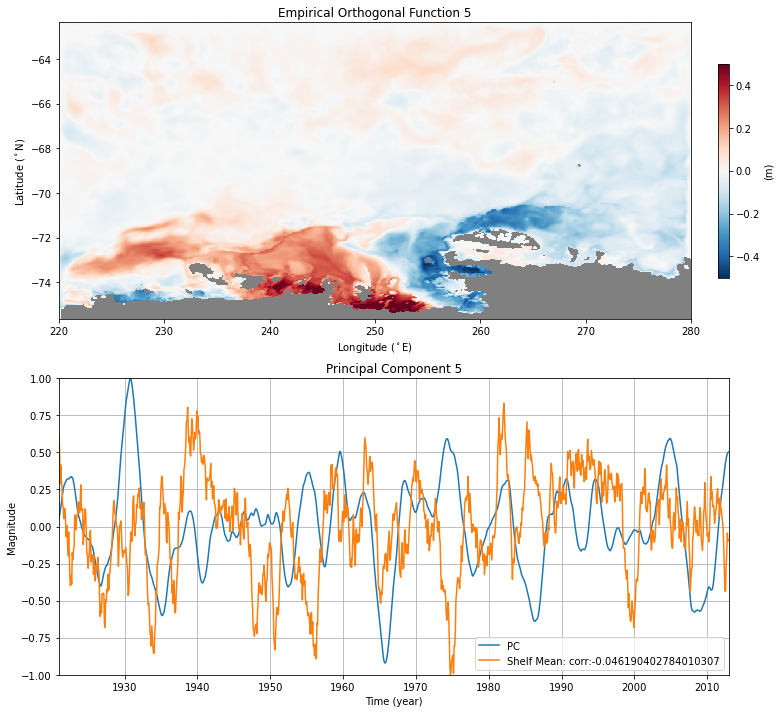

posx and posy should be finite values


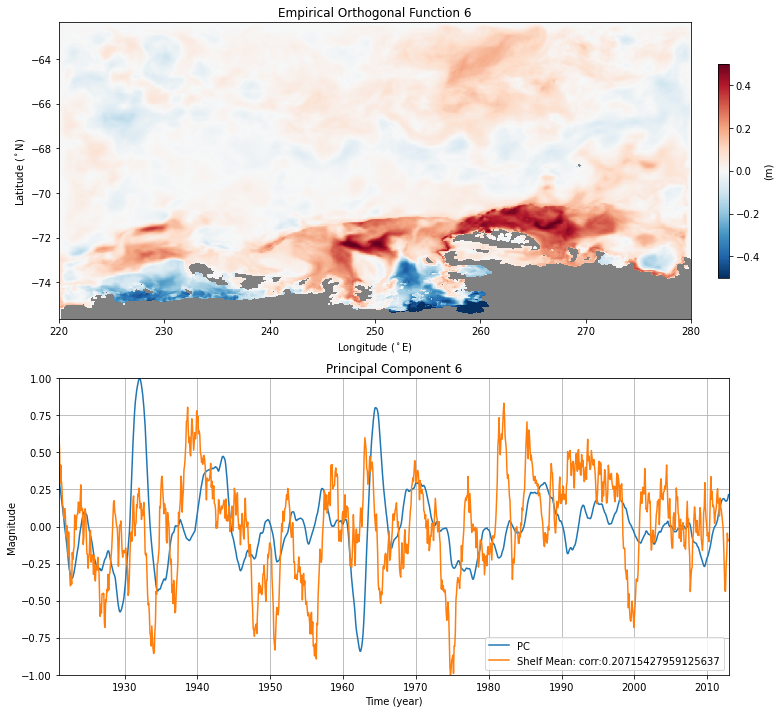

posx and posy should be finite values


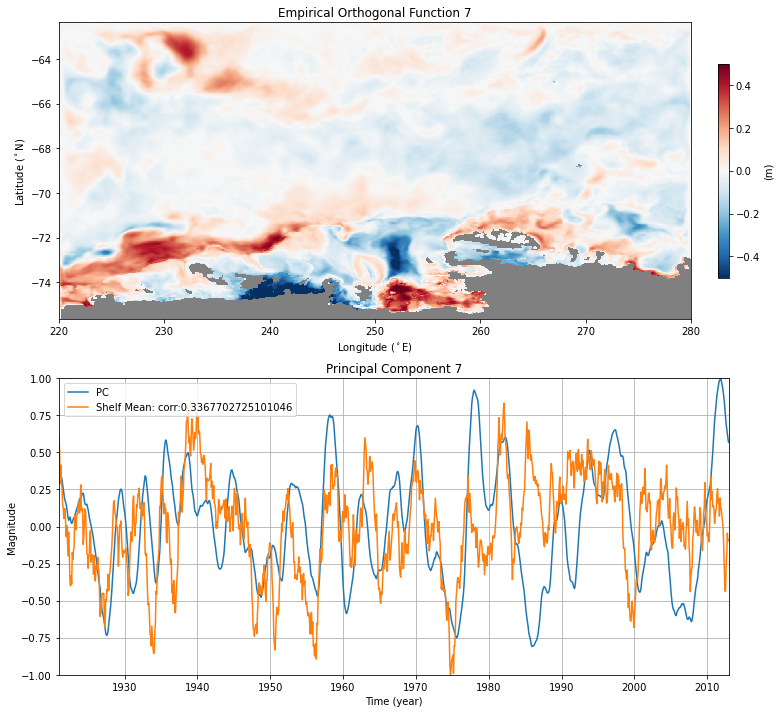

posx and posy should be finite values


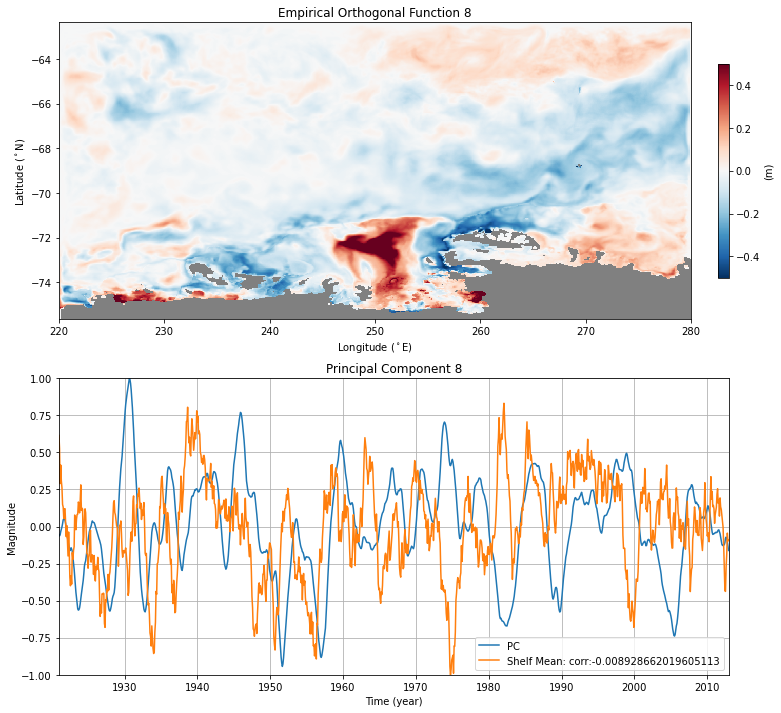

posx and posy should be finite values


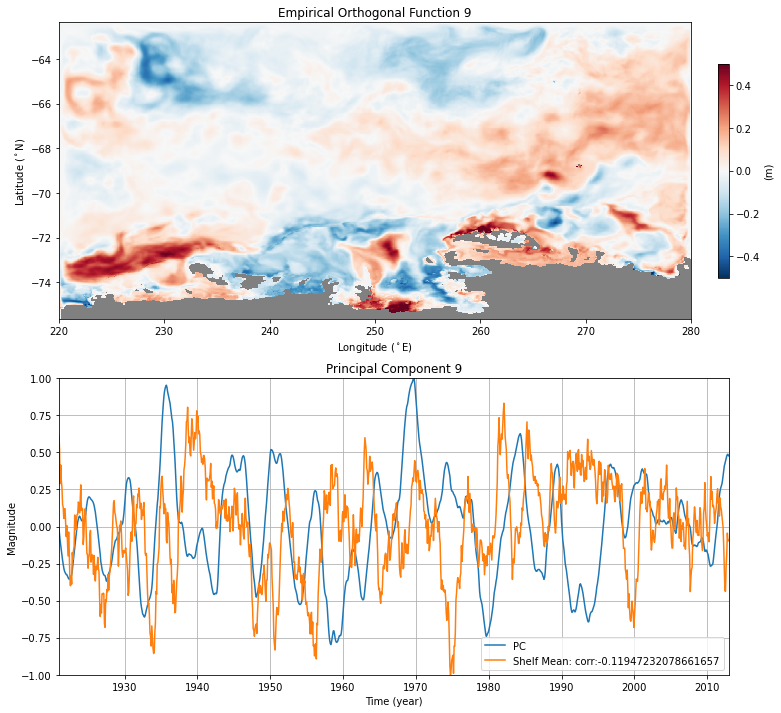

posx and posy should be finite values


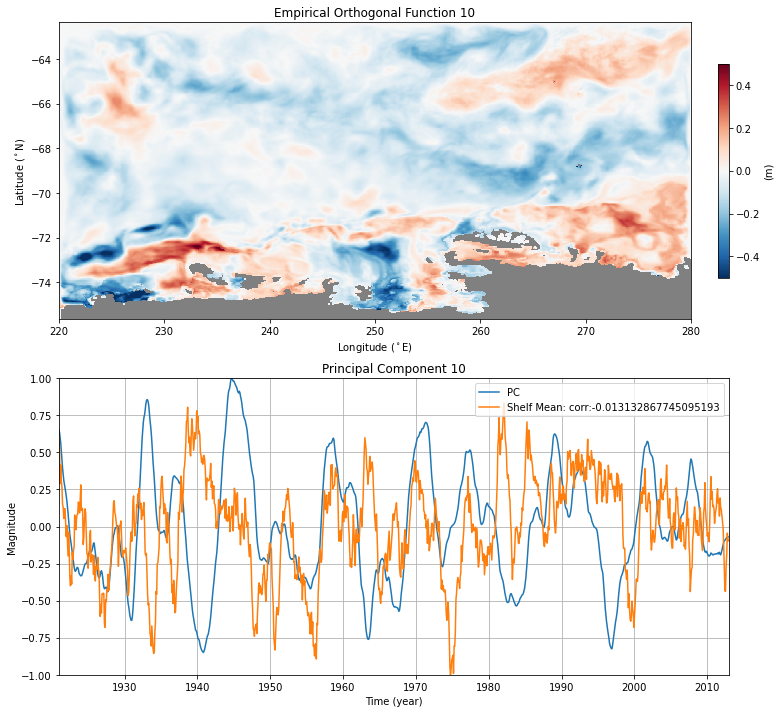

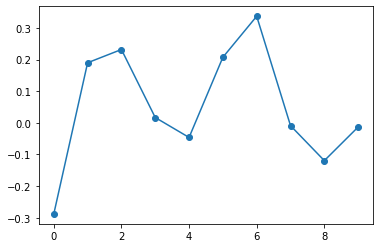

In [153]:
### plot loadings and scores
from matplotlib.colors import Normalize
import matplotlib.colors as colors

tc=data_dt['THETA'].indexes['time'].to_datetimeindex()[12:-12]
#### functions for plotting
class MidpointNormalize(Normalize):
    def __init__(self, vmin=None, vmax=None, midpoint=None, clip=False):
        self.midpoint = midpoint
        Normalize.__init__(self, vmin, vmax, clip)
    def __call__(self, value, clip=None):
        x, y = [self.vmin, self.midpoint, self.vmax], [0, 0.5, 1]
        return np.ma.masked_array(np.interp(value, x, y))
#norm = MidpointNormalize(midpoint=0)

divnorm = colors.TwoSlopeNorm(vmin=-0.5, vmax=0.5, vcenter=0)

#mean=total['amundsen_shelf_temp_btw_200_700m']['ens06']['1920':'2013'].rolling(24, center=True).mean()[12:-12]
#mean=total['pig_massloss']['ens06']['1920':'2013'].rolling(24, center=True).mean()[12:-12]
mean=total['amundsen_shelf_break_uwind_avg']['ens06']['1920':'2013'].rolling(24, center=True).mean()[12:-12]



interest=10
for j in range(0,interest):
    norm = MidpointNormalize(midpoint=0)
    #Plot principal components
    fig, ax = plt.subplots(2,1,figsize=(12,12))
    EOF_recons[j,:,:][EOF_recons[j,:,:]==0]=np.nan
    #im = ax[0].imshow(np.flip(EOF_recons[j,:,:]*max(abs(PCs[j,:])), axis=0), norm=divnorm,
    #cmap=plt.cm.RdBu_r, interpolation='none',extent=[lon[0],lon[-
    #1],lat[0],lat[-1]])
    im = ax[0].pcolor(lon, lat, EOF_recons[j,:,:]*max(abs(PCs[j,:])), norm=divnorm,
    cmap=plt.cm.RdBu_r)
    
    ax[0].set_facecolor('grey')
    cbar=plt.colorbar(im, fraction=0.016, pad=0.04, ax=ax[0])
    cbar.set_label('(m)')
    ax[0].set_xlabel(r'Longitude ($^\circ$E)')
    ax[0].set_ylabel(r'Latitude ($^\circ$N)')
    
    eof=j+1
    ax[0].set_title(r'Empirical Orthogonal Function %i' % eof)
    PCnor=PCs[:,j]/max(abs(PCs[:,j]))
    ax[1].plot(tc,PCnor, label='PC')
    ax[1].plot(tc, (mean-mean.mean())/max(abs(mean-mean.mean())), label='Shelf Mean: corr:{}'.format(str(np.corrcoef(mean, PCnor)[0,1])))
    ax[1].grid()
    ax[1].set_title('Principal Component %i' % eof)
    ax[1].set_xlabel('Time (year)')
    ax[1].set_ylabel('Magnitude')
    ax[1].set_xlim([tc[0],tc[-1]])
    ax[1].set_ylim([-1,1])
    ax[1].legend()
    #plt.savefig(filepath+"EOFandPCnew %i.png" % eof, bbox_inches='tight')
    plt.show()

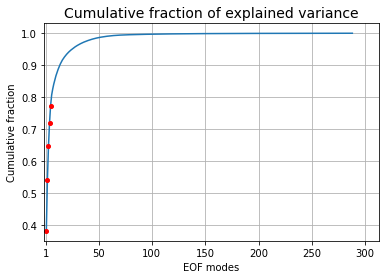

Variance contained in first 10 EOFs:  0.87


Text(0.5, 0, 'Principal Component #')

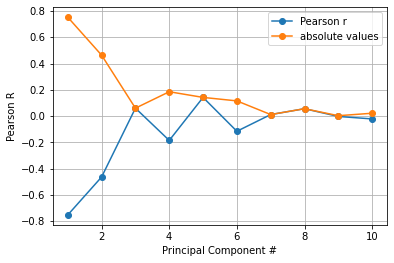

In [224]:
# ### check eigenvalues vs covariance matrix
# print("sum Eigenvalues is:\n", (np.sum(vals)))
# print("sum of diagonals Elements :",np.trace(covdat))
# ### variance modes 1-6
# print("variance explained by first 6 modes:\n",
# (np.sum(vals[0:5])/np.sum(vals)*100))
# ### Plot of cumulative variance
# eofnumber=np.arange(1,len(vals)+1)
# variancecumsum=np.cumsum(vals)/np.sum(vals)*100

variance=skpca.explained_variance_ratio_
variancecumsum=np.cumsum(variance)
eofnumber=np.arange(1,len(variance)+1)

f, ax = plt.subplots(figsize=(6,4))
ax.plot(eofnumber,variancecumsum)
ax.plot(eofnumber[0:5],variancecumsum[0:5],'ro',markersize=4)
ax.set_xlabel('EOF modes')
ax.set_ylabel('Cumulative fraction')
ax.set_title("Cumulative fraction of explained variance",
fontsize=14)
ax.grid()
ax.set_xlim([-1,313])
ax.set_xticks([1,50,100,150,200,250,300])
#plt.savefig(filepath+"cumulativefraction.png", bbox_inches='tight')
plt.show()
print("Variance contained in first 10 EOFs: % .2f" %
variancecumsum[9])




#mean=total['amundsen_shelf_temp_btw_200_700m']['ens06']['1920':'2013'].rolling(24, center=True).mean()[12:-12]
mean=total['dotson_to_cosgrove_massloss']['ens06']['1920':'2013'].rolling(24, center=True).mean()[12:-12]
#mean=total['pig_massloss']['ens06']['1920':'2013'].rolling(24, center=True).mean()[12:-12]
#mean=total['amundsen_shelf_break_uwind_avg']['ens06']['1920':'2013'].rolling(24, center=True).mean()[12:-12]

cors=np.zeros(interest)
for j in range(0,10):
    PCnor=PCs[:,j]/max(abs(PCs[:,j]))
    cors[j]=np.corrcoef(mean, PCnor)[0,1]
    
plt.figure()
plt.plot(range(1,interest+1), cors, 'o-', label='Pearson r')
plt.plot(range(1,interest+1), abs(cors), 'o-', label='absolute values')
#plt.yticks([-1,0,1])
plt.grid()
plt.legend()
plt.ylabel('Pearson R')
plt.xlabel('Principal Component #')

# fig, ax=plt.subplots(4,4, figsize=(20,10))

# for i in range(0,4):
#     PCnor1=PCs[:,i]/max(abs(PCs[:,i]))
#     for j in range(0,4):
#         PCnor=PCs[:,j]/max(abs(PCs[:,j]))
#         ax[i,j].plot(PCnor1)
#         ax[i,j].plot(PCnor)
#         ax[i,j].set_title('Number:'+str(i)+' with'+str(j)+' ; corr:'+str(np.round(np.corrcoef(PCnor1, PCnor)[0,1],2)))
# fig.subplots_adjust(hspace=0.3, wspace=0.3)





In [ ]:
def readMITgcmData_Slice(var, bd='/data/oceans_output/shelf/kaight/mitgcm', members='all', x=106, y=-72.5):
    '''
    var: name of variable (string).
    bd: base directory, with PAS_PACE folders.
    members: members to read ('all' or list with boundaries (e.g. [0, 1] for member 1)).
    '''
    #Creating list with files to read.
    if members=='all':
        pdir=[os.path.join(bd, f) for f in os.listdir(bd) if ('PAS_PACE' in f) & ('hb' not in f)]
        number=20
    else:
        pdir=[os.path.join(bd, f) for f in os.listdir(bd) if ('PAS_PACE' in f) & ('hb' not in f)][members[0]:members[-1]]
        number=members[-1]-members[0]
        
    files=[os.path.join('output', f, 'MITgcm/output.nc') for f in os.listdir('/data/oceans_output/shelf/kaight/mitgcm/PAS_PACE01/output') if (f[0]==str(1)) | (f[0]==str(2))]
    
    #Reading the actual data.
    data=None

    for i, p in enumerate(pdir):
        print(p)
        fd=[os.path.join(p, f) for f in files]
        fd.sort()
        b=xr.open_dataset(fd[0])
        b=b[[var]]
        
        def find_nearest(array, value):
            array = np.asarray(array)
            idx = (np.abs(array - value)).argmin()
            return array[idx]
        
        if 'XC' in b.variables:
            xnew=find_nearest(b.XC.to_numpy(), 360-x)
            b=b.sel(XC=xnew)
        else:
            xnew=find_nearest(b.XG.to_numpy(), 360-x)
            b=b.sel(XG=xnew)
            

        for f in fd[1:]:
            print(f)
            a=xr.open_dataset(f)
            a=a[[var]]
            if 'XC' in a.variables:
                xnew=find_nearest(a.XC.to_numpy(), 360-x)
                a=a.sel(XC=xnew)
            else:
                xnew=find_nearest(a.XG.to_numpy(), 360-x)
                a=a.sel(XG=xnew)
            
            b=xr.concat([b,a], dim='time')
        if i==0:
            data=b
        else:
            data=xr.concat([data,b], dim='ens')
        
    #Making sure that the dataset has the dimension 'ens'
    if number==1:
        data=data.expand_dims("ens")
            
    return data


data=readMITgcmData_Slice(var='THETA', members=[0,1], x=106)

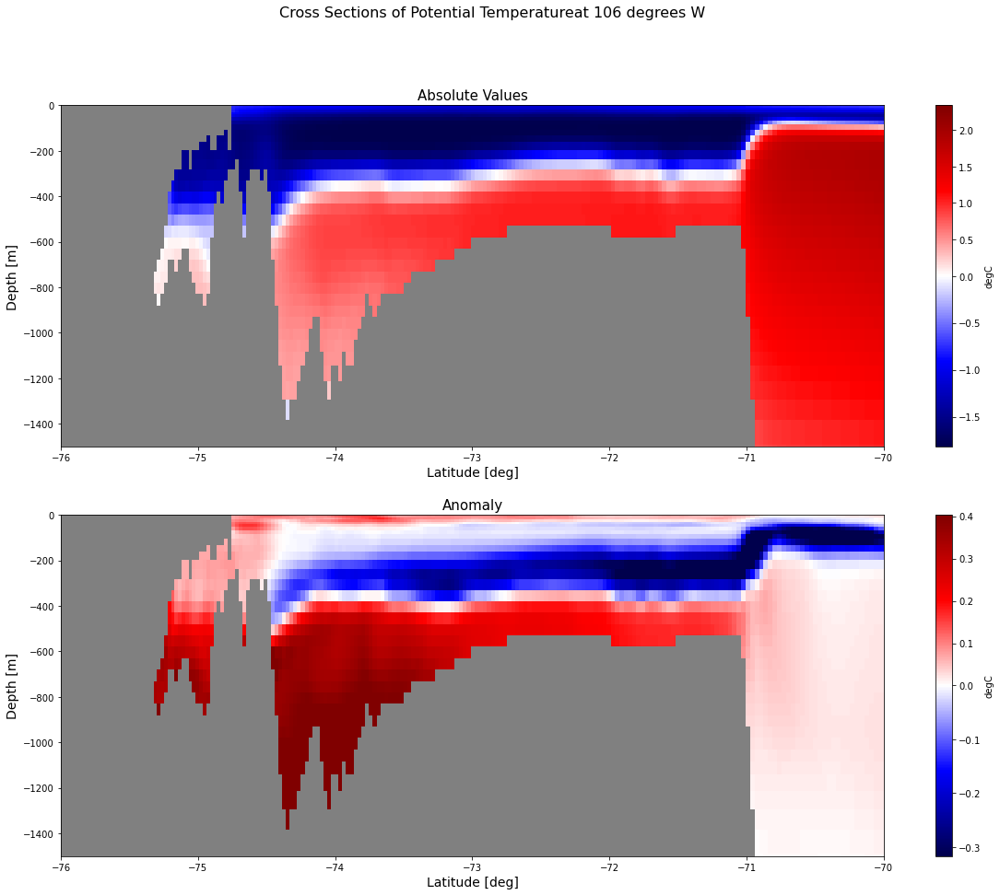

In [202]:
import matplotlib.colors as colors
#divnorm = colors.TwoSlopeNorm(vcenter=0)

var='THETA'
filename='test'

def plotLonSlice(data, var, filename='', x=106):
    fig=plt.figure(figsize=(20, 15))

    title='Cross Sections of '+data_xr['THETA'].long_name + 'at {} degrees W'.format(str(x))
    fig.suptitle(title, fontsize=16, x=0.45)

    a=data[var].mean(dim='time').mean(dim='ens')
    a=a.where(a != 0) 

    ax=plt.subplot(2,1,1)
    divnorm = colors.TwoSlopeNorm(vcenter=0, vmin=np.nanpercentile(a, 1), vmax=np.nanpercentile(a, 99))
    img=ax.pcolormesh( a.YC, a.Z, a, cmap='seismic', norm=divnorm)
    plt.colorbar(img, label=data[var].units)
    ax.set_facecolor('grey')
    ax.set_xlim([-76, -70])
    ax.set_ylim([-1500, 0])
    ax.set_title('Absolute Values', fontsize=15)
    ax.set_xlabel('Latitude [deg]', fontsize=14)
    ax.set_ylabel('Depth [m]', fontsize=14)

    from unixFunctionsMITgcm_final import detrend_and_average_MITgcmData

    data_dt=detrend_and_average_MITgcmData(data, var, window=1)

    a=data_dt.sel(time=slice('1925', '1930')).mean(dim='time').mean(dim='ens')
    a=a.where(a != 0) 

    ax=plt.subplot(2,1,2)
    ax.set_xlim([-76, -70])
    ax.set_ylim([-1500, 0])

    divnorm = colors.TwoSlopeNorm(vcenter=0, vmin=np.nanpercentile(a, 1), vmax=np.nanpercentile(a, 99))
    img=ax.pcolormesh( a.YC, a.Z, a, cmap='seismic', norm=divnorm)
    plt.colorbar(img, label=data[var].units)
    ax.set_facecolor('grey')
    ax.set_title('Anomaly', fontsize=15)
    ax.set_xlabel('Latitude [deg]', fontsize=14)
    ax.set_ylabel('Depth [m]', fontsize=14)

    from datetime import date
    today = date.today()
    today=today.strftime("%Y%m%d")

    fig.savefig('./figures/'+today+'_cross'+str(x)+'W_'+var+'_'+filename+'.png')
    
    return

def plotLatSlice(data, var, filename='', y=-72.5):
    fig=plt.figure(figsize=(20, 15))

    title='Cross Sections of '+data_xr['THETA'].long_name + 'at {} degrees N'.format(str(y))
    fig.suptitle(title, fontsize=16, x=0.45)

    a=data[var].mean(dim='time').mean(dim='ens')
    a=a.where(a != 0) 

    ax=plt.subplot(2,1,1)
    divnorm = colors.TwoSlopeNorm(vcenter=0, vmin=np.nanpercentile(a, 1), vmax=np.nanpercentile(a, 99))
    img=ax.pcolormesh( a.XC, a.Z, a, cmap='seismic', norm=divnorm)
    plt.colorbar(img, label=data[var].units)
    ax.set_facecolor('grey')
    ax.set_xlim([360-120, 360-100])
    ax.set_ylim([-800, 0])
    ax.set_title('Absolute Values', fontsize=15)
    ax.set_xlabel('Longitude [deg]', fontsize=14)
    ax.set_ylabel('Depth [m]', fontsize=14)

    from unixFunctionsMITgcm_final import detrend_and_average_MITgcmData

    data_dt=detrend_and_average_MITgcmData(data, var, window=1)

    a=data_dt.sel(time=slice('1925', '1930')).mean(dim='time').mean(dim='ens')
    a=a.where(a != 0) 

    ax=plt.subplot(2,1,2)
    ax.set_xlim([360-120, 360-100])
    ax.set_ylim([-800, 0])

    divnorm = colors.TwoSlopeNorm(vcenter=0, vmin=np.nanpercentile(a, 1), vmax=np.nanpercentile(a, 99))
    img=ax.pcolormesh( a.XC, a.Z, a, cmap='seismic', norm=divnorm)
    plt.colorbar(img, label=data[var].units)
    ax.set_facecolor('grey')
    ax.set_title('Anomaly', fontsize=15)
    ax.set_xlabel('Longitude [deg]', fontsize=14)
    ax.set_ylabel('Depth [m]', fontsize=14)

    from datetime import date
    today = date.today()
    today=today.strftime("%Y%m%d")

    fig.savefig('./figures/'+today+'_cross'+str(y)+'N_'+var+'_'+filename+'.png')
    
    return


plotLonSlice(data, var='THETA', filename='test')

In [265]:
def makeLatSliceAnimation(data, var, months=[-25,5], title='Composite map or not',
                           filename='map', unit='[m/s]', wvar='dotson_to_cosgrove_massloss', pct=90, larger_than=True, x=106):
    
    #From my code to Kaitlin's code
    from mitgcm_python_master.plot_latlon import latlon_plot
    from mitgcm_python_master.grid import ERA5Grid, PACEGrid, Grid, dA_from_latlon, pierre_obs_grid
    from mitgcm_python_master.utils import real_dir, daily_to_monthly, fix_lon_range, split_longitude, mask_land_ice, moving_average, index_year_start, index_year_end, index_period, mask_2d_to_3d, days_per_month, add_time_dim, z_to_xyz, select_bottom, convert_ismr, mask_except_ice, xy_to_xyz, apply_mask, var_min_max, mask_3d, average_12_months, depth_of_isoline, mask_land, axis_edges
    from mitgcm_python_master.plot_utils.latlon import shade_mask, overlay_vectors
    from mitgcm_python_master.plot_utils.windows import finished_plot, set_panels
    from matplotlib.animation import FuncAnimation
    import matplotlib.animation as animation
    
    fig=plt.figure(figsize=(15,5))
    ax=plt.subplot(1,1,1)
    moi=months[0]
    divnorm = colors.TwoSlopeNorm(vcenter=0, vmin=np.nanpercentile(data[var], 1), vmax=np.nanpercentile(data[var], 99))
    
    a=data[var].sel(time=moi).mean(dim='events')
    a=a.where(a != 0) 
    
    img=ax.pcolormesh( a.YC, a.Z, a, cmap='seismic', norm=divnorm)
    plt.colorbar(img, label=unit)
    ax.set_facecolor('grey')
    ax.set_xlim([-76, -70])
    ax.set_ylim([-1500, 0])
    #ax.set_title('Absolute Values', fontsize=15)
    ax.set_xlabel('Latitude [deg]', fontsize=14)
    ax.set_ylabel('Depth [m]', fontsize=14)

    title_new=title+'\n (time since time of detection: {} months)'.format(str(moi))
    ax.set_title(title_new)
    #if larger_than==True:
    #    title_new=title+'\n (time since time of detection: {} months, threshold: above {} percentile of {})'.format(str(moi), str(pct), wvar)
    #else:
    #    title_new=title+'\n (time since time of detection: {} months, threshold: below {} percentile of {})'.format(str(moi), str(pct), wvar)


    # animation function
    def animate(i):
        print(i)
        moi=i+months[0]


        a=data[var].sel(time=moi).mean(dim='events')
        a=a.where(a != 0) 

        img=ax.pcolormesh( a.YC, a.Z, a, cmap='seismic', norm=divnorm)
        #plt.colorbar(img, label=data[var].units)
        ax.set_facecolor('grey')
        ax.set_xlim([-76, -70])
        ax.set_ylim([-1500, 0])
        #ax.set_title('Absolute Values', fontsize=15)
        ax.set_xlabel('Latitude [deg]', fontsize=14)
        ax.set_ylabel('Depth [m]', fontsize=14)
        
        title_new=title+'(time since time of detection: {} months)'.format(str(moi))
        ax.set_title(title_new)
        
        return 


    from datetime import date
    today = date.today()
    today=today.strftime("%Y%m%d")

    anim = animation.FuncAnimation(fig, animate, frames=months[-1]-months[0], repeat=False, interval=5000)
    writergif = animation.PillowWriter(fps=2)
    anim.save('./figures/'+today+'_anim_cross'+str(x)+'N_'+var+'_'+filename+'.gif', writer=writergif)
    
    return






def createLatAnimation(data, selected, var='THETA', title='Composite map', 
                       filename='map', window=24, method='mean', 
                       longwindow=12*25, 
                       unit='[m/s]',
                       members='all', larger_than=True, pct=90, startyr='1920', endyr='2013', months=[-25, 10], x=106): 
    
    #from unixFunctionsMITgcm_final import makeCompositeAnimation, makeCompositeMap
    
    def month_diff(a, b):
        return round(((a - b)/np.timedelta64(1, 'M')))
    
    #Find the start date per ensemble member.
    start_list=pd.DataFrame()
    for ens in selected.columns:
        start=np.array([False,]*len(selected[ens]))
        for i in range(len(selected[ens])):
            if (selected[ens].iloc[i]==True) & (selected[ens].iloc[i-1]==False):
                start[i]=True
        start_list[ens]=pd.Series(start, index=selected[ens].index)
    
    
    #Load the correct data and give it a relative time name.
    columns=start_list.columns
    columns=columns.sort_values()
    
    
    months=np.arange(months[0], months[-1])
    
    data_new=None
    for month in months:
        b=None
        print('Month is:'+str(month))
        for ensnum, col in enumerate(columns):
            #print(col)
            #print(ensnum)
            true_list=start_list[col][start_list[col]==True]
            for i in range(len(true_list)):
                timestring=(true_list.index[i]+pd.DateOffset(months=month))

                if (timestring<pd.to_datetime(startyr)) | (timestring>pd.to_datetime(endyr)):
                    timestring=true_list.index[i].strftime('%Y-%m-%d')
                    a=data.sel(ens=ensnum).sel(time=timestring)*np.nan
                else:
                    timestring=timestring.strftime('%Y-%m-%d')
                    a=data.sel(ens=ensnum).sel(time=timestring)
                a['time']=[month]
                if type(b)==type(None):
                    b=a
                else:
                    b=xr.concat([b,a], dim='events')
        if type(data_new)==type(None):
            data_new=b
        else:
            data_new=xr.concat([data_new, b], dim='time')
        

    if 'events' not in data_new:
        data_new=data_new.expand_dims("events") 
            
    #Completing the title
    if members=='all':
        title+=' (full ensemble)'
    else:
        title+=' ({} members)'.format(str(members[-1]-members[0]))
        
    title=title+'\n ({} month moving average'.format(str(window))
    if method=='linear':
        title+=', linearly detrended)'
    elif method=='quadratic':
        title+=', quadratically detrended)'
    elif method=='mean':
        title+=',  detrended with {} month rolling mean)'.format(str(longwindow))
    elif method==None:
        title+=')'
    
    
    print('Starting with plotting')
    
    makeLatSliceAnimation(data=data_new, var=var, months=[months[0],months[-1]], title=title, filename=filename, unit=unit, 
                           pct=pct, larger_than=larger_than, x=x)
    
    print('Finished!')
    return


/tmp/ipykernel_30671/911111015.py:5: FutureWarning: Indexing a DataFrame with a datetimelike index using a single string to slice the rows, like `frame[string]`, is deprecated and will be removed in a future version. Use `frame.loc[string]` instead.
  selected['1942-01']=True


Month is:-36
Month is:-35
Month is:-34
Month is:-33
Month is:-32
Month is:-31
Month is:-30
Month is:-29
Month is:-28
Month is:-27
Month is:-26
Month is:-25
Month is:-24
Month is:-23
Month is:-22
Month is:-21
Month is:-20
Month is:-19
Month is:-18
Month is:-17
Month is:-16
Month is:-15
Month is:-14
Month is:-13
Month is:-12
Month is:-11
Month is:-10
Month is:-9
Month is:-8
Month is:-7
Month is:-6
Month is:-5
Month is:-4
Month is:-3
Month is:-2
Month is:-1
Month is:0
Month is:1
Month is:2
Month is:3
Month is:4
Month is:5
Month is:6
Month is:7
Month is:8
Month is:9
Month is:10
Month is:11
Month is:12
Month is:13
Month is:14
Month is:15
Month is:16
Month is:17
Month is:18
Month is:19
Month is:20
Month is:21
Month is:22
Month is:23
Starting with plotting
0
0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58
Finished!


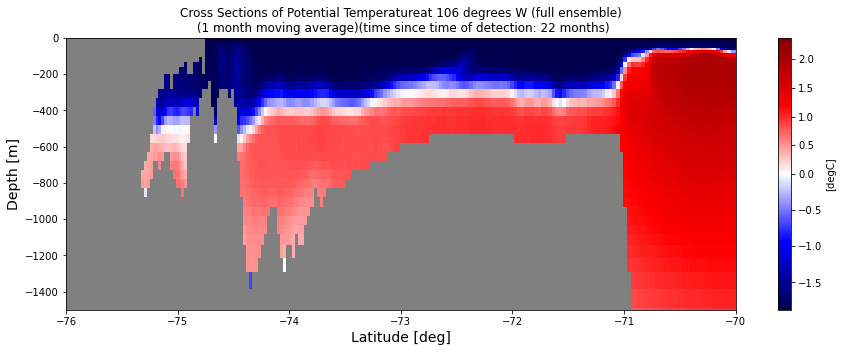

In [268]:
import pandas as pd
ind=pd.date_range('1930', '1950', freq='MS')

selected=pd.DataFrame([False,]*len(ind), index=ind, columns=['ens01'])
selected['1942-01']=True

var='THETA'
x=106



createLatAnimation(data, selected, var=var, title='Cross Sections of '+data[var].long_name + 'at {} degrees W'.format(str(x)), 
                   filename='test', window=1, method=None, 
                   longwindow=12*25, 
                   unit='[degC]',
                   members='all', larger_than=True, pct=90, startyr='1920', endyr='2013', months=[-36, 24], x=106)

# from unixFunctionsMITgcm_final import detrend_and_average_MITgcmData
# data_dt=detrend_and_average_MITgcmData(data, var, window=1)
# createLatAnimation(data_dt.to_dataset(), selected, var=var, title='Cross Sections of Anomaly of '+data[var].long_name + 'at {} degrees W'.format(str(x)), 
#                    filename='test2', window=1, method='mean', 
#                    longwindow=12*25, 
#                    unit='[degC]',
#                    members='all', larger_than=True, pct=90, startyr='1920', endyr='2013', months=[-36, 24], x=106)

In [ ]:
'XC' in data_xr[['THETA']].variables

In [ ]:
import xarray as xr
import matplotlib.pyplot as plt
import numpy as np


# Plot a map of the trend in horizontal advection of heat at the given depth.
def plot_advection_heat_map (base_dir='./', trend_dir='./', fig_dir='./', z0=-400):

    import matplotlib.patheffects as pthe

    base_dir = real_dir(base_dir)
    trend_dir = real_dir(trend_dir)
    fig_dir = real_dir(fig_dir)
    grid_path = base_dir + 'PAS_grid/'
    grid = Grid(grid_path)
    p0 = 0.05
    threshold = 125
    region_labels = ['G', 'D', 'Cr', 'T', 'P', 'Co', 'A', 'V', 'DG', 'PITW', 'PITE', 'PIB', 'BR']
    label_x = [-124, -112.3, -111.5, -106.5, -100.4, -100.5, -95, -87, -117, -111.5, -106, -103.2, -110]
    label_y = [-74.5, -74.375, -75, -75, -75.2, -73.65, -72.9, -73.1, -72.25, -71.45, -71.34, -74.75, -73.95]
    labelsize = [14]*8 + [10]*5
    num_labels = len(region_labels)
    z_shelf = -1000

    # Process the x and y components
    def read_component (key):
        # Read the trends
        var_name = 'ADV'+key+'_TH_trend'
        trends_3d = read_netcdf(trend_dir+var_name+'.nc', var_name)
        # Interpolate to given depth
        trends = interp_to_depth(trends_3d, z0, grid, time_dependent=True)
        # Calculate mean trend and fill with 0s where not significant        
        mean_trend = np.mean(trends, axis=0)
        t_val, p_val = ttest_1samp(trends, 0, axis=0)
        mean_trend[p_val > p0] = 0
        return mean_trend
    advx_trend_ugrid = read_component('x')
    advy_trend_vgrid = read_component('y')
    # Interpolate to tracer grid
    advx_trend = interp_grid(advx_trend_ugrid, grid, 'u', 't')
    advy_trend = interp_grid(advy_trend_vgrid, grid, 'v', 't')
    # Convert to kW/m^2/century
    # Don't worry about divide-by-zero warnings, that's just the land mask where dV=0
    dV = interp_to_depth(grid.dV, z0, grid)
    advx_trend *= Cp_sw*rhoConst*grid.dx_s/dV*1e2*1e-3
    advy_trend *= Cp_sw*rhoConst*grid.dy_w/dV*1e2*1e-3
    # Get magnitude
    magnitude_trend = np.sqrt(advx_trend**2 + advy_trend**2)
    # Now set vectors to 0 anywhere below the threshold, so we don't have too many arrows
    index = magnitude_trend < threshold
    advx_trend = np.ma.masked_where(index, advx_trend)
    advy_trend = np.ma.masked_where(index, advy_trend)

    # Plot
    fig = plt.figure(figsize=(9,5))
    gs = plt.GridSpec(1,1)
    gs.update(left=0.05, right=0.9, bottom=0.05, top=0.9)
    ax = plt.subplot(gs[0,0])
    # Plot the magnitude in red (all positive side of plusminus)
    img = latlon_plot(magnitude_trend, grid, ax=ax, make_cbar=False, ctype='plusminus', ymax=-70, title='Trends in horizontal heat transport at '+str(-z0)+r'm (kW/m$^2$/century)', titlesize=18, vmax=500)
    # Contour shelf break
    bathy = grid.bathy
    bathy[grid.lat_2d < -74.2] = 0
    bathy[(grid.lon_2d > -125)*(grid.lat_2d < -73)] = 0
    bathy[(grid.lon_2d > -110)*(grid.lat_2d < -72)] = 0
    ax.contour(grid.lon_2d, grid.lat_2d, grid.bathy, levels=[z_shelf], colors=('blue'), linewidths=1)
    # Overlay vectors in regions with strongest trends
    overlay_vectors(ax, advx_trend, advy_trend, grid, chunk_x=9, chunk_y=6, scale=1e4, headwidth=4, headlength=5)
    # Add region labels
    for n in range(num_labels):
        txt = plt.text(label_x[n], label_y[n], region_labels[n], fontsize=labelsize[n], ha='center', va='center', weight='bold', color='blue')
        txt.set_path_effects([pthe.withStroke(linewidth=2, foreground='w')])
    cax = fig.add_axes([0.93, 0.15, 0.02, 0.65])
    cbar = plt.colorbar(img, cax=cax, extend='max')
    finished_plot(fig, fig_name=fig_dir+'advection_heat_map.png', dpi=300)











/users/kaight/MITgcm/utils/python/MITgcmutils/MITgcmutils/netcdf.py:330: SyntaxWarning: "is" with a literal. Did you mean "=="?
  if hasattr(self, 'mode') and self.mode is 'w':
/users/kaight/MITgcm/utils/python/MITgcmutils/MITgcmutils/netcdf.py:705: SyntaxWarning: "is not" with a literal. Did you mean "!="?
  if typecode is not 'c':
/data/hpcdata/users/grejan/mitgcm/mitgcm_python_master/projects/pace.py:3025: RuntimeWarning: divide by zero encountered in true_divide
  advx_trend *= Cp_sw*rhoConst*grid.dx_s/dV*1e2*1e-3
/users/grejan/conda-envs/amundsen/lib/python3.9/site-packages/numpy/ma/core.py:4283: RuntimeWarning: invalid value encountered in multiply
  self._data.__imul__(np.where(self._mask, self.dtype.type(1),
/data/hpcdata/users/grejan/mitgcm/mitgcm_python_master/projects/pace.py:3026: RuntimeWarning: divide by zero encountered in true_divide
  advy_trend *= Cp_sw*rhoConst*grid.dy_w/dV*1e2*1e-3
/data/hpcdata/users/grejan/mitgcm/mitgcm_python_master/plot_utils/labels.py:128: User

Saving ./advection_heat_map.png


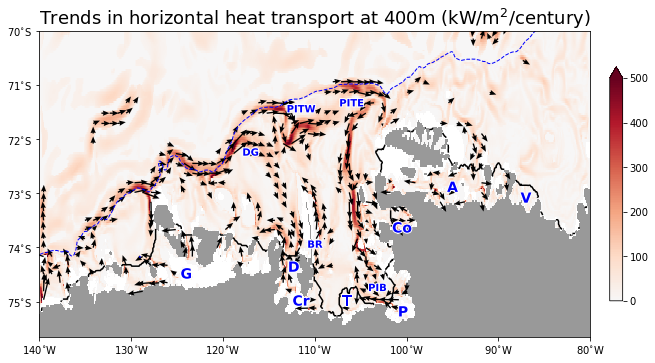

In [11]:
from mitgcm_python_master.projects.pace import plot_advection_heat_map


bd='/data/oceans_output/shelf/kaight/mitgcm/'
td='/data/oceans_output/shelf/kaight/mitgcm/precomputed_trends/'

plot_advection_heat_map (base_dir=bd, trend_dir=td, fig_dir='./', z0=-400)



/users/kaight/MITgcm/utils/python/MITgcmutils/MITgcmutils/netcdf.py:330: SyntaxWarning: "is" with a literal. Did you mean "=="?
  if hasattr(self, 'mode') and self.mode is 'w':
/users/kaight/MITgcm/utils/python/MITgcmutils/MITgcmutils/netcdf.py:705: SyntaxWarning: "is not" with a literal. Did you mean "!="?
  if typecode is not 'c':


[datetime.datetime(1920, 1, 1, 0, 0) datetime.datetime(1920, 2, 1, 0, 0)
 datetime.datetime(1920, 3, 1, 0, 0) ...
 datetime.datetime(2013, 10, 1, 0, 0) datetime.datetime(2013, 11, 1, 0, 0)
 datetime.datetime(2013, 12, 1, 0, 0)]
3D advection: 38.580134715680735 EJ/decade, significance=99.99997577167164%
Vertical diffusion + KPP: 3.5832334326469146 EJ/decade, significance=99.84388698384926%
Shortwave penetration: 0.0016653119326962445 EJ/decade, significance=99.99999710160293%
Total: 42.16503346026048 EJ/decade, significance=99.99995306047282%


/data/hpcdata/users/grejan/mitgcm/mitgcm_python_master/plot_utils/labels.py:170: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(h_labels)
/data/hpcdata/users/grejan/mitgcm/mitgcm_python_master/plot_utils/labels.py:149: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_yticklabels(z_labels)


Saving ./heat_budget.png


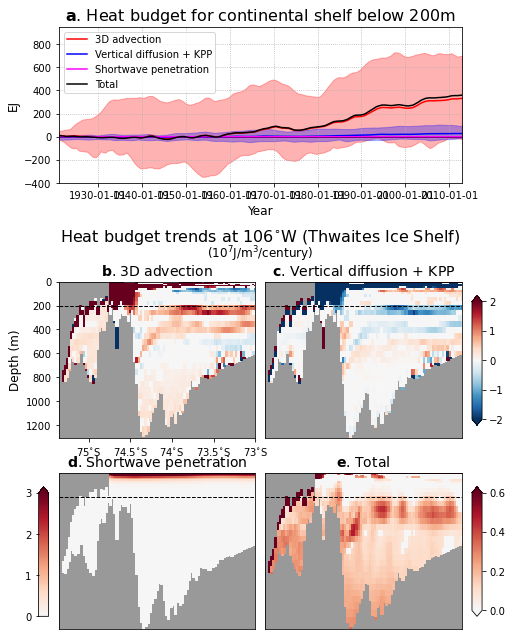

In [1]:
from mitgcm_python_master.projects.pace import plot_heat_budget

bd='/data/oceans_output/shelf/kaight/mitgcm/'
td='/data/oceans_output/shelf/kaight/mitgcm/precomputed_trends/'

plot_heat_budget (base_dir=bd, trend_dir=td, fig_dir='./')

In [1]:
import xarray as xr
data_xr=xr.open_dataset('/data/oceans_output/shelf/kaight/mitgcm/PAS_PACE01/output/189001/MITgcm/output.nc')

In [2]:
data_xr

<xarray.Dataset>
Dimensions:   (time: 12, Z: 50, YC: 384, XG: 600, XC: 600, YG: 384, Zl: 50, Zu: 50, Zp1: 51)
Coordinates: (12/26)
    iter      (time) int64 ...
  * time      (time) object 1890-02-01 00:00:00 ... 1891-01-01 00:00:00
  * XC        (XC) float32 220.1 220.1 220.2 220.4 ... 279.6 279.8 279.9 280.0
  * YC        (YC) float32 -75.64 -75.61 -75.59 -75.56 ... -62.48 -62.44 -62.39
  * XG        (XG) float32 220.0 220.1 220.2 220.3 ... 279.6 279.7 279.8 279.9
  * YG        (YG) float32 -75.65 -75.63 -75.6 -75.58 ... -62.51 -62.46 -62.41
    ...        ...
    drC       (Zp1) float32 ...
    PHrefF    (Zp1) float32 ...
    drF       (Z) float32 ...
    hFacS     (Z, YG, XC) float32 ...
    hFacC     (Z, YC, XC) float32 ...
    hFacW     (Z, YC, XG) float32 ...
Data variables: (12/27)
    UVEL      (time, Z, YC, XG) float32 ...
    EXFswdn   (time, YC, XC) float32 ...
    EXFuwind  (time, YC, XC) float32 ...
    EXFvwind  (time, YC, XC) float32 ...
    EXFlwdn   (time, YC, XC) float32 ...
    EXFpress  (time, YC, XC) float32 ...
    ...        ...
    ADVy_TH   (time, Z, YG, XC) float32 ...
    ADVx_TH   (time, Z, YC, XG) float32 ...
    WVEL      (time, Zl, YC, XC) float32 ...
    SALT      (time, Z, YC, XC) float32 ...
    THETA     (time, Z, YC, XC) float32 ...
    VVEL      (time, Z, YG, XC) float32 ...

In [229]:
data_xr=xr.open_dataset('./data/depth_averaged_UVEL_ens1.nc')

In [236]:
data_xr.sel(time='1920')['UVEL'].to_numpy()

array([[[       nan,        nan,        nan, ...,        nan,
                nan,        nan],
        [       nan,        nan,        nan, ...,        nan,
                nan,        nan],
        [       nan,        nan,        nan, ...,        nan,
                nan,        nan],
        ...,
        [0.04393391, 0.0432433 , 0.043233  , ..., 0.0174111 ,
         0.01794222, 0.01745694],
        [0.03505079, 0.03484787, 0.04100579, ..., 0.01623296,
         0.01682647, 0.01542929],
        [0.02635471, 0.0266131 , 0.04389021, ..., 0.01660903,
         0.01601031, 0.01264232]],

       [[       nan,        nan,        nan, ...,        nan,
                nan,        nan],
        [       nan,        nan,        nan, ...,        nan,
                nan,        nan],
        [       nan,        nan,        nan, ...,        nan,
                nan,        nan],
        ...,
        [0.02422805, 0.02356812, 0.0227563 , ..., 0.02182399,
         0.02076501, 0.01969446],
        [0.0

In [190]:
data_xr['time']=data_xr.indexes['time'].to_datetimeindex()

/tmp/ipykernel_42081/3302356773.py:1: RuntimeWarning: Converting a CFTimeIndex with dates from a non-standard calendar, 'noleap', to a pandas.DatetimeIndex, which uses dates from the standard calendar.  This may lead to subtle errors in operations that depend on the length of time between dates.
  data_xr['time']=data_xr.indexes['time'].to_datetimeindex()


In [222]:
#new_index=[str(i)+'_'+j.strftime("%Y%m%d") for i, j in a.z_time.values]

np.reshape(a.values, (len(data_xr.Z),:))
for i in range(len(data_xr.Z)):
    plt.plot(a.z_time.time.values[:int(len(a.z_time)/len(data_xr.Z))])


SyntaxError: invalid syntax (574906634.py, line 3)

In [195]:
import xarray as xr
import os
import numpy as np


from mitgcm_python_master.utils import mask_2d_to_3d, apply_mask
from mitgcm_python_master.grid import ERA5Grid, PACEGrid, Grid, dA_from_latlon, pierre_obs_grid
from mitgcm_python_master.calculus import vertical_average



data_xr=xr.open_dataset('/data/oceans_output/shelf/kaight/mitgcm/PAS_PACE01/output/194001/MITgcm/output.nc')
z=data_xr.Z

data=data_xr['THETA'].to_numpy()

gp='/data/oceans_output/shelf/kaight/mitgcm/PAS_grid/'
grid = Grid(gp)

z0=[-700, -200]
mask = np.ones([grid.ny, grid.nx]).astype(bool)
mask = mask_2d_to_3d(mask, grid, zmin=z0[0], zmax=z0[1])
data_tmp = apply_mask(data, np.invert(mask), time_dependent=True)
data_new=vertical_average (data_tmp, grid, gtype='t', time_dependent=True)

In [ ]:
def readMITgcmData_depth_averaged(var, bd='/data/oceans_output/shelf/kaight/mitgcm', members='all', z0=[-700, -200], save=False):
    '''
    var: name of variable (string).
    bd: base directory, with PAS_PACE folders.
    members: members to read ('all' or list with boundaries (e.g. [0, 1] for member 1)).
    '''
    
    from mitgcm_python_master.utils import mask_2d_to_3d, apply_mask
    from mitgcm_python_master.grid import ERA5Grid, PACEGrid, Grid, dA_from_latlon, pierre_obs_grid
    from mitgcm_python_master.calculus import vertical_average
    
    gp='/data/oceans_output/shelf/kaight/mitgcm/PAS_grid/'
    grid = Grid(gp)
    mask = np.ones([grid.ny, grid.nx]).astype(bool)
    mask = mask_2d_to_3d(mask, grid, zmin=z0[0], zmax=z0[1])
    
    #Creating list with files to read.
    if members=='all':
        pdir=[os.path.join(bd, f) for f in os.listdir(bd) if ('PAS_PACE' in f) & ('hb' not in f)]
        number=20
    else:
        pdir=[os.path.join(bd, f) for f in os.listdir(bd) if ('PAS_PACE' in f) & ('hb' not in f)][members[0]:members[-1]]
        number=members[-1]-members[0]
        
    files=[os.path.join('output', f, 'MITgcm/output.nc') for f in os.listdir('/data/oceans_output/shelf/kaight/mitgcm/PAS_PACE01/output') if (f[0]==str(1)) | (f[0]==str(2))]
    
    #Reading the actual data.
    data=None

    for i, p in enumerate(pdir):
        print(i)
        print(p)
        fd=[os.path.join(p, f) for f in files]
        fd.sort()
        b=xr.open_dataset(fd[0])
        b=b[[var]]
        if var=='THETA':
            data=b.to_numpy()
            data = apply_mask(data, np.invert(mask), time_dependent=True)
            data=vertical_average (data, grid, gtype='t', time_dependent=True)
            b = xr.DataArray(data, dims=('time', "YC", "XC"), coords={'time': b.time, "YC": b.YC, "XC": b.XC})
            #b=b.sel(Z=slice(-200, -700)).mean(dim='Z')

        for f in fd[1:]:
            a=xr.open_dataset(f)
            a=a[[var]]
            if var=='THETA':
                data=a.to_numpy()
                data = apply_mask(data, np.invert(mask), time_dependent=True)
                data=vertical_average (data, grid, gtype='t', time_dependent=True)
                a = xr.DataArray(data, dims=('time', "YC", "XC"), coords={'time': a.time, "YC": a.YC, "XC": a.XC})
                #a=a.sel(Z=slice(-200, -700)).mean(dim='Z')
            b=xr.concat([b,a], dim='time')
        if save==True:
            b.to_netcdf('./data/new_amundsen_shelf_temp_200to700_ens'+str(i+1)+'.nc')
        if i==0:
            data=b
        else:
            data=xr.concat([data,b], dim='ens')
    if save==True:
#    for i in range(len(data.ens)):
#        
    #Making sure that the dataset has the dimension 'ens'
    if number==1:
        data=data.expand_dims("ens")
            
    return data

In [1]:
import xarray as xr

In [176]:
data=xr.open_dataset('./data/timeseries_ohc_PACE01.nc')


In [177]:
data

<xarray.Dataset>
Dimensions:                       (time: 1488)
Coordinates:
  * time                          (time) object 1890-01-01 00:00:00 ... 2013-...
Data variables:
    amundsen_shelf_ohc_below_0m   (time) float64 ...
    pine_island_bay_ohc_below_0m  (time) float64 ...

In [16]:
data_tmp[3,:,150,150]

masked_array(data=[--, --, --, --, --, --, --, --, --, --, --,
                   -0.24864345788955688, 0.5235344171524048,
                   1.1590611934661865, 1.4687923192977905,
                   1.5371346473693848, 1.5350046157836914,
                   1.5166655778884888, 1.4901727437973022,
                   1.4590884447097778, 1.4249390363693237, --, --, --, --,
                   --, --, --, --, --, --, --, --, --, --, --, --, --, --,
                   --, --, --, --, --, --, --, --, --, --, --],
             mask=[ True,  True,  True,  True,  True,  True,  True,  True,
                    True,  True,  True, False, False, False, False, False,
                   False, False, False, False, False,  True,  True,  True,
                    True,  True,  True,  True,  True,  True,  True,  True,
                    True,  True,  True,  True,  True,  True,  True,  True,
                    True,  True,  True,  True,  True,  True,  True,  True,
                    True,  True],
 

In [18]:
data[3,:,150,150]

array([-0.46239442, -0.46218407, -0.46266612, -0.42620414, -0.5010461 ,
       -1.0348727 , -1.566638  , -1.7456526 , -1.7360519 , -1.540758  ,
       -1.0022984 , -0.24864346,  0.5235344 ,  1.1590612 ,  1.4687923 ,
        1.5371346 ,  1.5350046 ,  1.5166656 ,  1.4901727 ,  1.4590884 ,
        1.424939  ,  1.3891426 ,  1.3530401 ,  1.3163513 ,  1.2799687 ,
        1.2437391 ,  1.207439  ,  1.1713849 ,  1.1355835 ,  1.0983262 ,
        1.057028  ,  1.0102782 ,  0.9580749 ,  0.89874774,  0.8325326 ,
        0.7572777 ,  0.67477775,  0.5863623 ,  0.49343517,  0.39695126,
        0.30221286,  0.24186346,  0.20867679,  0.        ,  0.        ,
        0.        ,  0.        ,  0.        ,  0.        ,  0.        ],
      dtype=float32)

In [19]:
z

<xarray.DataArray 'Z' (Z: 50)>
array([-5.0000e+00, -1.5000e+01, -2.5000e+01, -3.5000e+01, -4.6000e+01,
       -5.9250e+01, -7.5250e+01, -9.4500e+01, -1.1750e+02, -1.4500e+02,
       -1.7750e+02, -2.1500e+02, -2.5750e+02, -3.0500e+02, -3.5500e+02,
       -4.0500e+02, -4.5500e+02, -5.0500e+02, -5.5500e+02, -6.0500e+02,
       -6.5500e+02, -7.0500e+02, -7.5500e+02, -8.0500e+02, -8.5500e+02,
       -9.0500e+02, -9.5500e+02, -1.0050e+03, -1.0550e+03, -1.1100e+03,
       -1.1750e+03, -1.2500e+03, -1.3350e+03, -1.4325e+03, -1.5475e+03,
       -1.6850e+03, -1.8475e+03, -2.0350e+03, -2.2475e+03, -2.4850e+03,
       -2.7600e+03, -3.0600e+03, -3.3600e+03, -3.6600e+03, -3.9600e+03,
       -4.2600e+03, -4.5600e+03, -4.8600e+03, -5.1600e+03, -5.4600e+03],
      dtype=float32)
Coordinates:
  * Z        (Z) float32 -5.0 -15.0 -25.0 ... -4.86e+03 -5.16e+03 -5.46e+03
    PHrefC   (Z) float32 ...
    drF      (Z) float32 ...
Attributes:
    units:          m
    positive:       down
    standard_name:  depth
    long_name:      vertical coordinate of cell center
    axis:           Z

In [227]:
np.arange(12).reshape(3,4)

array([[ 0,  1,  2,  3],
       [ 4,  5,  6,  7],
       [ 8,  9, 10, 11]])

In [1]:
os.listdir('/data/oceans_output/shelf/kaight/mitgcm/PAS_PACE01/output/194001/')

NameError: name 'os' is not defined

In [32]:
hoi = xr.DataArray(data_new, dims=('time', "YC", "XC"), coords={'time': data_xr.time, "YC": data_xr.YC, "XC": data_xr.XC})
hoi



<xarray.DataArray (time: 12, YC: 384, XC: 600)>
array([[[       nan,        nan,        nan, ...,        nan,
                nan,        nan],
        [       nan,        nan,        nan, ...,        nan,
                nan,        nan],
        [       nan,        nan,        nan, ...,        nan,
                nan,        nan],
        ...,
        [1.56527806, 1.46811511, 1.46341959, ..., 1.83009702,
         1.87751236, 2.04245829],
        [1.56472005, 1.44480572, 1.43909282, ..., 1.88574703,
         1.91995975, 2.04887675],
        [1.56391717, 1.55657881, 1.56509211, ..., 2.04177179,
         2.04283884, 2.05510961]],

       [[       nan,        nan,        nan, ...,        nan,
                nan,        nan],
        [       nan,        nan,        nan, ...,        nan,
                nan,        nan],
        [       nan,        nan,        nan, ...,        nan,
                nan,        nan],
...
        [1.55527949, 1.52943976, 1.51540686, ..., 2.21301895,
         2.22176477, 2.22859533],
        [1.55732501, 1.52443934, 1.51371022, ..., 2.21693256,
         2.21840891, 2.24009134],
        [1.55915519, 1.55009924, 1.55462883, ..., 2.22819574,
         2.22967537, 2.25101799]],

       [[       nan,        nan,        nan, ...,        nan,
                nan,        nan],
        [       nan,        nan,        nan, ...,        nan,
                nan,        nan],
        [       nan,        nan,        nan, ...,        nan,
                nan,        nan],
        ...,
        [1.55988162, 1.50576914, 1.5030552 , ..., 2.12335994,
         2.12660107, 2.11496707],
        [1.56028677, 1.49049772, 1.48633578, ..., 2.11022376,
         2.10949621, 2.1269064 ],
        [1.56061388, 1.55524833, 1.55968736, ..., 2.11436144,
         2.11580842, 2.13811452]]])
Coordinates:
  * time     (time) object 1940-02-01 00:00:00 ... 1941-01-01 00:00:00
  * YC       (YC) float32 -75.64 -75.61 -75.59 -75.56 ... -62.48 -62.44 -62.39
  * XC       (XC) float32 220.1 220.1 220.2 220.4 ... 279.6 279.8 279.9 280.0

In [33]:
hoi

<xarray.Dataset>
Dimensions:  (time: 12, YC: 384, XC: 600)
Coordinates:
  * time     (time) object 1940-02-01 00:00:00 ... 1941-01-01 00:00:00
  * YC       (YC) float32 -75.64 -75.61 -75.59 -75.56 ... -62.48 -62.44 -62.39
  * XC       (XC) float32 220.1 220.1 220.2 220.4 ... 279.6 279.8 279.9 280.0
Data variables:
    THETA    (time, YC, XC) float64 nan nan nan nan ... 2.114 2.114 2.116 2.138

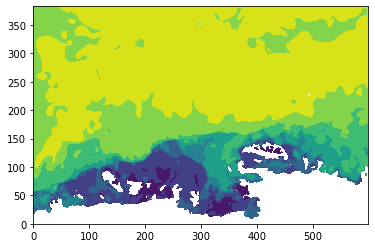

In [28]:
plt.contourf(hoi.values[0,:,:])

In [27]:
import matplotlib.pyplot as plt

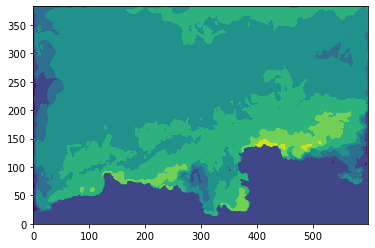

In [30]:
plt.contourf(data_xr.THETA.values[0,0,:,:])

In [1]:
import xarray as xr
import numpy as np

In [2]:
r=xr.open_dataset('./data/new2_amundsen_shelf_temp_200to700_ens1.nc')
k=xr.open_dataset('./data/amundsen_shelf_temp_200to700_ens1.nc')

In [8]:
np.shape(r.THETA)

(1488, 384, 600)

In [11]:
o=xr.concat([r,k], dim='ens')

In [15]:
np.shape(o.THETA)

(2, 1488, 384, 600)

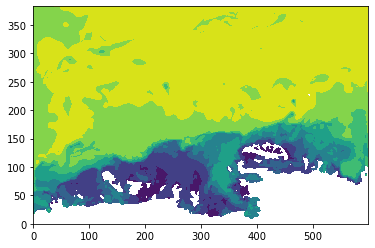

In [3]:
import matplotlib.pyplot as plt
plt.contourf(r.THETA.values[500,:,:])

In [17]:
plt.plot()

array([[[       nan,        nan,        nan, ...,        nan,
                nan,        nan],
        [       nan,        nan,        nan, ...,        nan,
                nan,        nan],
        [       nan,        nan,        nan, ...,        nan,
                nan,        nan],
        ...,
        [1.56527806, 1.42877997, 1.42157543, ..., 2.08526145,
         2.07692387, 2.04245829],
        [1.56472005, 1.4065944 , 1.39895208, ..., 2.05165953,
         2.03226045, 2.04887675],
        [1.56391717, 1.55657881, 1.56509211, ..., 2.04177179,
         2.04283884, 2.05510961]],

       [[       nan,        nan,        nan, ...,        nan,
                nan,        nan],
        [       nan,        nan,        nan, ...,        nan,
                nan,        nan],
        [       nan,        nan,        nan, ...,        nan,
                nan,        nan],
        ...,
        [1.59509484, 1.51710036, 1.50113713, ..., 2.14274713,
         2.14923096, 2.13850379],
        [1.5

In [22]:
from sys import getsizeof
getsizeof(r.THETA.values[:,:,:])

136

In [26]:
r.THETA.size

342835200

In [27]:
k.THETA.size

342835200